In [2]:
from transformers import AutoTokenizer, AutoModelForCausalLM

tokenizer = AutoTokenizer.from_pretrained("meta-llama/Llama-3.1-8b", revision="main")
tokenizer.pad_token = tokenizer.eos_token

/home/vincent/miniconda3/envs/thesis/lib/python3.13/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [3]:
model = AutoModelForCausalLM.from_pretrained("meta-llama/Llama-3.1-8b", trust_remote_code=True)
model.config.pad_token_id = tokenizer.pad_token_id
model.config._attn_implementation = "eager"
model.to('cuda')

Loading checkpoint shards: 100%|██████████| 4/4 [00:16<00:00,  4.21s/it]


LlamaForCausalLM(
  (model): LlamaModel(
    (embed_tokens): Embedding(128256, 4096)
    (layers): ModuleList(
      (0-31): 32 x LlamaDecoderLayer(
        (self_attn): LlamaAttention(
          (q_proj): Linear(in_features=4096, out_features=4096, bias=False)
          (k_proj): Linear(in_features=4096, out_features=1024, bias=False)
          (v_proj): Linear(in_features=4096, out_features=1024, bias=False)
          (o_proj): Linear(in_features=4096, out_features=4096, bias=False)
        )
        (mlp): LlamaMLP(
          (gate_proj): Linear(in_features=4096, out_features=14336, bias=False)
          (up_proj): Linear(in_features=4096, out_features=14336, bias=False)
          (down_proj): Linear(in_features=14336, out_features=4096, bias=False)
          (act_fn): SiLU()
        )
        (input_layernorm): LlamaRMSNorm((4096,), eps=1e-05)
        (post_attention_layernorm): LlamaRMSNorm((4096,), eps=1e-05)
      )
    )
    (norm): LlamaRMSNorm((4096,), eps=1e-05)
    (rotary_

In [4]:
attn_maps = {}

def save_attention_hook(layer_idx):
    def hook(module, input, output):
        attn_output, attn_weights = output
        attn_maps[layer_idx] = attn_weights.detach().cpu()
    return hook

# Register hooks
for idx, layer in enumerate(model.model.layers):
    layer.self_attn.register_forward_hook(save_attention_hook(idx))


In [5]:
import pandas as pd

df = pd.DataFrame(
    {
        "Name": ["John", "Jane Lastname"],
        "Age": [30, 25],
    })

separator = '\u0488'
prompt_pre = "This is a table\n\n"
prompt_table = df.to_csv(index=False, sep=separator)
prompt_post = "\nHow old is Jane?\n\nAnswer:"
prompt = prompt_pre + prompt_table + prompt_post
print(prompt)

This is a table

Name҈Age
John҈30
Jane Lastname҈25

How old is Jane?

Answer:


In [6]:
from io import StringIO

prompt_pre = """You are a table analyst. Your task is to answer questions based on the table content.


The answer should follow the format below:
[Answer Format]
Final Answer: AnswerName1, AnswerName2...

Ensure the final answer format is the last output line and can only be in the "Final Answer: AnswerName1, AnswerName2..." form, no other form. Ensure the "AnswerName" is a number or entity name, as short as possible, without any explanation.

Give the final answer to the question directly without any explanation.

Read the table below:
[TABLE]
"""
prompt_table = """
club\u0009played\u0009drawn\u0009lost\u0009points for\u0009points against\u0009points difference\u0009tries for\u0009tries against\u0009try bonus\u0009losing bonus\u0009points
wattstown rfc\u000916\u00090\u00090\u0009361\u0009117\u0009+ 244\u000939\u000914\u00095\u00090\u000969
bryncethin rfc\u000916\u00090\u00094\u0009306\u0009184\u0009+ 122\u000941\u000926\u00096\u00092\u000956
crc caerdydd rfc\u000916\u00090\u00095\u0009280\u0009197\u0009+ 83\u000939\u000923\u00094\u00091\u000949
cambrian welfare rfc\u000916\u00091\u00098\u0009336\u0009209\u0009+ 127\u000949\u000920\u00095\u00096\u000941
glyncoch rfc\u000916\u00090\u000910\u0009206\u0009248\u0009- 42\u000925\u000931\u00091\u00096\u000931
llanrumney rfc\u000916\u00091\u000910\u0009277\u0009304\u0009- 27\u000936\u000938\u00093\u00093\u000928
ynysowen rfc\u000916\u00090\u000911\u0009240\u0009339\u0009- 99\u000928\u000949\u00090\u00093\u000923
caerau ely rfc\u000916\u00090\u000912\u0009163\u0009273\u0009- 110\u000921\u000933\u00092\u00094\u000922
llandrindod wells rfc\u000916\u00090\u000911\u0009155\u0009453\u0009- 298\u000918\u000962\u00090\u00091\u000921
""".strip()
table = pd.read_csv(StringIO(prompt_table), sep='\u0009')
print(table)
prompt_post = """

Let's get start!
Question: How many points did Wattstown RFC score in the season?

Final Answer: """

prompt = prompt_pre + prompt_table + prompt_post

                    club  played  drawn  lost  points for  points against  \
0          wattstown rfc      16      0     0         361             117   
1         bryncethin rfc      16      0     4         306             184   
2       crc caerdydd rfc      16      0     5         280             197   
3   cambrian welfare rfc      16      1     8         336             209   
4           glyncoch rfc      16      0    10         206             248   
5         llanrumney rfc      16      1    10         277             304   
6           ynysowen rfc      16      0    11         240             339   
7         caerau ely rfc      16      0    12         163             273   
8  llandrindod wells rfc      16      0    11         155             453   

  points difference  tries for  tries against  try bonus  losing bonus  points  
0             + 244         39             14          5             0      69  
1             + 122         41             26          6           

In [7]:
# tokens_pre = tokenizer.tokenize(prompt_pre, return_tensors="pt")
# # tokens_table = tokenizer.tokenize(prompt_table, return_tensors="pt")

# content_ids = set()
# rows_ids = [[]]*(table.shape[0] + 1)
# cols_ids = [[]]*table.shape[1]
# tokens_table = []

# newline_tokens = tokenizer.tokenize("\n", return_tensors="pt")
# newline_n_tokens = len(newline_tokens)
# separator_tokens = tokenizer.tokenize(separator, return_tensors="pt")
# separator_n_tokens = len(separator_tokens)

# id_count = len(tokens_pre)# + 1

# for i, header in enumerate(table.columns):

#     # print(i)
#     # print(header)

#     cell_tokens = tokenizer.tokenize(str(header))
#     tokens_table.extend(cell_tokens)

#     cell_idxs = []
#     # print(cell_tokens)
#     for i in range(len(cell_tokens)):
#         cell_idxs.append(id_count + i)
#         content_ids.add(id_count + i)
#     rows_ids[0].append(cell_idxs)
#     cols_ids[i].append(cell_idxs)
#     tokens_table.extend(cell_tokens)
#     id_count += len(cell_tokens)

#     if i < len(table.columns) - 1:
#         tokens_table.extend(separator_tokens)
#         id_count += separator_n_tokens

# tokens_table.extend(newline_tokens)
# id_count += newline_n_tokens

# for ri, row in table.iterrows():
#     for i, col in enumerate(row):

#         cell_tokens = tokenizer.tokenize(str(col))
#         tokens_table.extend(cell_tokens)

#         cell_idxs = []
#         for i in range(len(cell_tokens)):
#             content_ids.add(id_count + i)
#             cell_idxs.append(id_count + i)
#         rows_ids[ri + 1].append(cell_idxs)
#         cols_ids[i].append(cell_idxs)
#         tokens_table.extend(cell_tokens)
#         id_count += len(cell_tokens)

#         if i < len(row) - 1:
#             tokens_table.extend(separator_tokens)
#             id_count += separator_n_tokens

#     tokens_table.extend(newline_tokens)
#     id_count += newline_n_tokens

# tokens_table = tokens_table[:-len(newline_tokens)]  # Remove the last separator
    
# tokens_post = tokenizer.tokenize(prompt_post, return_tensors="pt")
# tokens = tokens_pre + tokens_table + tokens_post

# text_ids = list(range(len(tokens_pre))) + list(range(len(tokens_pre) + len(tokens_table), len(tokens_pre) + len(tokens_table) + len(tokens_post)))
# table_ids = list(range(len(tokens_pre), len(tokens_pre) + len(tokens_table)))

# Tokenize the text prompt before the table.
tokens_pre = tokenizer.tokenize(prompt_pre, return_tensors="pt")

content_ids = set()

rows_ids = [[] for _ in range(table.shape[0] + 1)]
cols_ids = [[] for _ in range(table.shape[1])]
tokens_table = []

newline_tokens = tokenizer.tokenize("\n", return_tensors="pt")
separator_tokens = tokenizer.tokenize(separator, return_tensors="pt")
newline_n_tokens = len(newline_tokens)
separator_n_tokens = len(separator_tokens)

id_count = len(tokens_pre)

for col_idx, header in enumerate(table.columns):
    cell_tokens = tokenizer.tokenize(str(header))
    
    cell_start = id_count
    cell_idxs = list(range(cell_start, cell_start + len(cell_tokens)))
    
    tokens_table.extend(cell_tokens)
    content_ids.update(cell_idxs)
    
    rows_ids[0].append(cell_idxs)
    cols_ids[col_idx].append(cell_idxs)
    
    id_count += len(cell_tokens)
    
    if col_idx < len(table.columns) - 1:
        tokens_table.extend(separator_tokens)
        id_count += separator_n_tokens

tokens_table.extend(newline_tokens)
id_count += newline_n_tokens

for row_idx, (_, row) in enumerate(table.iterrows()):
    for col_idx, cell in enumerate(row):
        cell_tokens = tokenizer.tokenize(str(cell))
        
        cell_start = id_count
        cell_idxs = list(range(cell_start, cell_start + len(cell_tokens)))
        
        tokens_table.extend(cell_tokens)
        content_ids.update(cell_idxs)
        
        rows_ids[row_idx + 1].append(cell_idxs)
        cols_ids[col_idx].append(cell_idxs)
        
        id_count += len(cell_tokens)
        
        if col_idx < len(row) - 1:
            tokens_table.extend(separator_tokens)
            id_count += separator_n_tokens
    
    tokens_table.extend(newline_tokens)
    id_count += newline_n_tokens

if newline_n_tokens > 0:
    tokens_table = tokens_table[:-newline_n_tokens]
    id_count -= newline_n_tokens

tokens_post = tokenizer.tokenize(prompt_post, return_tensors="pt")
tokens = tokens_pre + tokens_table + tokens_post

text_ids = list(range(len(tokens_pre))) + list(
    range(len(tokens_pre) + len(tokens_table), len(tokens_pre) + len(tokens_table) + len(tokens_post))
)
table_ids = list(range(len(tokens_pre), len(tokens_pre) + len(tokens_table)))

print(rows_ids)
print(tokens_table)

print("Rows:")
for row in rows_ids:
    for cell in row:
        print('"', end='')
        for token_id in cell:
            print(tokens[token_id], end='')
        print('",', end=' ')
    print()

print("Cols:")
for col in cols_ids:
    for cell in col:
        print('"', end='')
        for token_id in cell:
            print(tokens[token_id], end='')
        print('",', end=' ')
    print()

[[[117], [120], [123, 124], [127], [130, 131], [134, 135], [138, 139], [142, 143], [146, 147], [150, 151], [154, 155], [158]], [[160, 161, 162, 163, 164], [167], [170], [173], [176], [179], [182, 183, 184], [187], [190], [193], [196], [199]], [[201, 202, 203, 204, 205, 206, 207], [210], [213], [216], [219], [222], [225, 226, 227], [230], [233], [236], [239], [242]], [[244, 245, 246, 247, 248, 249, 250], [253], [256], [259], [262], [265], [268, 269, 270], [273], [276], [279], [282], [285]], [[287, 288, 289, 290, 291, 292], [295], [298], [301], [304], [307], [310, 311, 312], [315], [318], [321], [324], [327]], [[329, 330, 331, 332, 333, 334], [337], [340], [343], [346], [349], [352, 353, 354], [357], [360], [363], [366], [369]], [[371, 372, 373, 374, 375, 376], [379], [382], [385], [388], [391], [394, 395, 396], [399], [402], [405], [408], [411]], [[413, 414, 415, 416, 417, 418], [421], [424], [427], [430], [433], [436, 437, 438], [441], [444], [447], [450], [453]], [[455, 456, 457, 458,

In [8]:
# curr_row, curr_col = 0, 0
# newline_tokens = tokenizer.tokenize("\n", return_tensors="pt")
# separator_tokens = tokenizer.tokenize(separator, return_tensors="pt")

# content_ids = set()
# rows_ids = []
# cols_ids = []
# just_added_col = False

# for token_id in table_ids:
#     if  tokens[token_id] in newline_tokens:
#         curr_row += 1
#         curr_col = 0

#     if len(rows_ids) <= curr_row:
#         rows_ids.append([])
#     if len(cols_ids) <= curr_col:
#         cols_ids.append([])
    
#     if  tokens[token_id] in separator_tokens and not just_added_col:
#         curr_col += 1
#         just_added_col = True
#     else:
#         just_added_col = False

#     if tokens[token_id] not in separator_tokens and tokens[token_id] not in newline_tokens:
#         if len(rows_ids[curr_row]) <= curr_col:
#             rows_ids[curr_row].append([])
#         if len(cols_ids[curr_col]) <= curr_row:
#             cols_ids[curr_col].append([])

#         rows_ids[curr_row][curr_col].append(token_id)
#         cols_ids[curr_col][curr_row].append(token_id)
#         content_ids.add(token_id)

# irrelevant_ids = set(table_ids) - content_ids
attention_pairs = set()

for row in rows_ids:
    for i, cell in enumerate(row):
        for ti, token_id in enumerate(cell):

            for token_id2 in cell[ti + 1:]:
                attention_pairs.add((token_id, token_id2))

            for cell2 in row[i + 1:]:
                for token_id2 in cell2:
                    attention_pairs.add((token_id, token_id2))

for col in cols_ids:
    for i, cell in enumerate(col):
        for token_id in cell:
            for cell2 in col[i + 1:]:
                for token_id2 in cell2:
                    attention_pairs.add((token_id, token_id2))

print(attention_pairs)

{(246, 290), (373, 394), (163, 292), (417, 437), (457, 473), (269, 273), (183, 270), (161, 331), (276, 318), (480, 493), (287, 327), (247, 291), (205, 374), (225, 352), (259, 265), (245, 330), (498, 510), (262, 270), (162, 332), (461, 479), (161, 187), (247, 376), (226, 353), (184, 436), (205, 230), (292, 298), (331, 369), (332, 334), (163, 413), (464, 490), (204, 414), (523, 539), (289, 372), (502, 516), (123, 340), (269, 394), (206, 374), (333, 415), (413, 444), (250, 417), (291, 418), (324, 366), (424, 453), (270, 395), (357, 363), (290, 373), (311, 396), (516, 536), (248, 456), (334, 416), (375, 417), (206, 459), (354, 394), (206, 230), (247, 268), (287, 304), (332, 455), (357, 399), (250, 273), (270, 480), (249, 457), (290, 458), (117, 158), (376, 498), (176, 473), (207, 460), (160, 199), (408, 450), (354, 479), (164, 498), (291, 310), (331, 346), (498, 523), (357, 484), (418, 500), (343, 357), (201, 502), (142, 187), (413, 421), (504, 539), (424, 430), (160, 500), (163, 246), (24

In [9]:
for token1, token2 in attention_pairs:
    print(tokens[token1], tokens[token2])

er Ġwelfare
rum -
Ġr fc
Ġr Ġ
u 163
Ġ 39
Ġ 83
att co
23 20
Ġ 4
c 41
dy Ġr
in ney
+ -
5 197
Ġca lyn
lland 0
280 83
stown ch
fc -
att 39
dy fc
Ġ Ġ
244 -
in 41
fc 1
co 31
ch fc
Ġr yn
16 2
eth ys
Ġ 21
rian an
Ġwells 155
draw 0
Ġ -
Ġr ney
Ġr ow
yn 49
fc Ġr
Ġr fc
6 6
0 23
83 Ġ
25 1
Ġwelfare rum
Ġ 27
155 1
dd era
fc en
Ġr Ġr
Ġr y
42 -
Ġr 41
dy +
c 336
ch ca
25 36
fc 39
83 Ġ
Ġr u
Ġwelfare Ġel
club points
fc lland
361 163
fc Ġr
w 69
3 3
42 -
fc lland
Ġr +
co 206
lland Ġ
25 21
fc ind
10 25
b Ġwells
tries 39
yn 16
fc 21
0 240
w ind
Ġr er
56 21
Ġagainst 62
Ġfor Ġbonus
209 453
c fc
ys Ġwells
Ġr fc
+ 298
99 3
28 22
Ġr 11
ry Ġwells
Ġfor 39
club Ġagainst
31 62
39 41
losing 1
- 33
ll 27
16 0
lland ind
2 22
Ġr Ġwelfare
era Ġr
b fc
39 49
fc co
fc ll
16 Ġ
fc 155
Ġwelfare 41
fc g
0 39
197 83
fc rum
club fc
298 62
n Ġbonus
w Ġr
b ll
23 49
0 2
crc ch
u 273
amb Ġr
era Ġ
Ġdifference Ġ
b 122
11 23
Ġr 33
ind Ġ
453 1
197 304
an ney
club yn
nc en
points -
49 31
Ġwelfare 336
att 14
c ow
16 39
od 298
tries Ġagainst
i

In [24]:
import torch

inputs = torch.tensor([tokenizer.convert_tokens_to_ids(tokens)], dtype=torch.long, device="cuda")
attention_mask = torch.ones_like(inputs, device="cuda")


inputs = inputs.contiguous()
attention_mask = attention_mask.contiguous()

model.eval()
with torch.no_grad():
    result = model(input_ids=inputs, attention_mask=attention_mask,
        pad_token_id=tokenizer.pad_token_id)

In [25]:
attn_maps[0].shape

torch.Size([1, 32, 564, 564])

In [26]:
first_table_token_loc = len(tokens_pre) + 1
last_table_token_loc = len(tokens_pre) + len(tokens_table) - 1

total_table_attentions = []

for layer in range(32):
    attn_map = attn_maps[layer][0]
    for head in range(32):
        total_attention = attn_map[head][first_table_token_loc:last_table_token_loc + 1, first_table_token_loc:last_table_token_loc + 1].sum()
        total_table_attentions.append((layer, head, total_attention.item()))

total_table_attentions = sorted(total_table_attentions, key=lambda x: x[2], reverse=True)


# from previous prompt
"""
 (0, 2, 13.915337562561035),
 (12, 12, 11.775455474853516),
 (30, 20, 11.624608039855957),
 (31, 23, 11.209639549255371),
 (15, 5, 10.747739791870117),
 (16, 30, 10.538158416748047),
 (17, 15, 10.516319274902344),
 (15, 6, 10.270793914794922),
 (31, 7, 10.13365650177002)]
"""

total_table_attentions[:10]


[(31, 14, 419.18756103515625),
 (0, 2, 418.4947509765625),
 (0, 0, 401.4742431640625),
 (0, 24, 393.8763427734375),
 (0, 26, 386.06597900390625),
 (0, 27, 379.7440490722656),
 (0, 25, 378.6692199707031),
 (0, 6, 377.827392578125),
 (0, 3, 376.7763671875),
 (0, 1, 375.8987731933594)]

In [34]:
import numpy as np

def score_heads(attn_maps, row_groups, bos_index=0):
    scores = []
    for layer_idx, attn_tensor in attn_maps.items():
        attn_tensor = attn_tensor.squeeze(0)
        num_heads = attn_tensor.shape[0]
        for head in range(num_heads):
            attn = attn_tensor[head]  
            
            bos_avg = attn[:, bos_index].mean().item()
            
            row_avgs = []
            for tokens in row_groups:
                if tokens:
                    sub_attn = attn[np.ix_(tokens, tokens)]
                    row_avgs.append(sub_attn.mean().item())
            intra_row_avg = np.mean(row_avgs) if row_avgs else 0.0
            
            # score as a ratio
            score = intra_row_avg / (bos_avg + 1e-6) if bos_avg > 0 else 0.0
            scores.append((layer_idx, head, bos_avg, intra_row_avg, score))

    scores_df = pd.DataFrame(scores, columns=['Layer', 'Head', 'BOS_Attn', 'IntraRow_Attn', 'Score'])
    return scores_df

rows_groups = []
for row in rows_ids:
    row_group = []
    for cell in row:
        row_group.extend(cell)
    rows_groups.append(row_group)
rows_groups = [list(set(row_group)) for row_group in rows_groups]


scores_df = score_heads(attn_maps, rows_groups)
scores_df = scores_df.sort_values(by='Score', ascending=False)
scores_df

,Layer,Head,BOS_Attn,IntraRow_Attn,Score
1006,31,14,0.002123,0.049870,23.475986
24,0,24,0.002513,0.015641,6.221881
3,0,3,0.003475,0.021515,6.189793
2,0,2,0.003636,0.022186,6.101011
26,0,26,0.002982,0.012507,4.193277
...,...,...,...,...,...
804,25,4,0.943350,0.000242,0.000256
762,23,26,0.969723,0.000168,0.000173
85,2,21,0.972542,0.000067,0.000069
89,2,25,0.887695,0.000039,0.000044


In [40]:
print(list(scores_df["Score"][:100]))

candidates = list(zip(list(scores_df["Layer"][:100]), list(scores_df["Head"][:100])))
print(candidates)

[23.475985834757854, 6.221881315154003, 6.189792900997984, 6.101011264959512, 4.193277225332114, 3.25006548083257, 3.2445068785289415, 3.175748403874538, 2.8317564335410093, 2.7552881388486288, 2.6832373328045223, 2.457334962707557, 2.4414218642384444, 2.3847874904354454, 2.1265943788058284, 1.9017763062616548, 1.8534042525498828, 1.8078437563192657, 1.7766984999030135, 1.7174354769553306, 1.7040090435121265, 1.6864560815722636, 1.6860448945059325, 1.557886039464439, 1.3463218613885721, 1.3415660510673304, 1.309769935782819, 1.2828123036283814, 1.2602047666790437, 1.2025033274283639, 1.1869495607989553, 1.0551810003733004, 1.041022850250159, 1.0284212531265355, 1.0099104212406453, 1.0054954656250108, 1.005385033749504, 0.9460901051149125, 0.9129251922041056, 0.8625335777356528, 0.838403598114846, 0.8125317581427451, 0.7637721330241658, 0.7575590750199453, 0.7524857144556678, 0.7362652011061872, 0.717782770706115, 0.6664180091695917, 0.613557059264636, 0.6113980857422554, 0.610846197787

(564, 564)


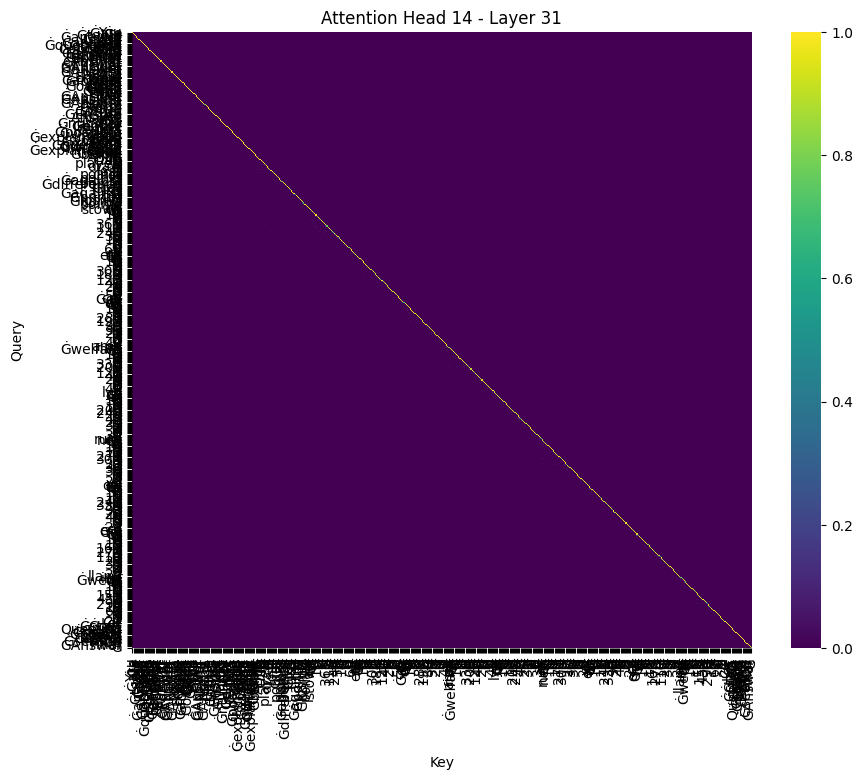

(564, 564)


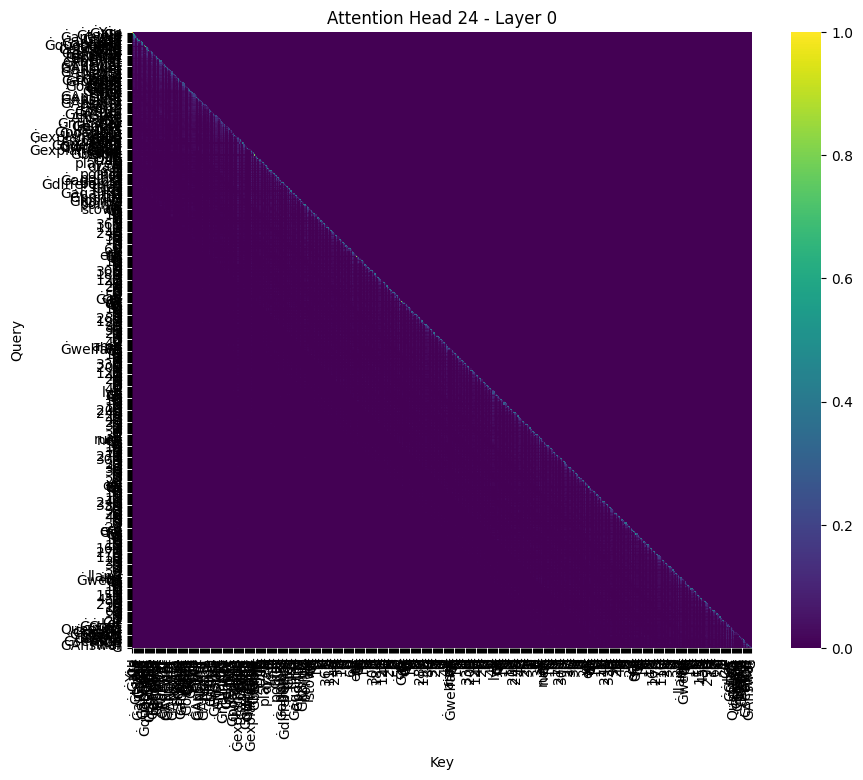

(564, 564)


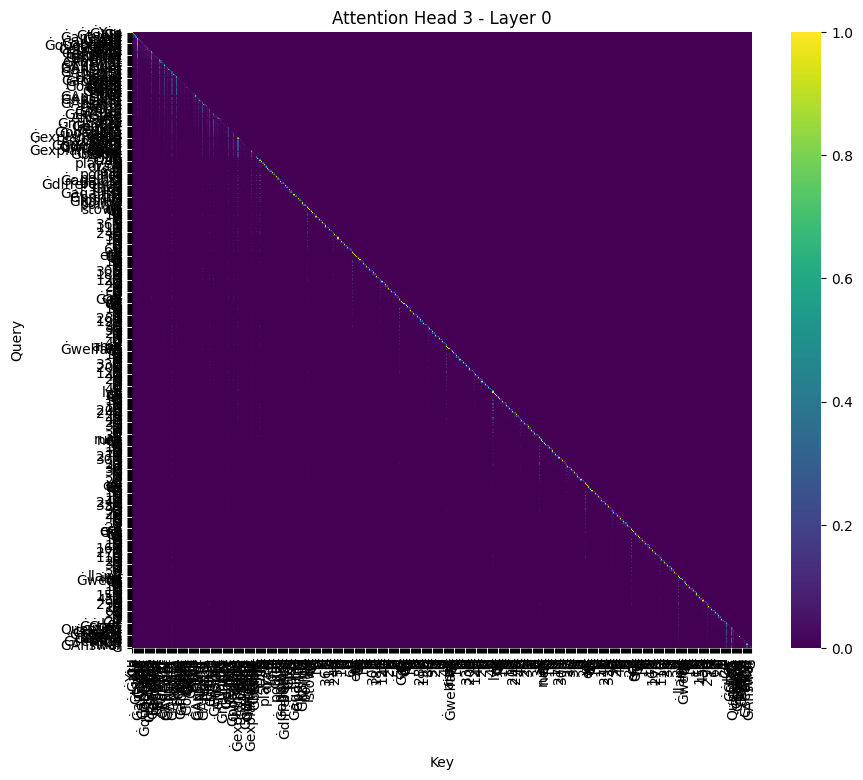

(564, 564)


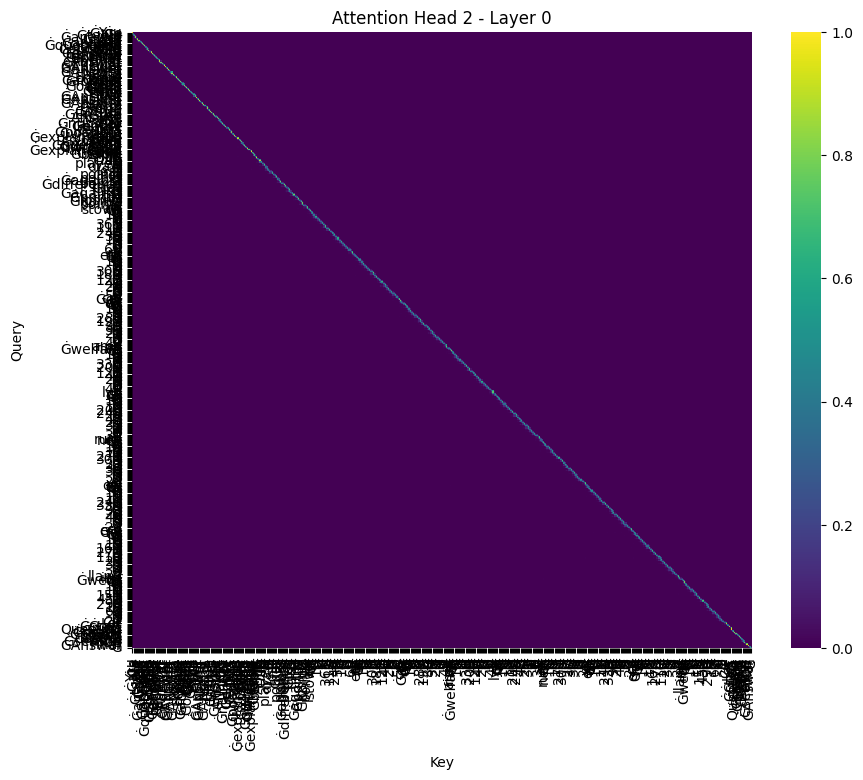

(564, 564)


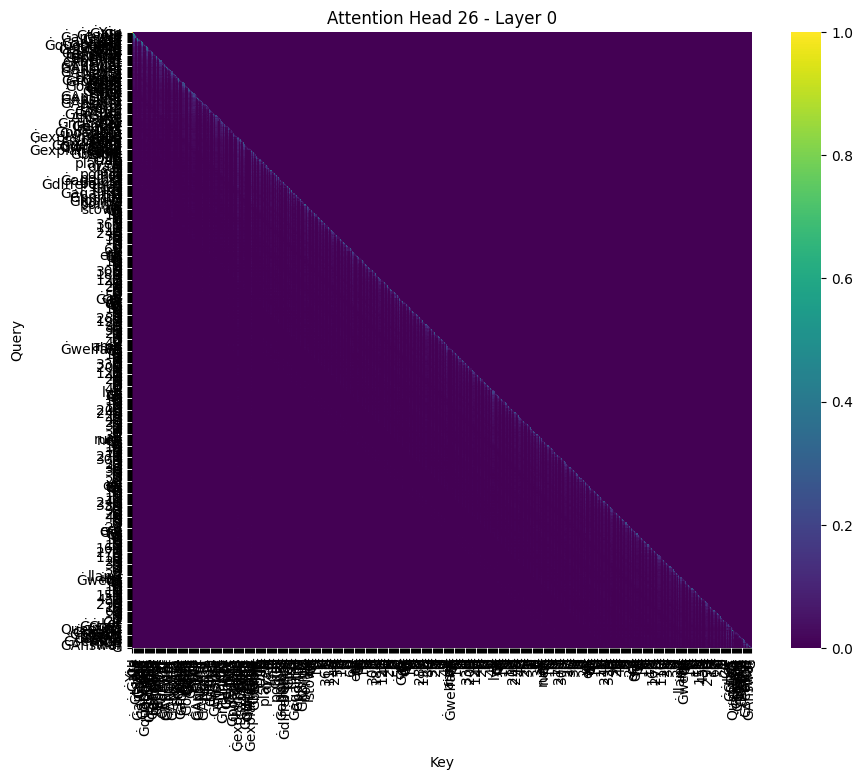

(564, 564)


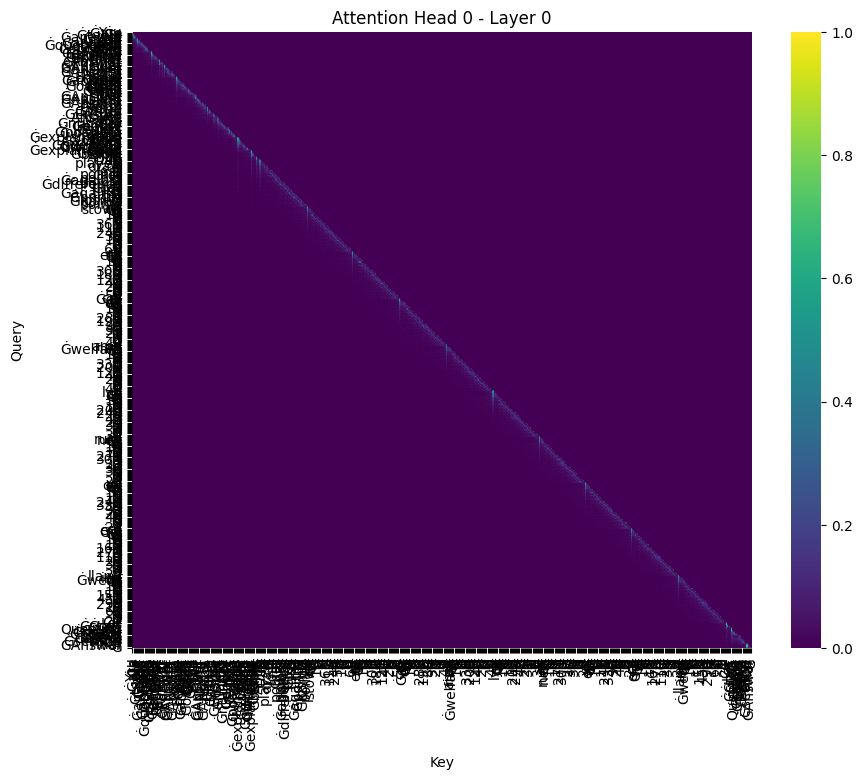

(564, 564)


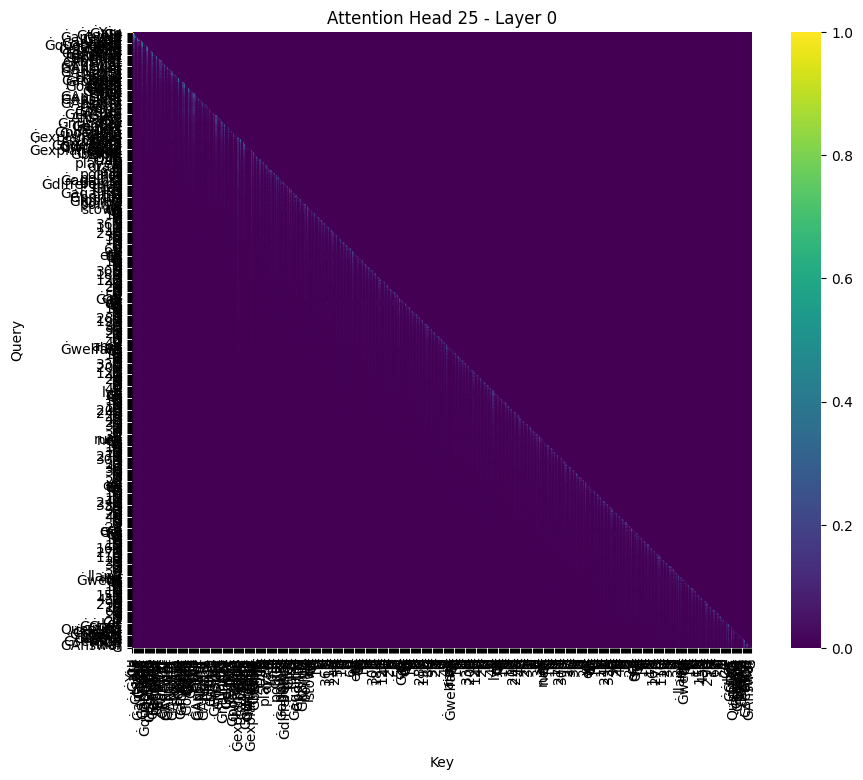

(564, 564)


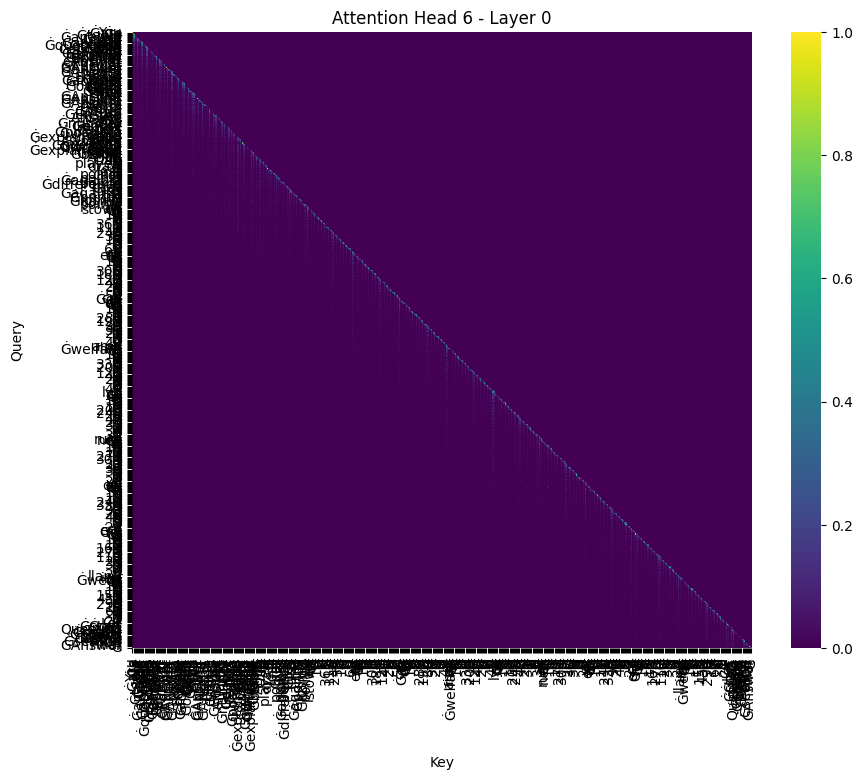

(564, 564)


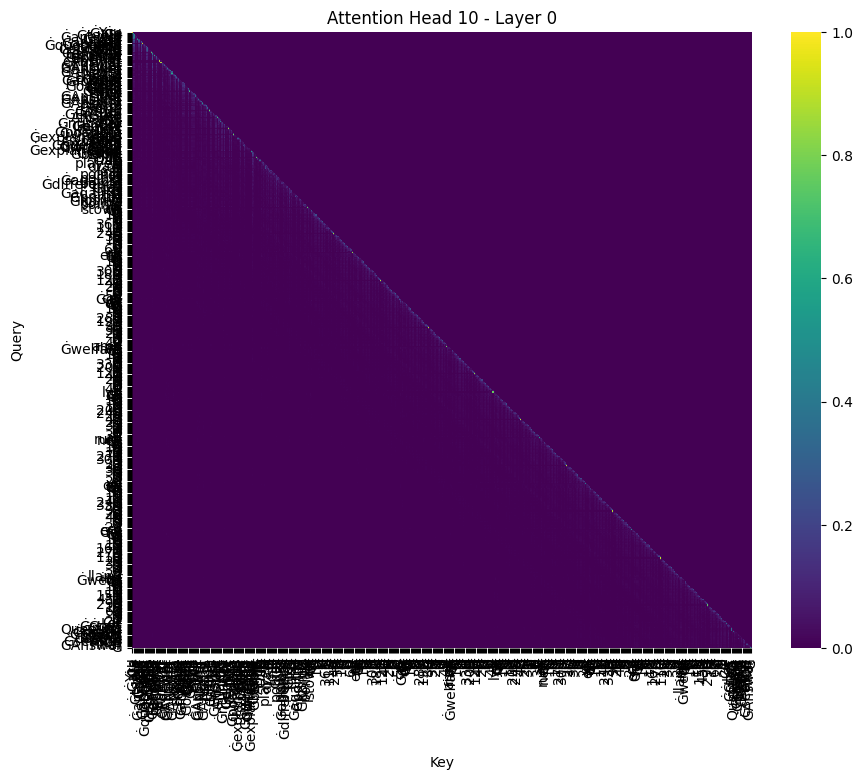

(564, 564)


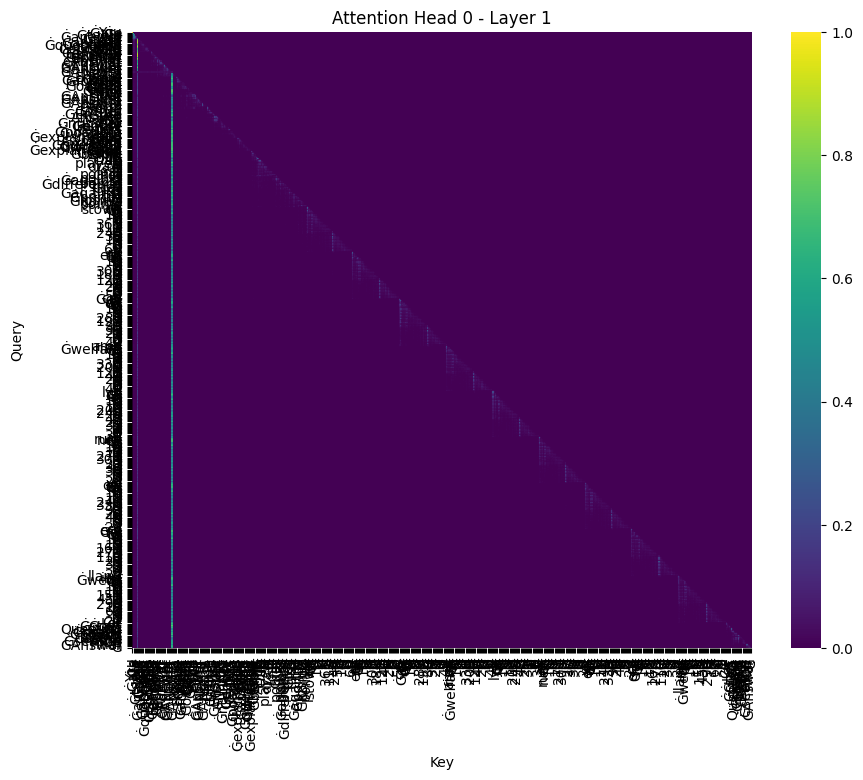

(564, 564)


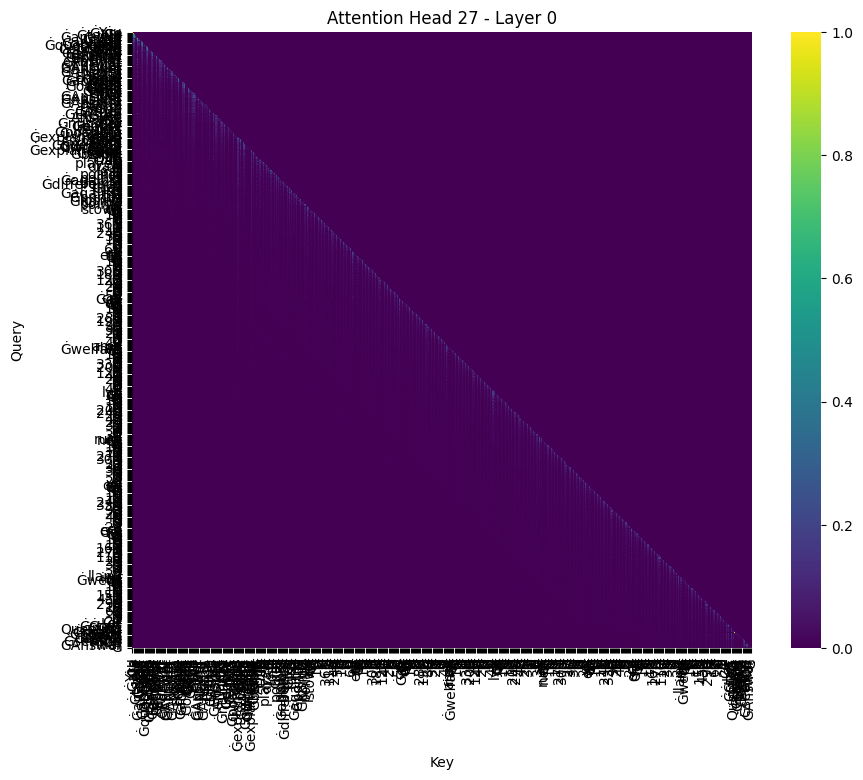

(564, 564)


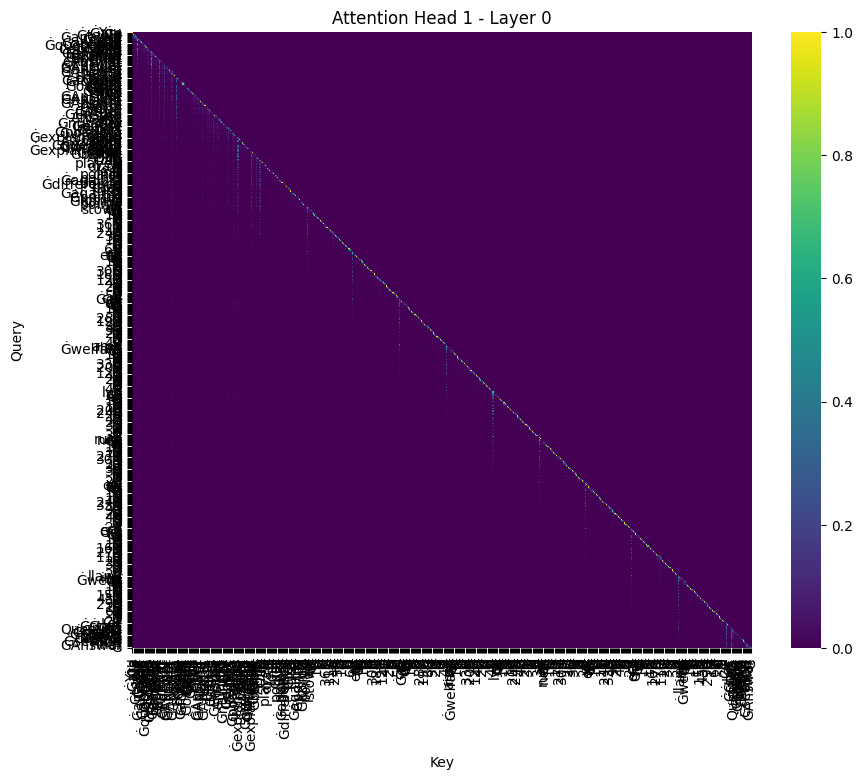

(564, 564)


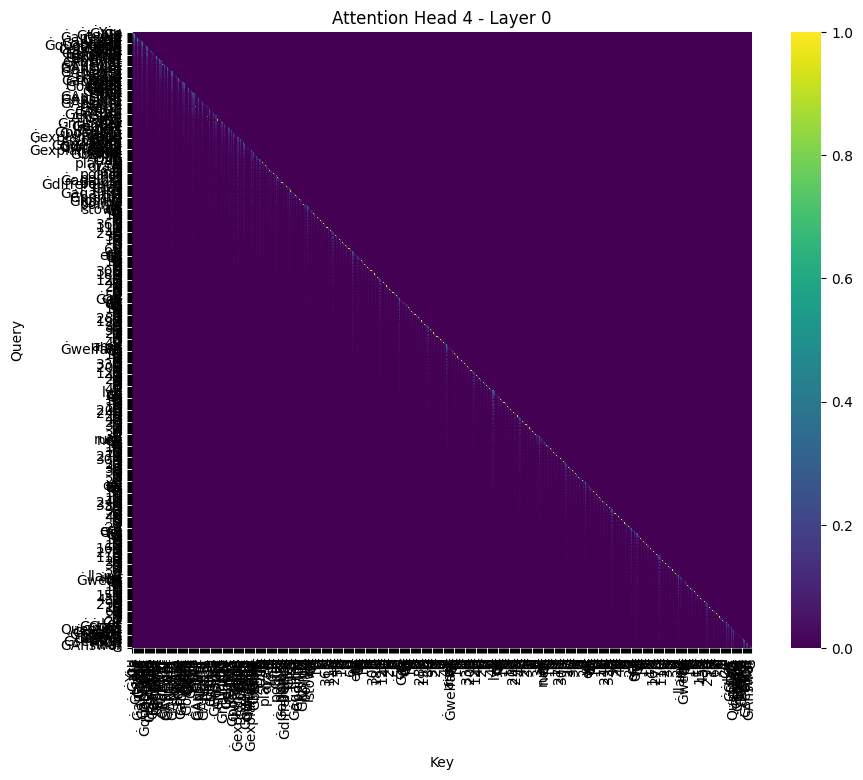

(564, 564)


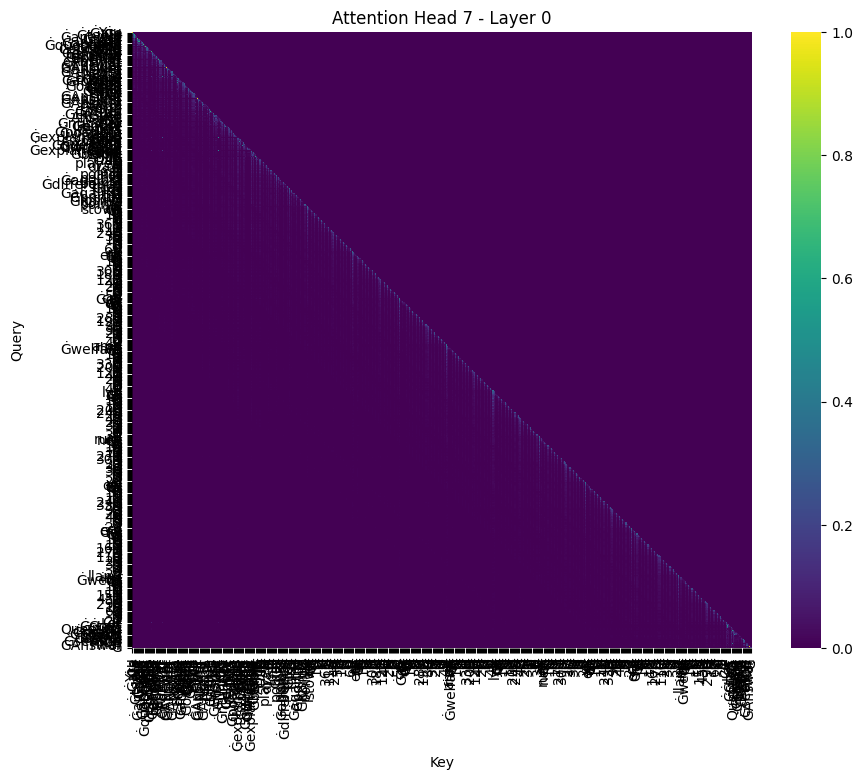

(564, 564)


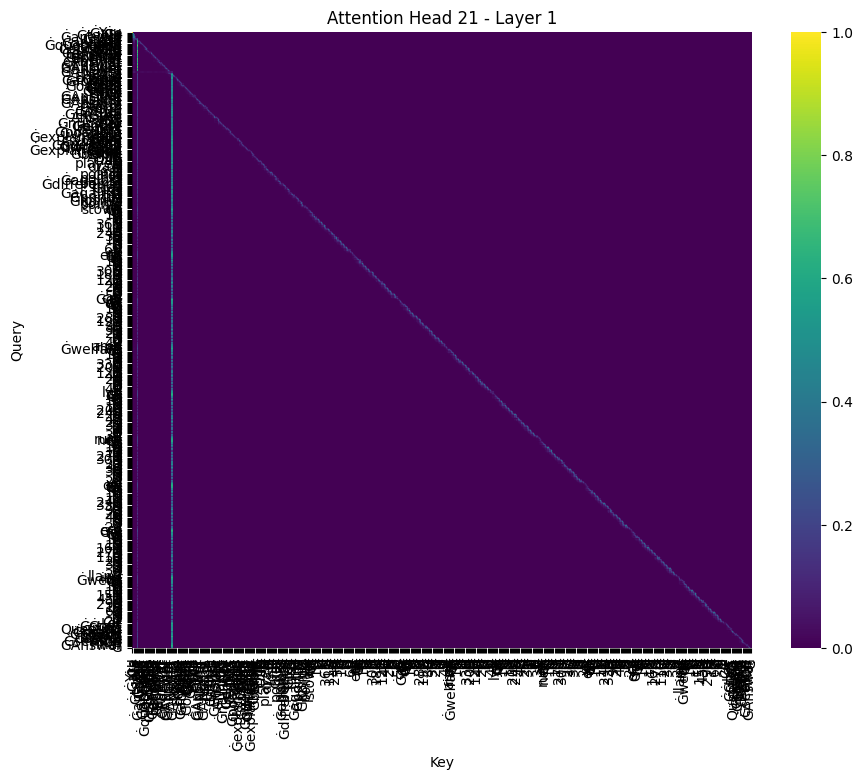

(564, 564)


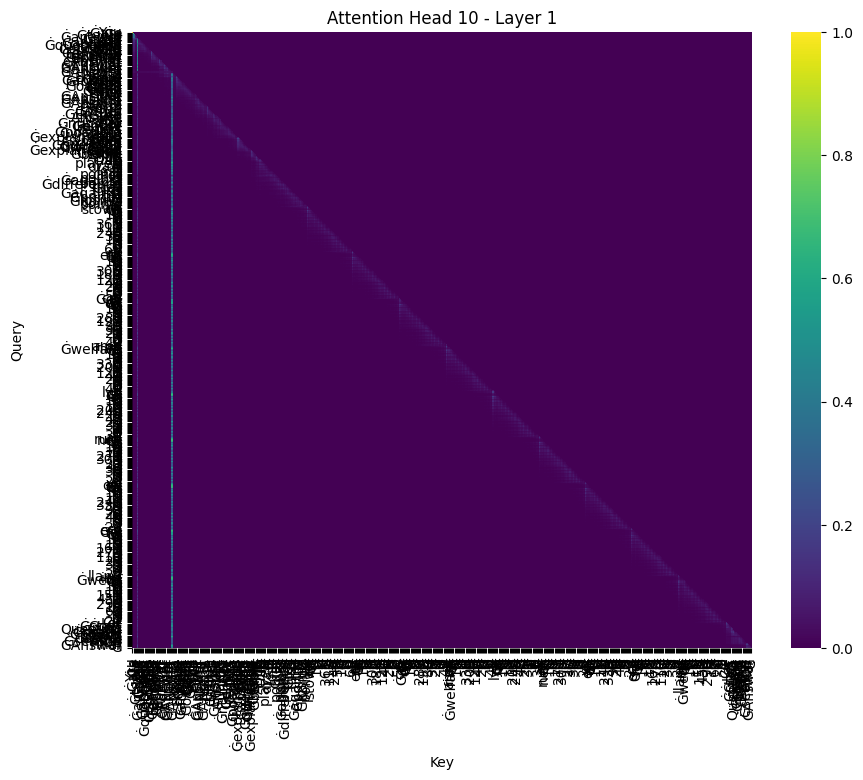

(564, 564)


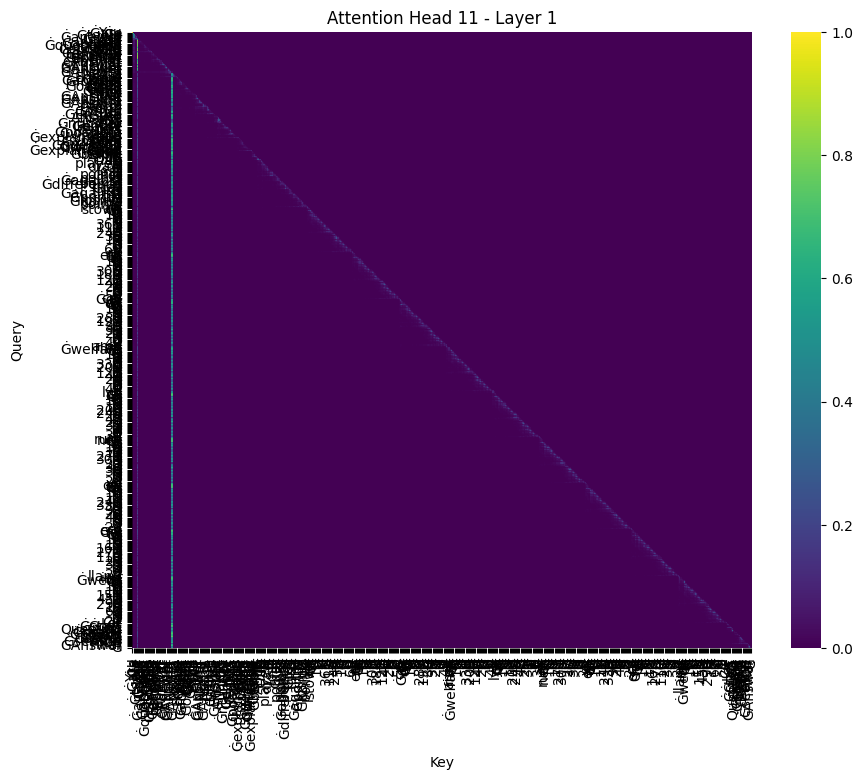

(564, 564)


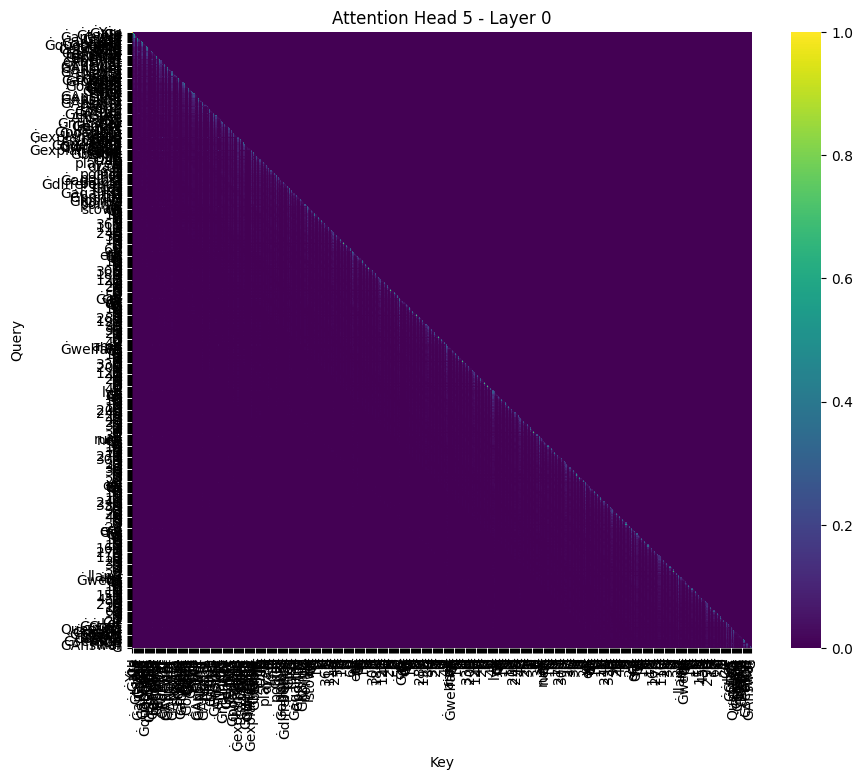

(564, 564)


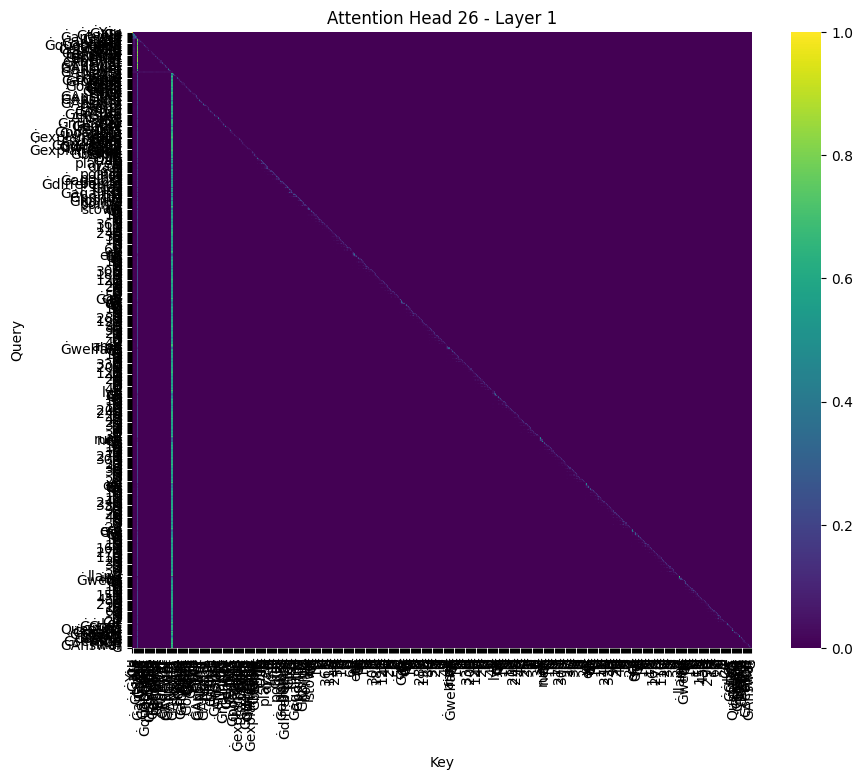

(564, 564)


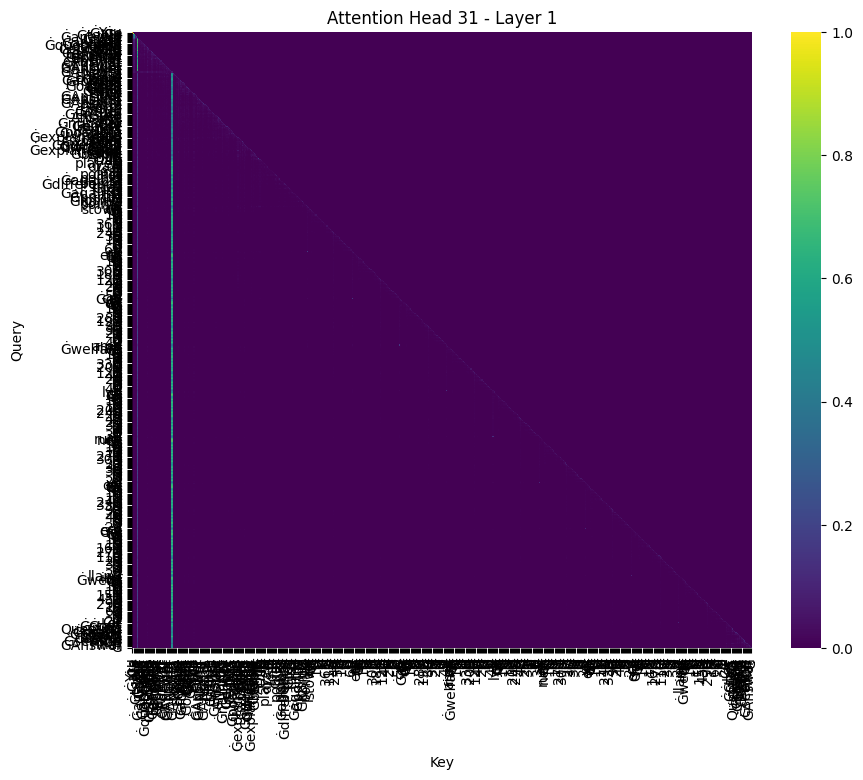

(564, 564)


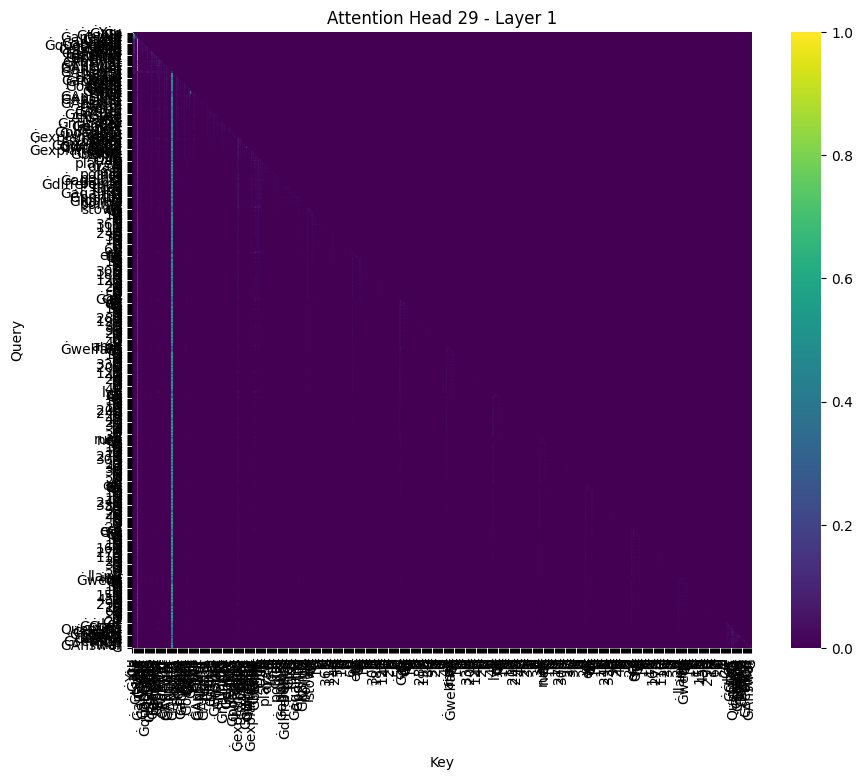

(564, 564)


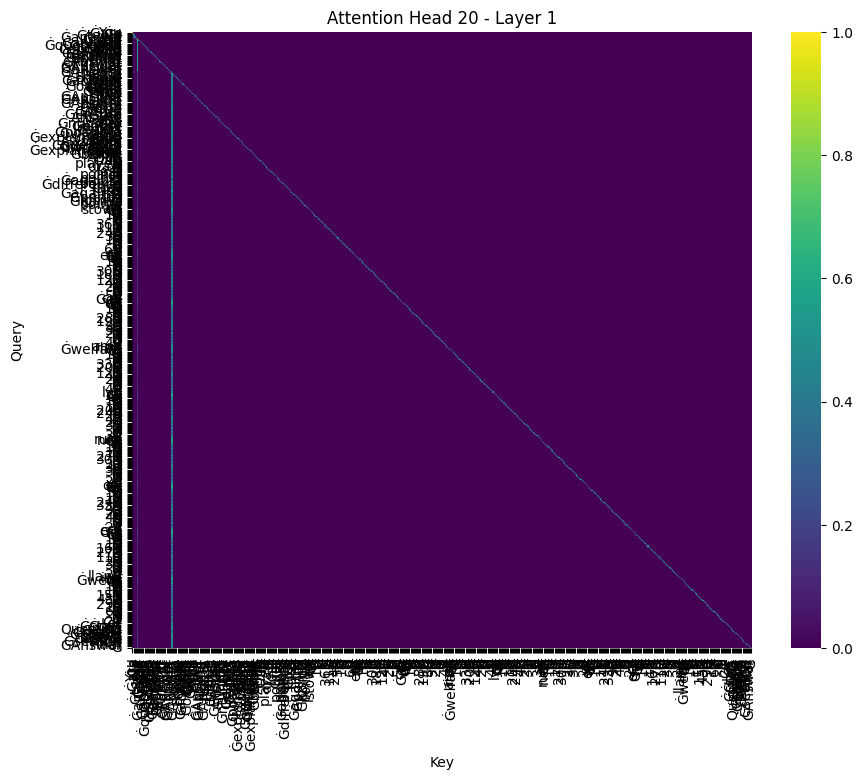

(564, 564)


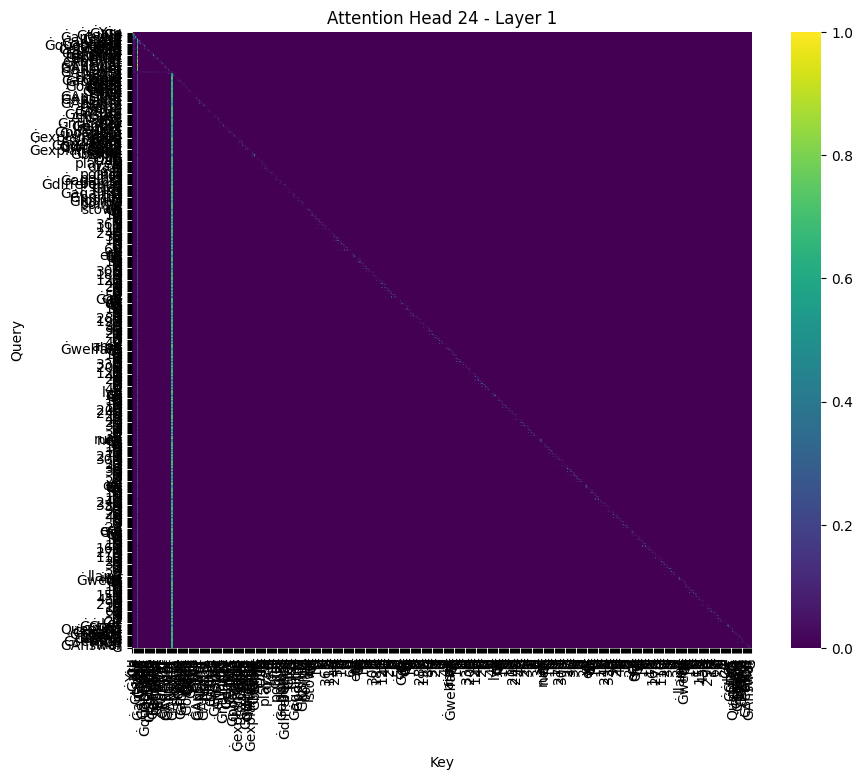

(564, 564)


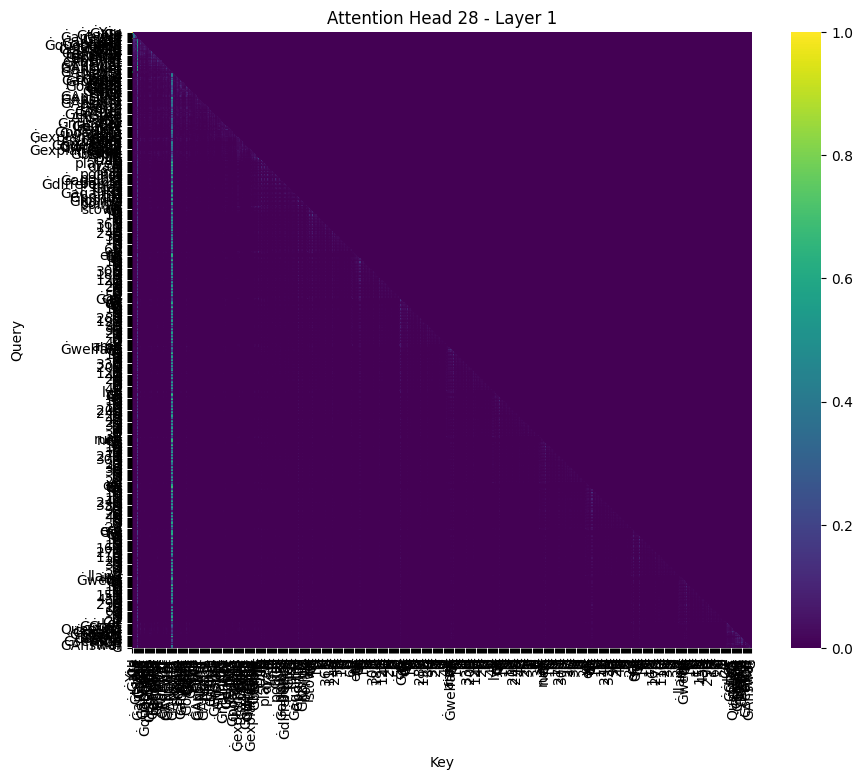

(564, 564)


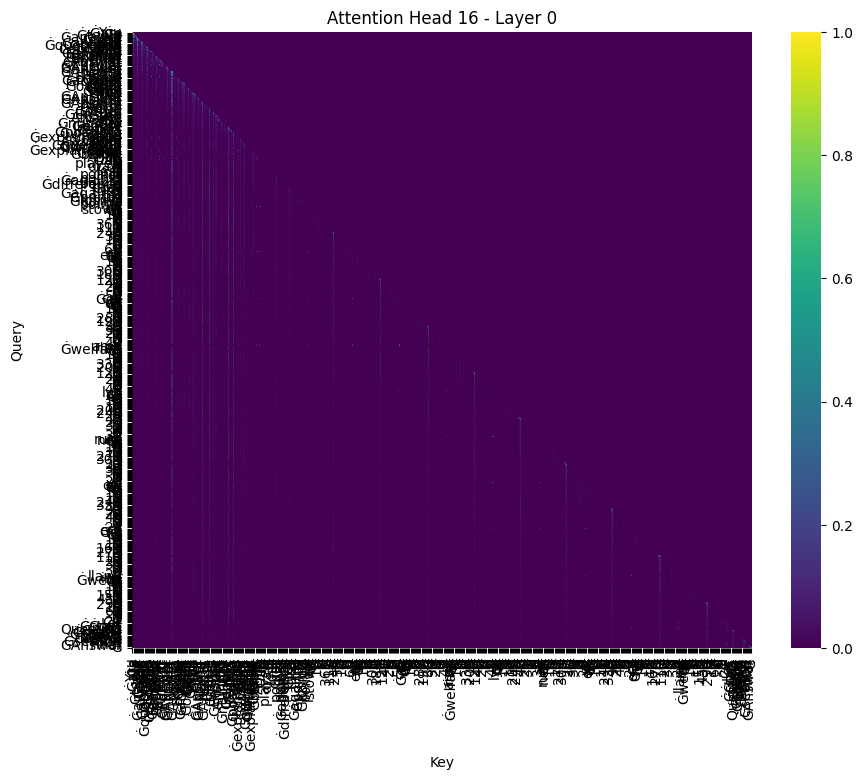

(564, 564)


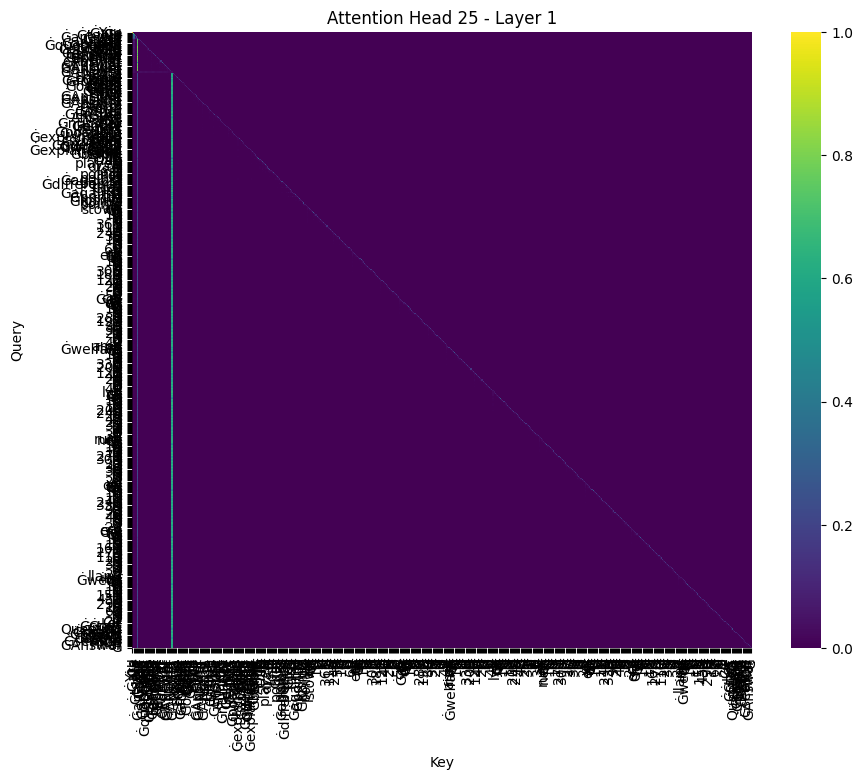

(564, 564)


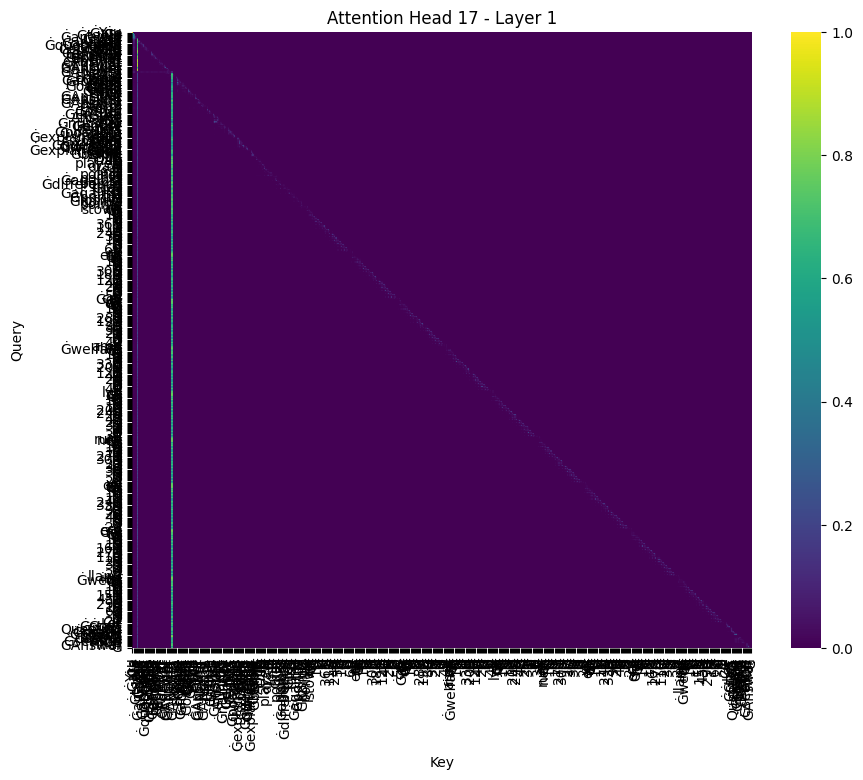

(564, 564)


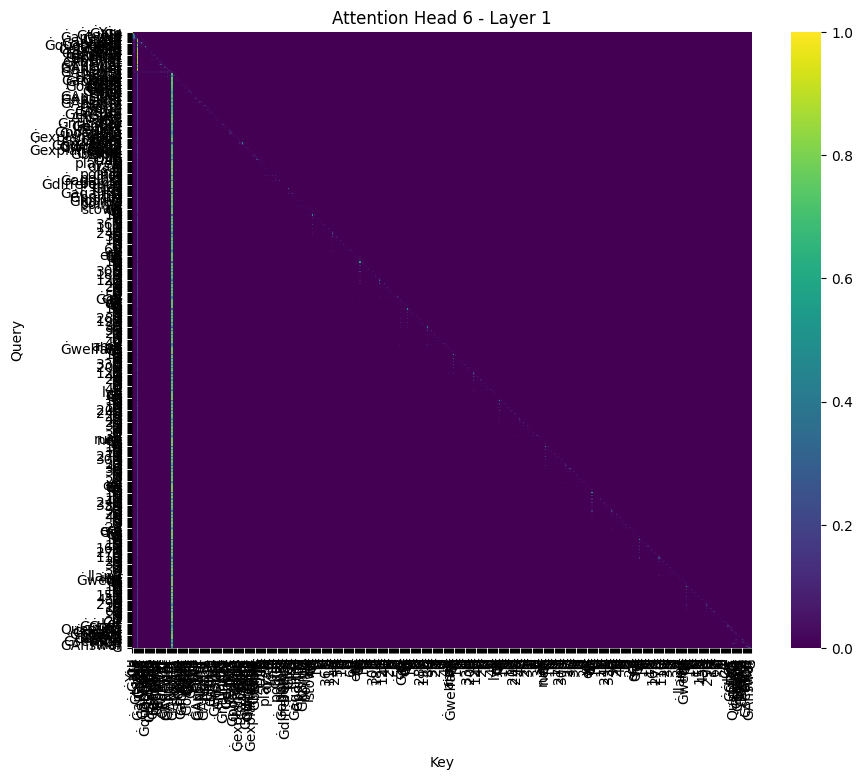

(564, 564)


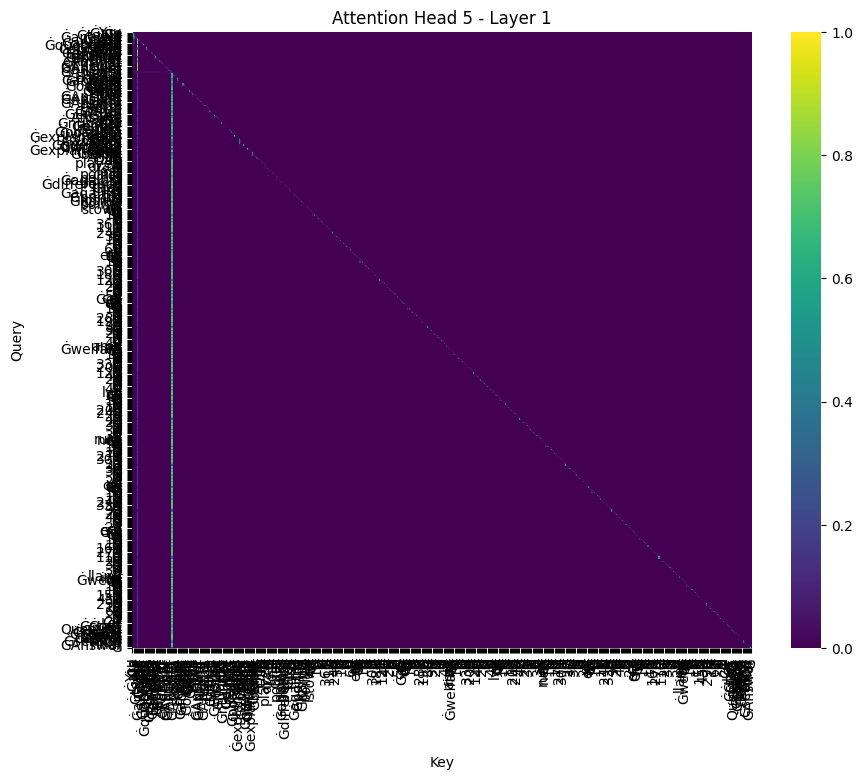

(564, 564)


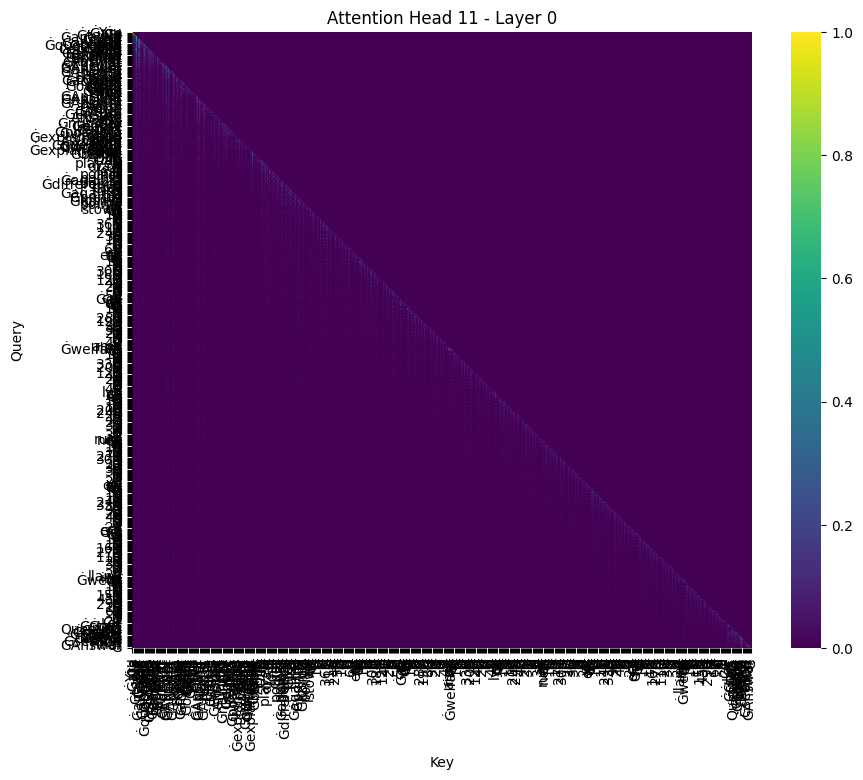

(564, 564)


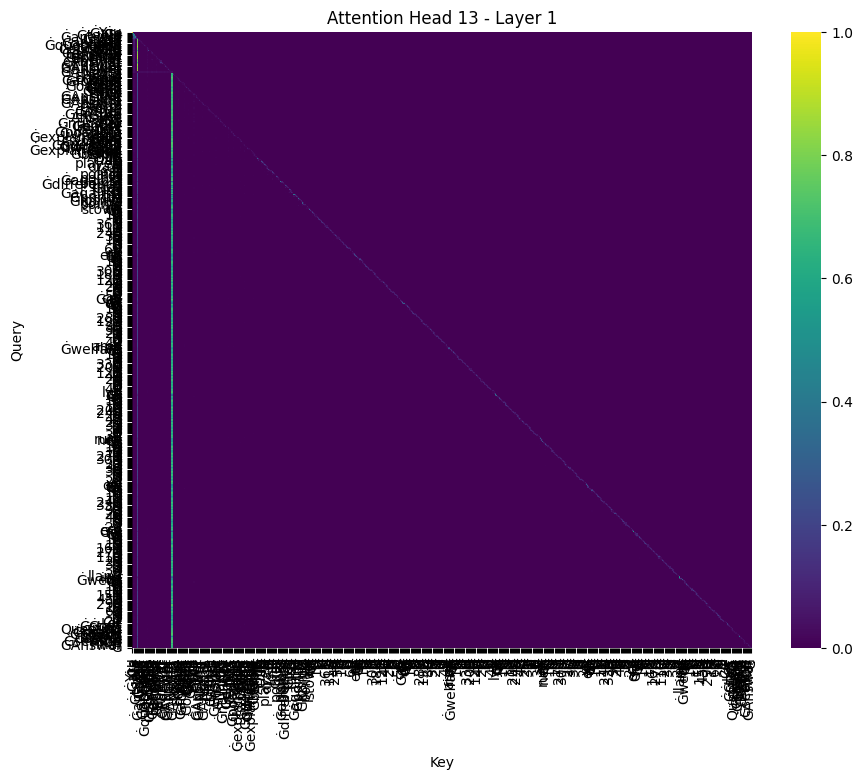

(564, 564)


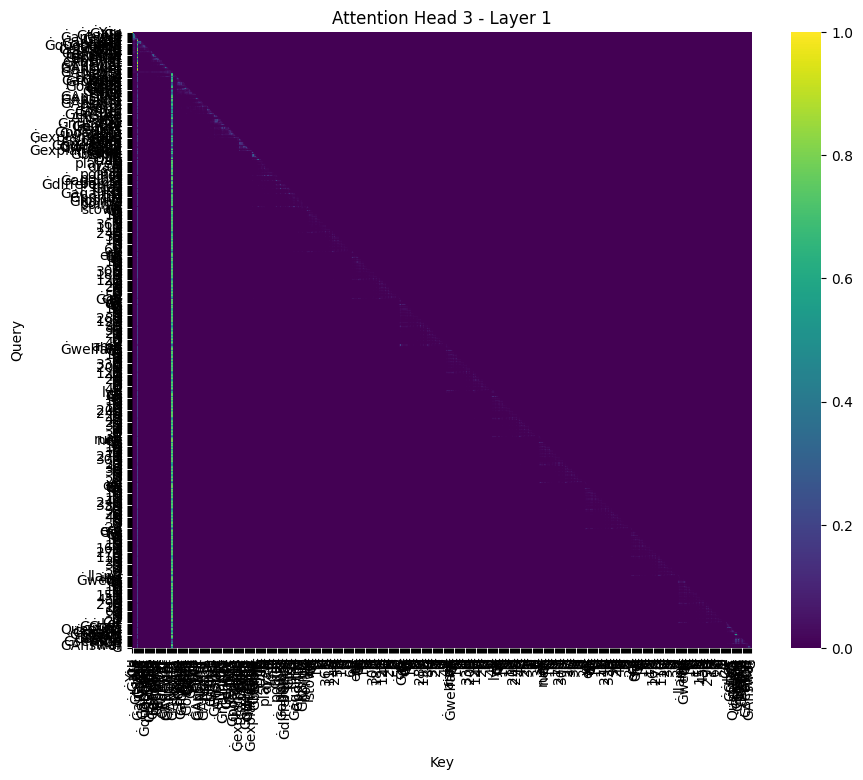

(564, 564)


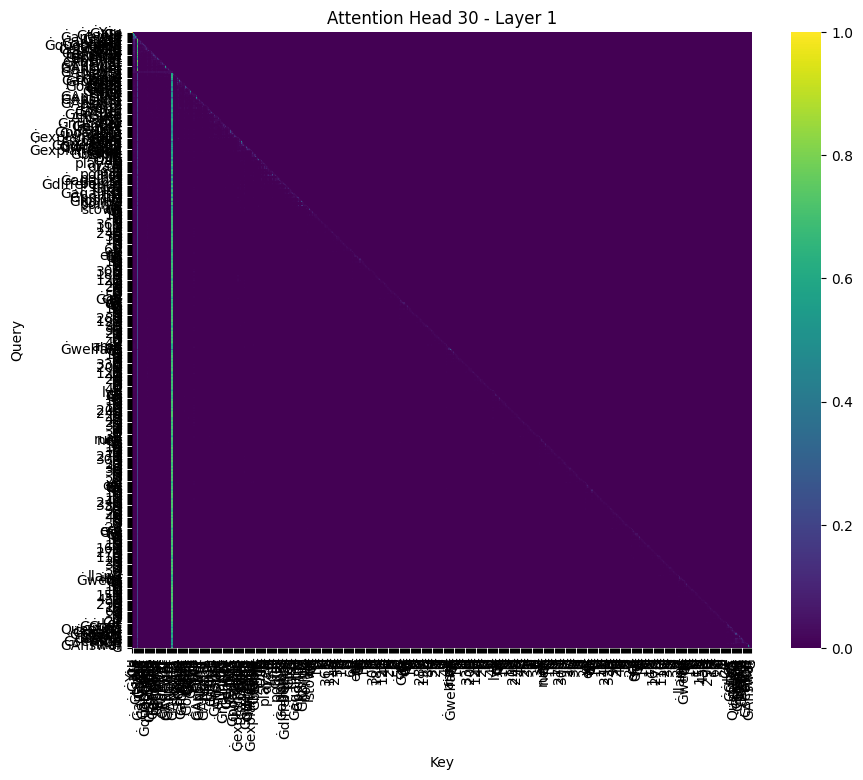

(564, 564)


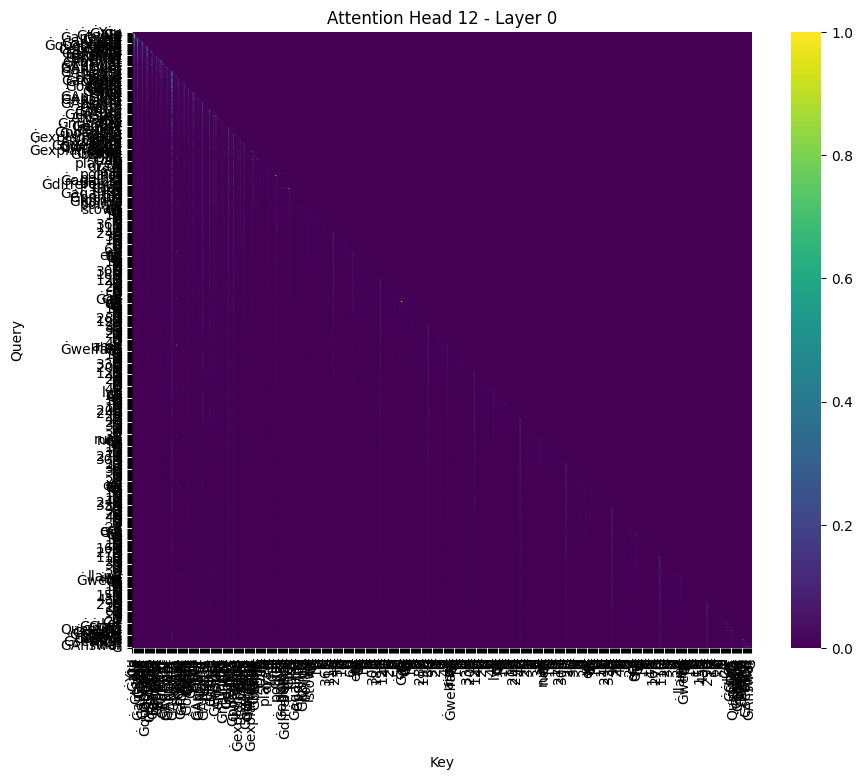

(564, 564)


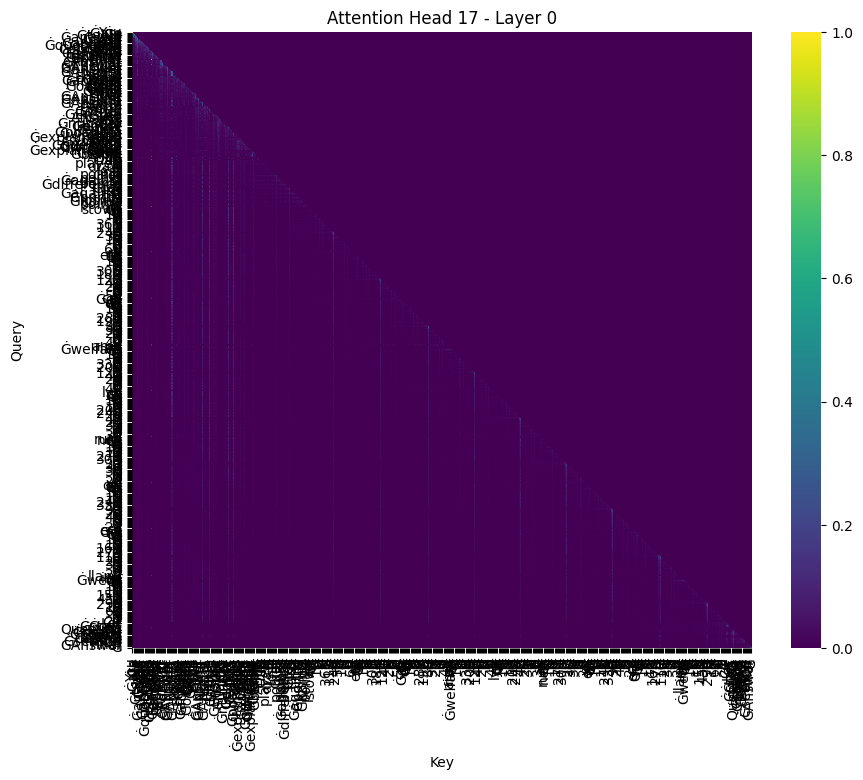

(564, 564)


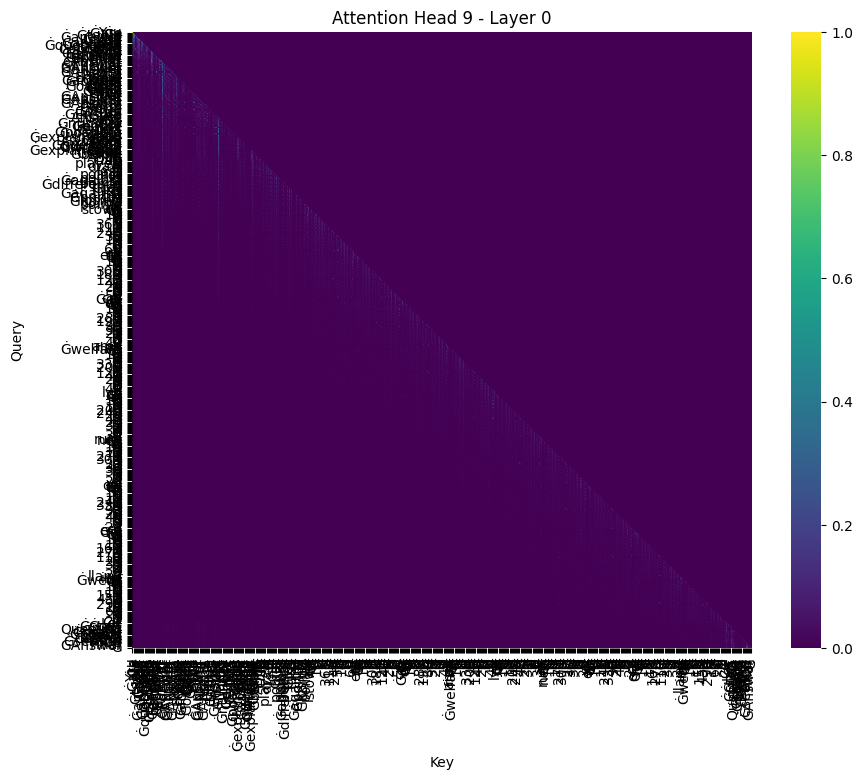

(564, 564)


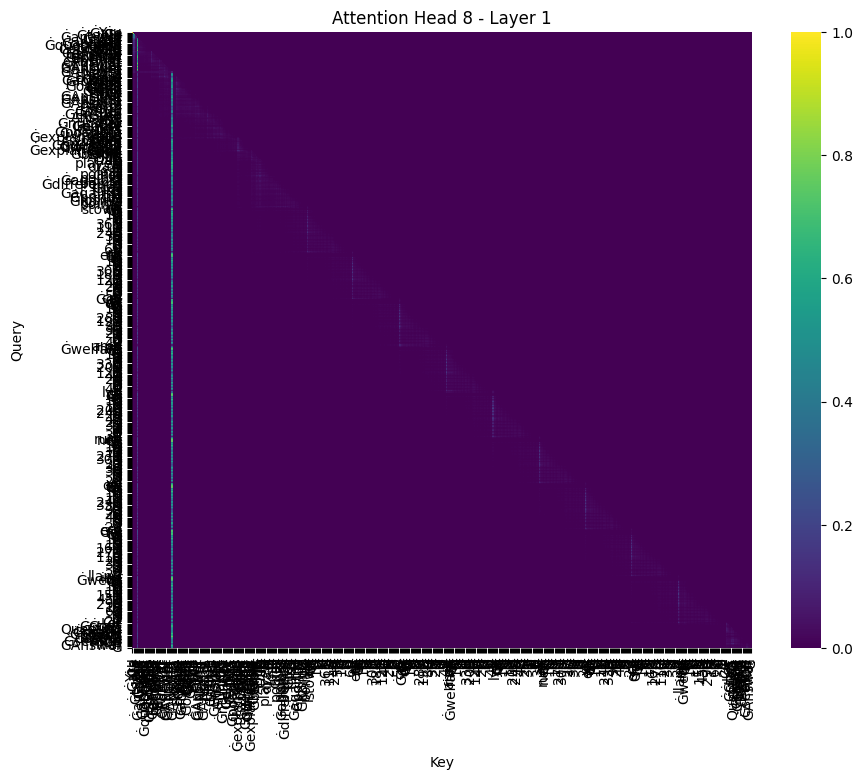

(564, 564)


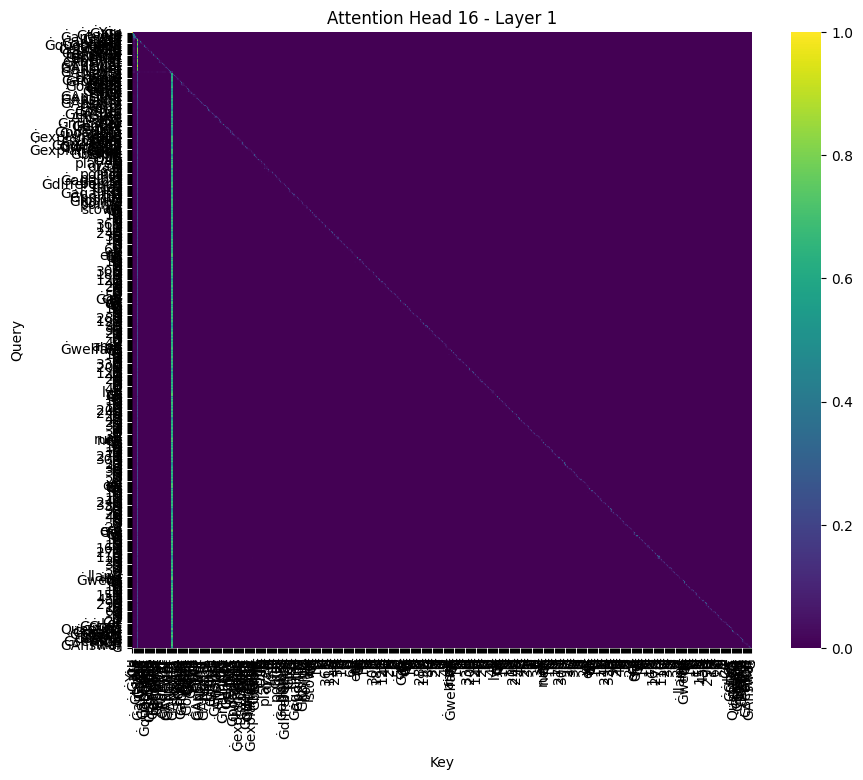

(564, 564)


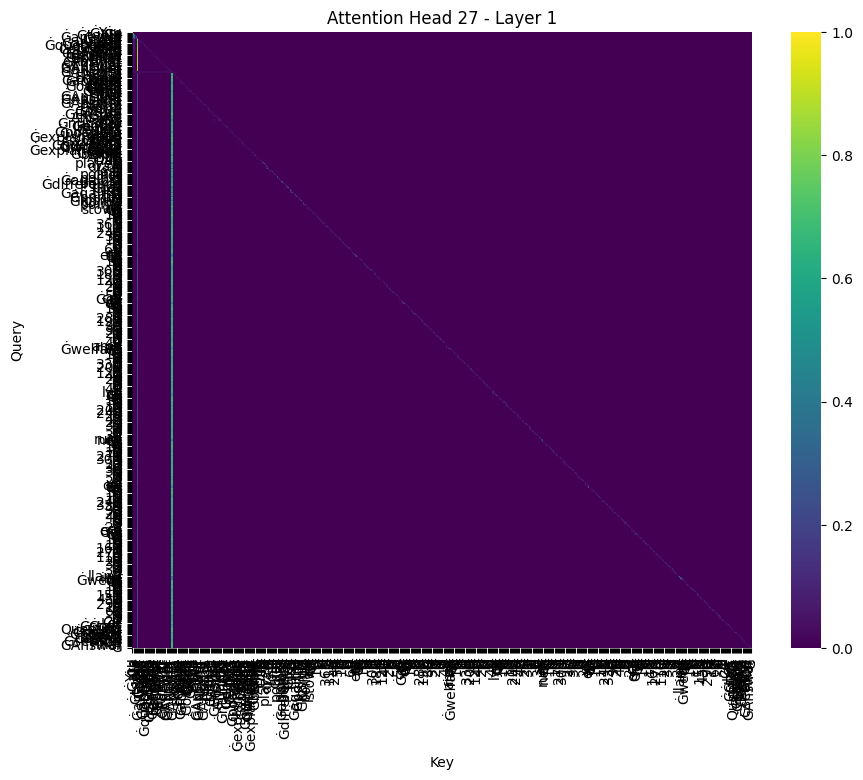

(564, 564)


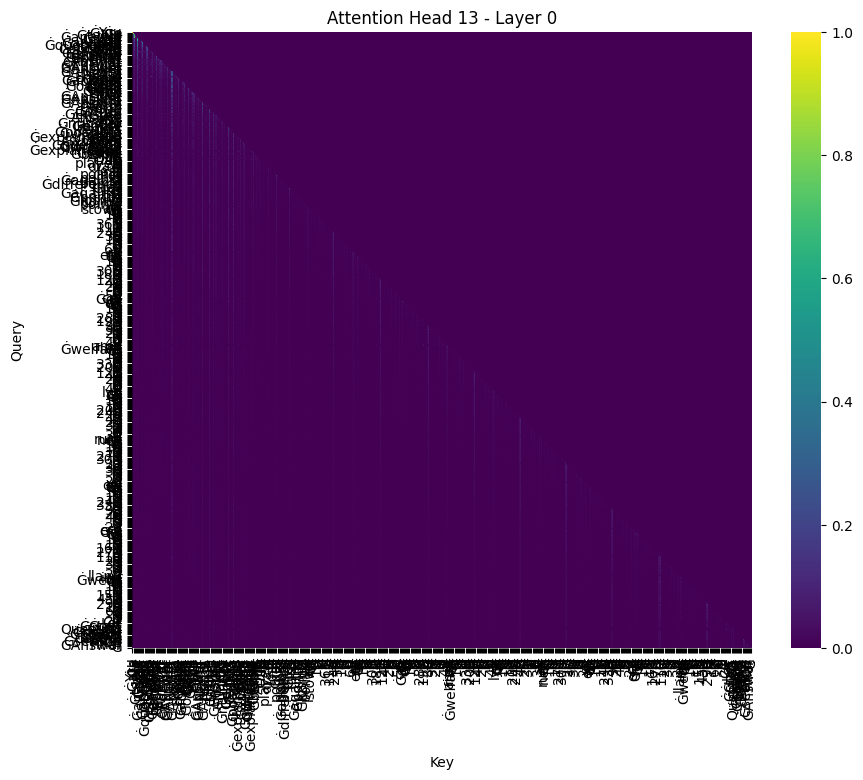

(564, 564)


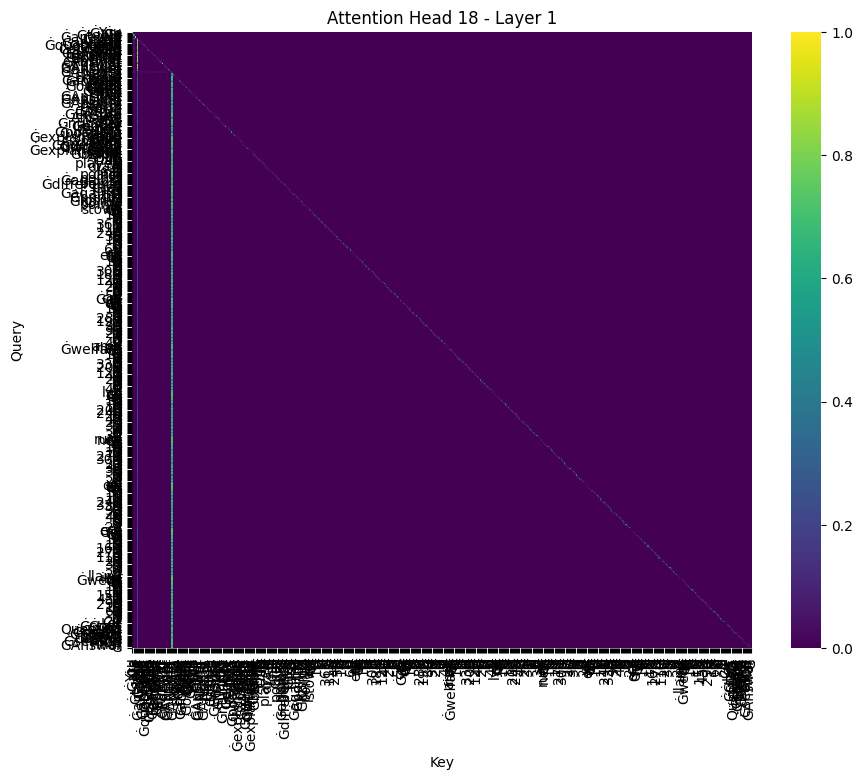

(564, 564)


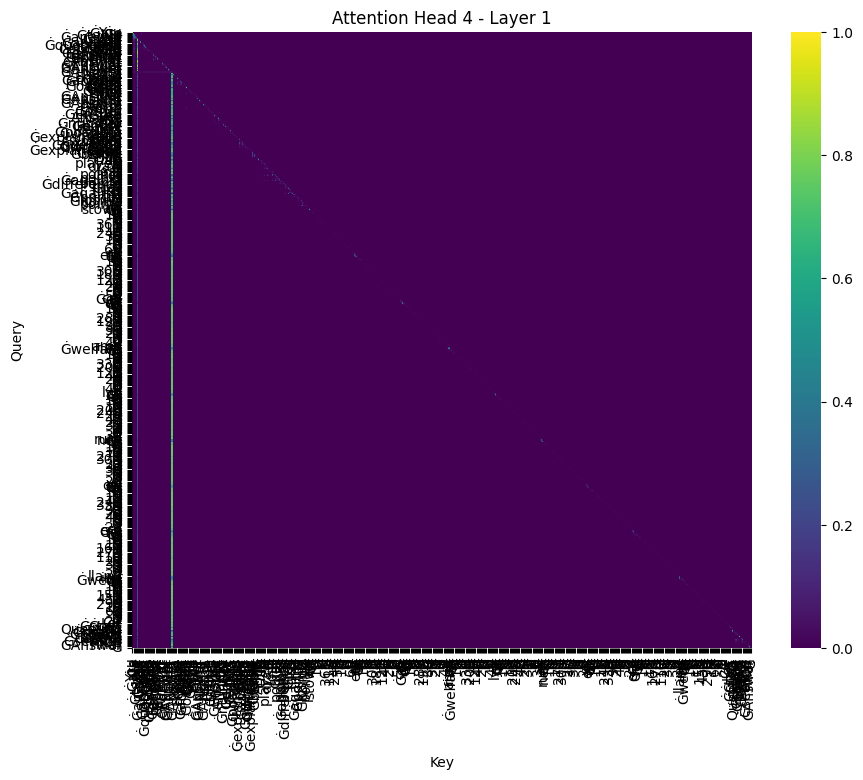

(564, 564)


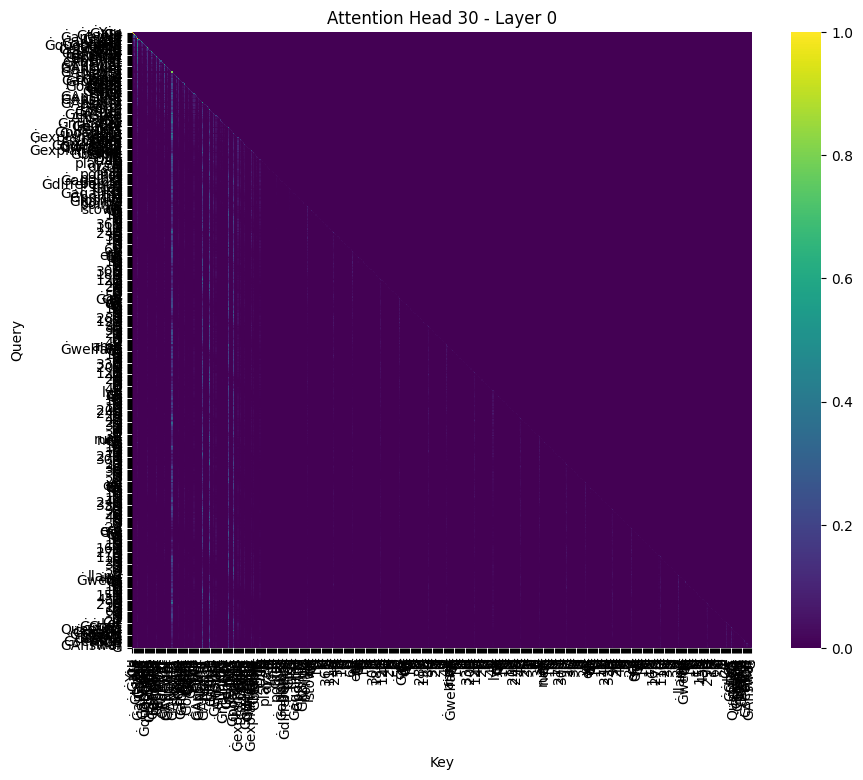

(564, 564)


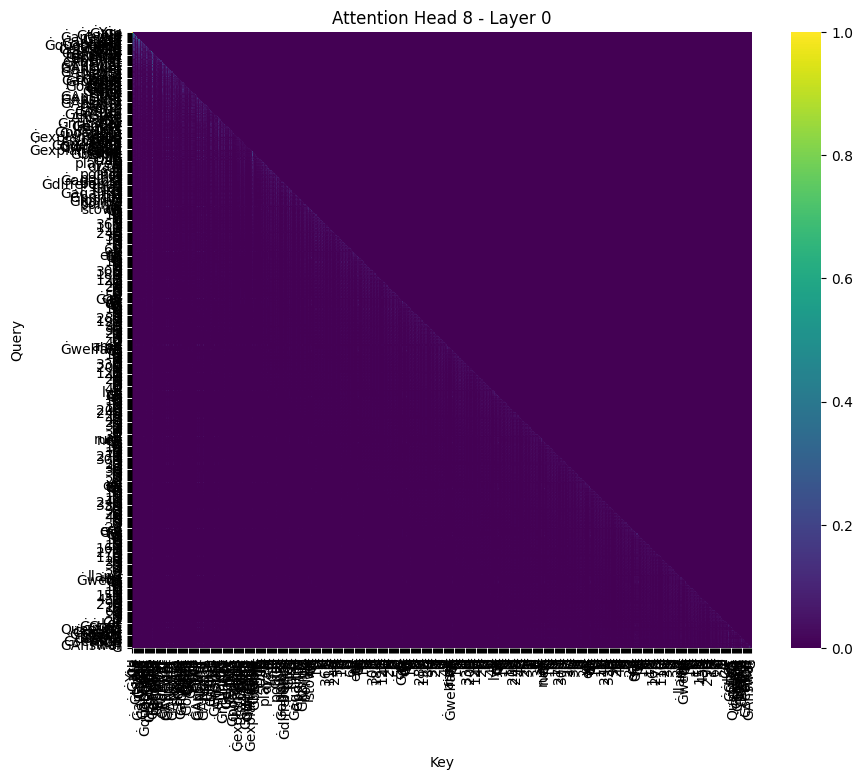

(564, 564)


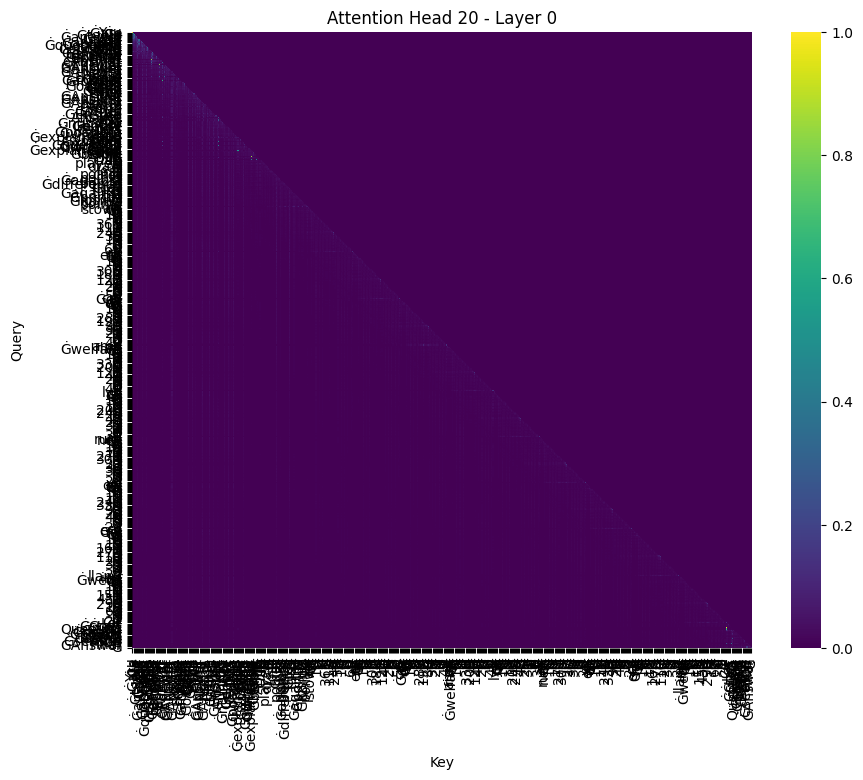

(564, 564)


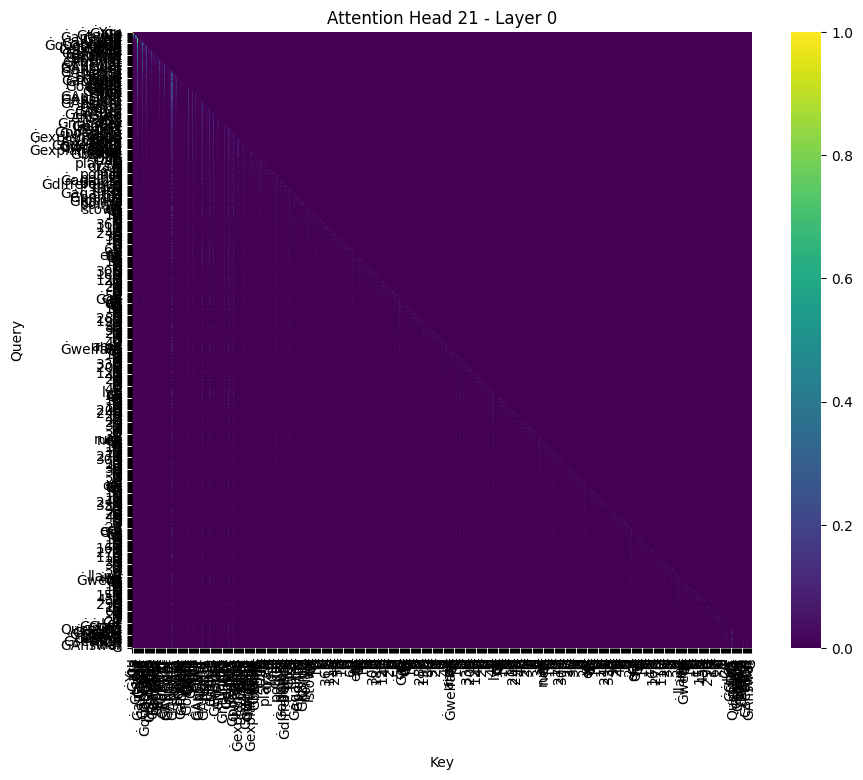

(564, 564)


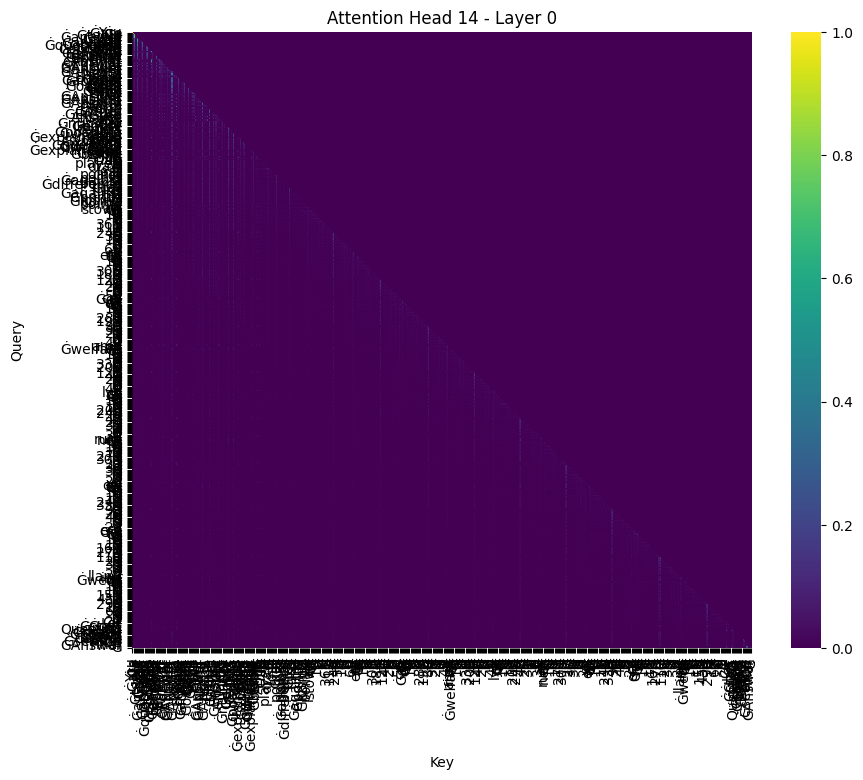

(564, 564)


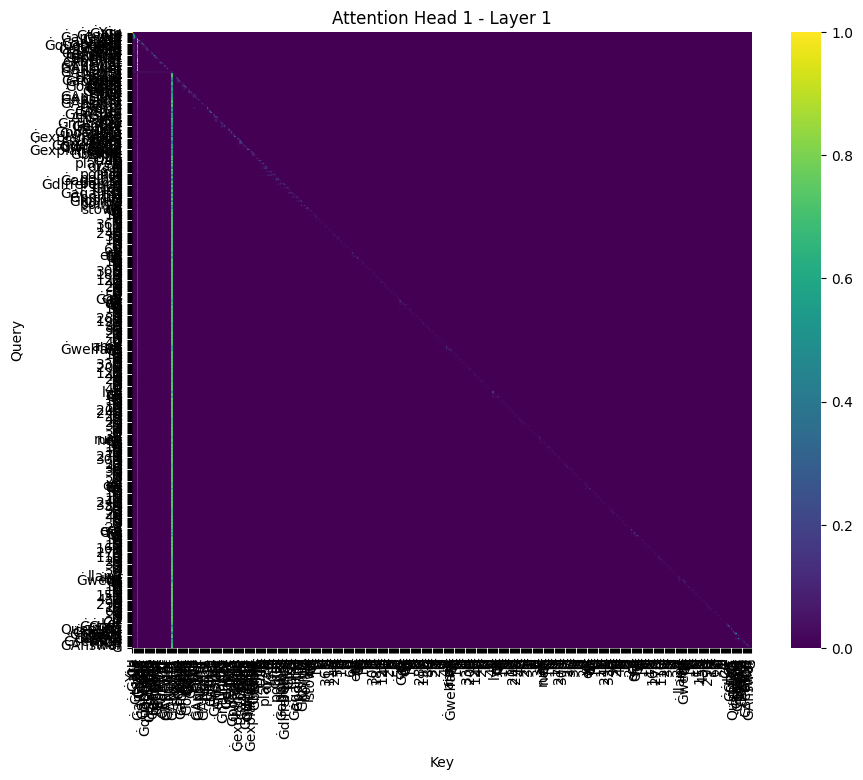

(564, 564)


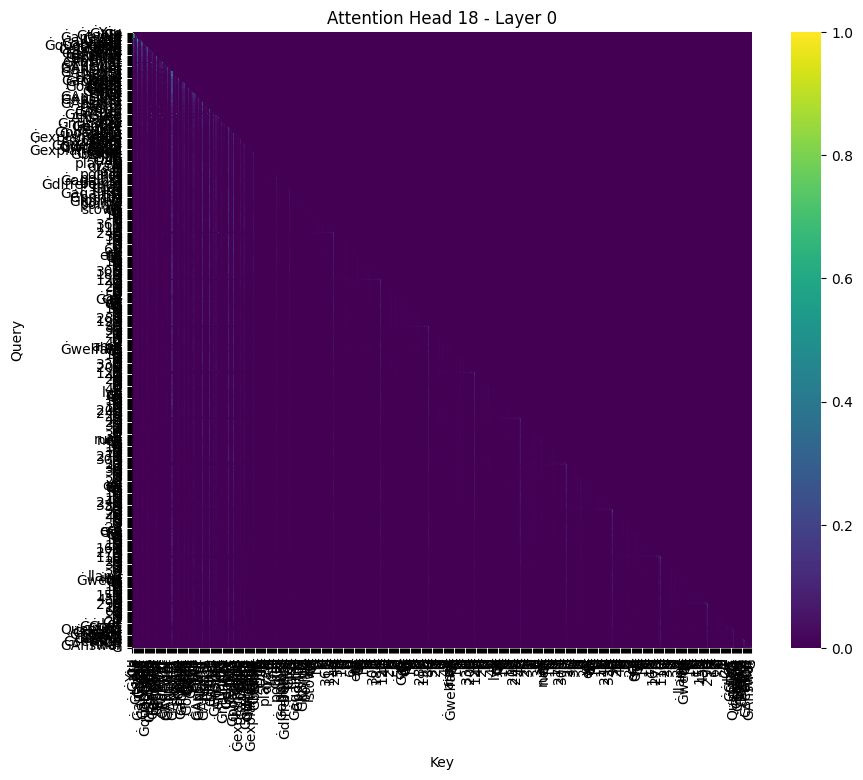

(564, 564)


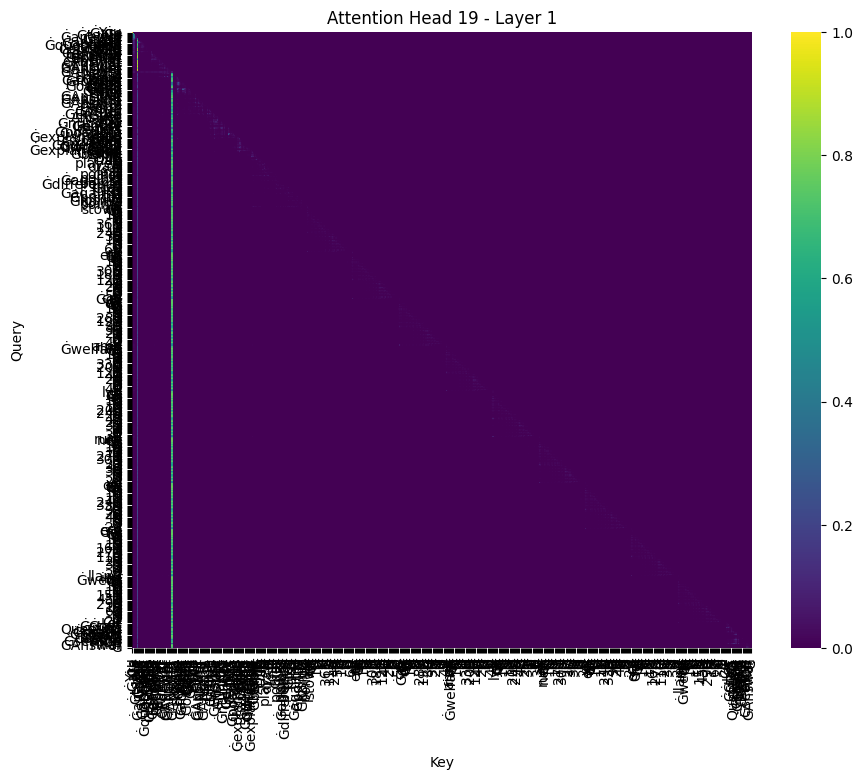

(564, 564)


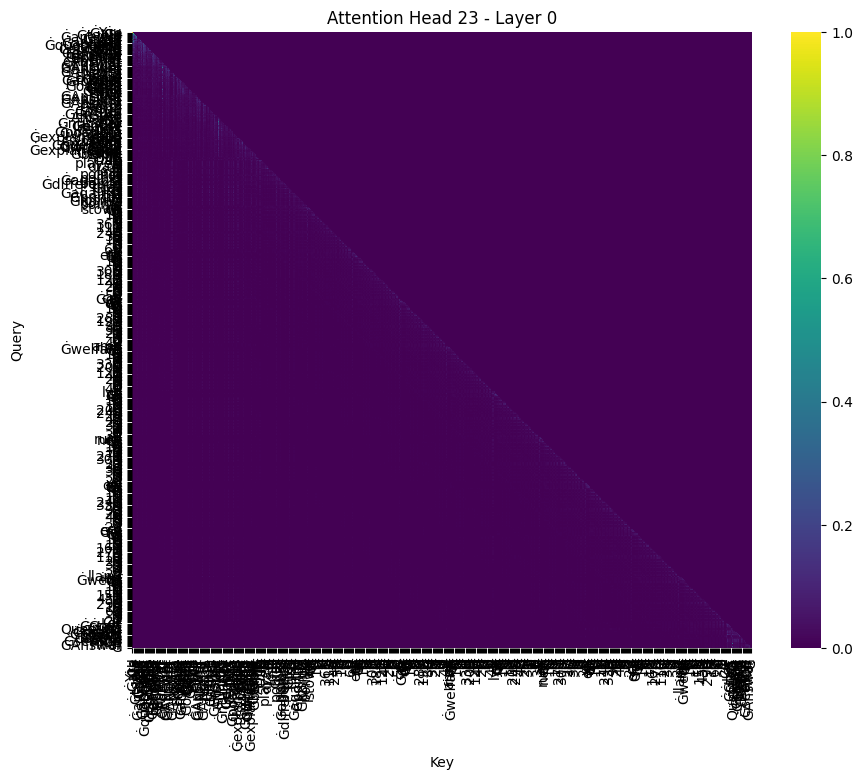

(564, 564)


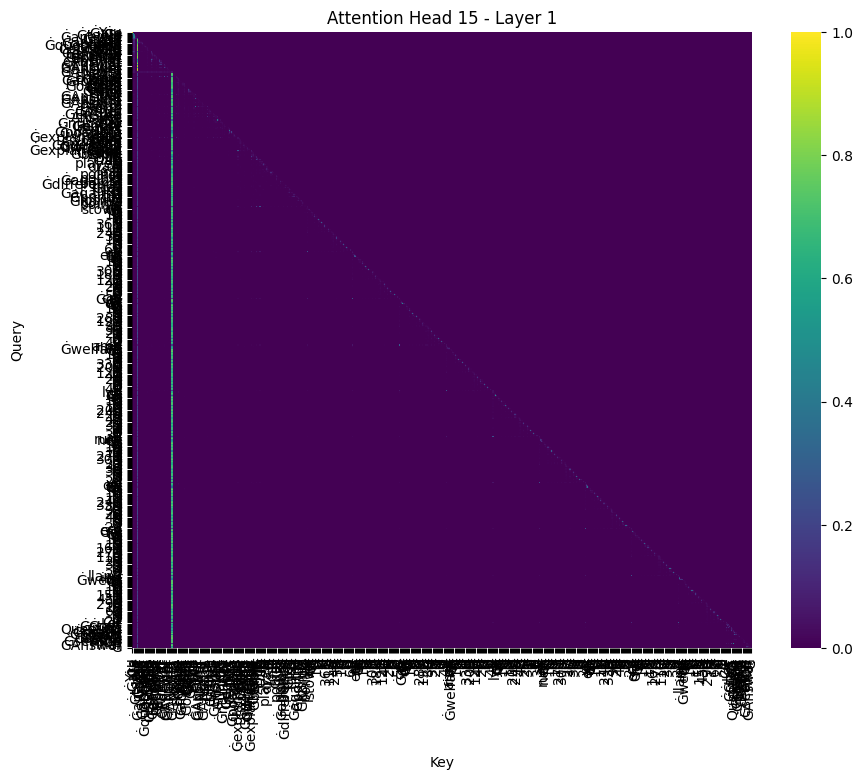

(564, 564)


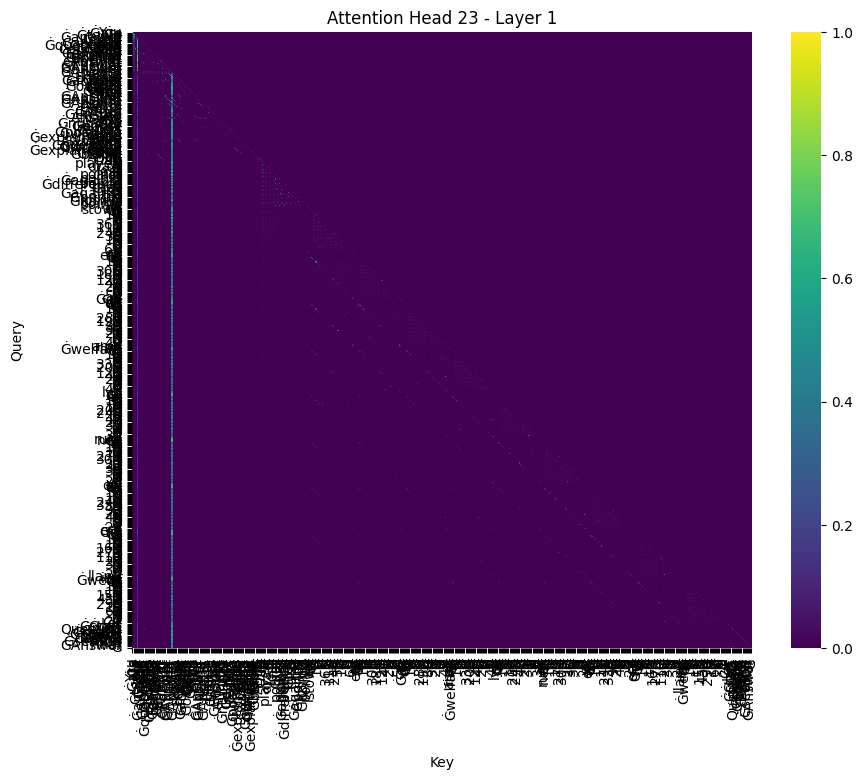

(564, 564)


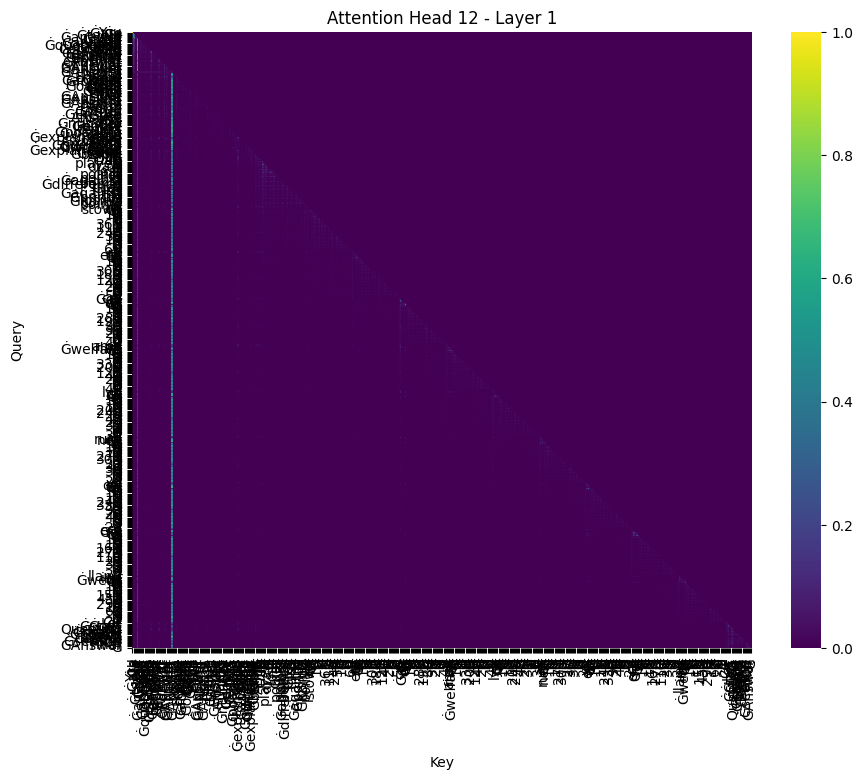

(564, 564)


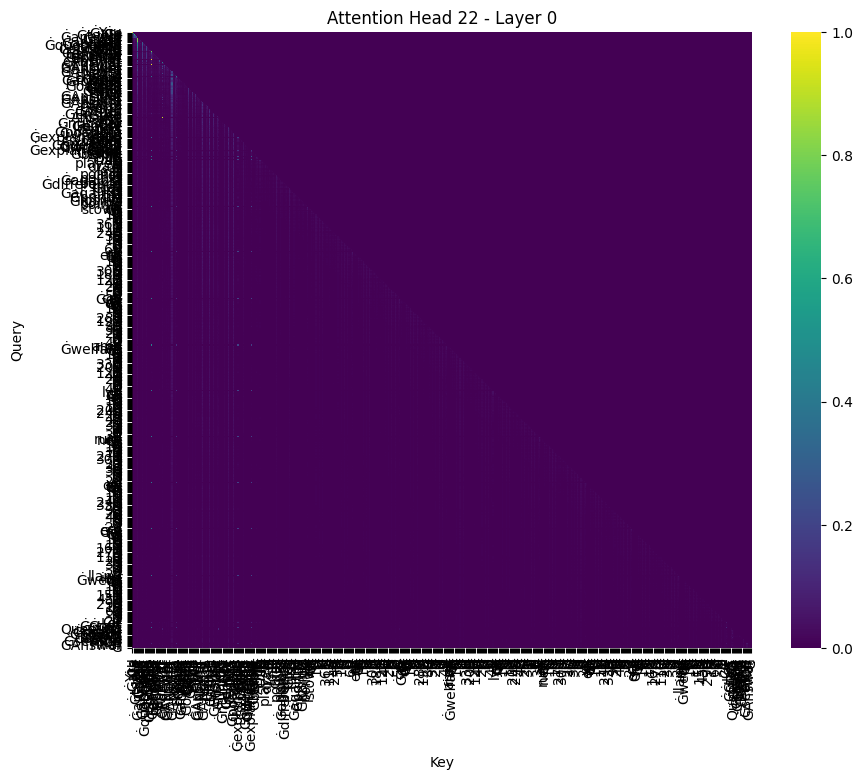

(564, 564)


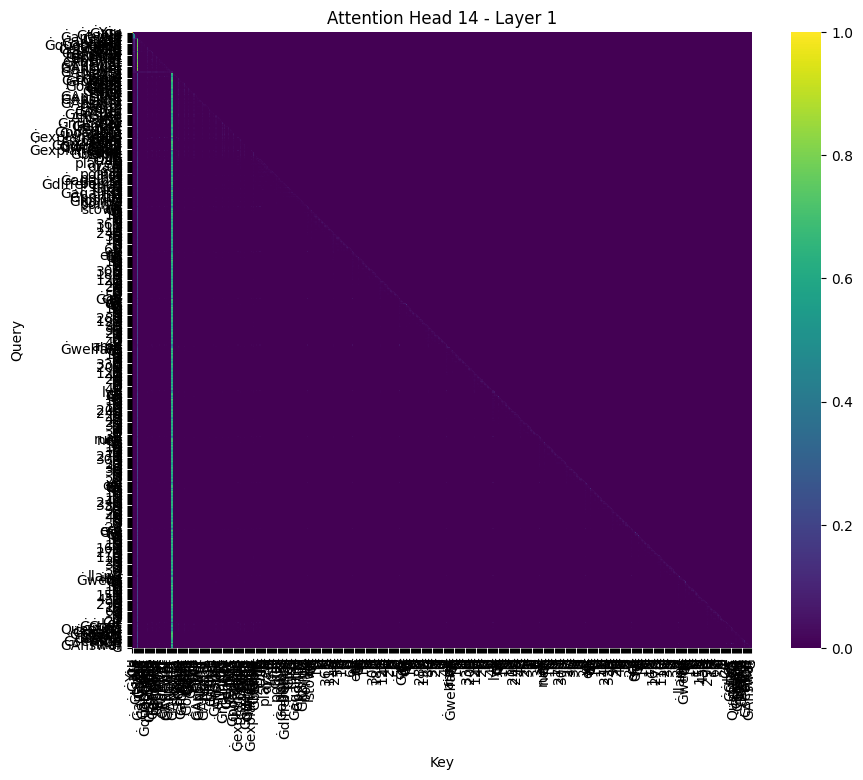

(564, 564)


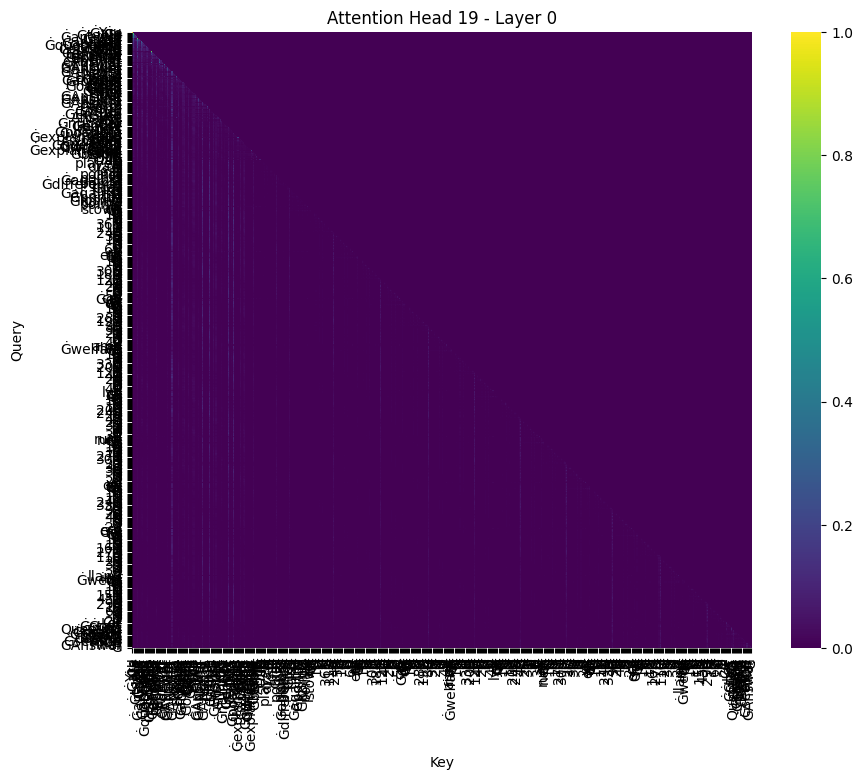

(564, 564)


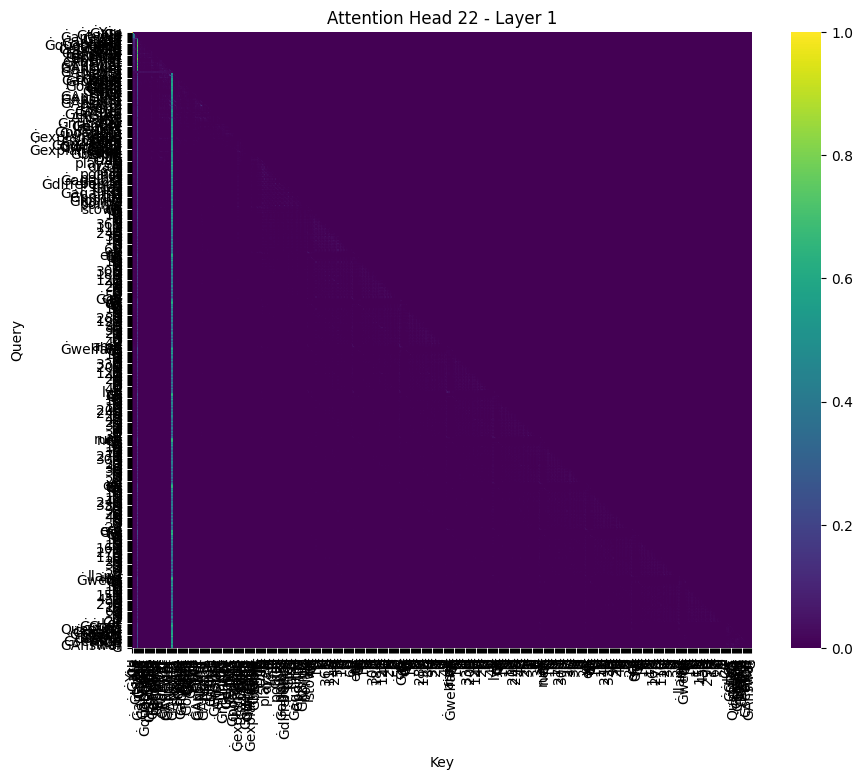

(564, 564)


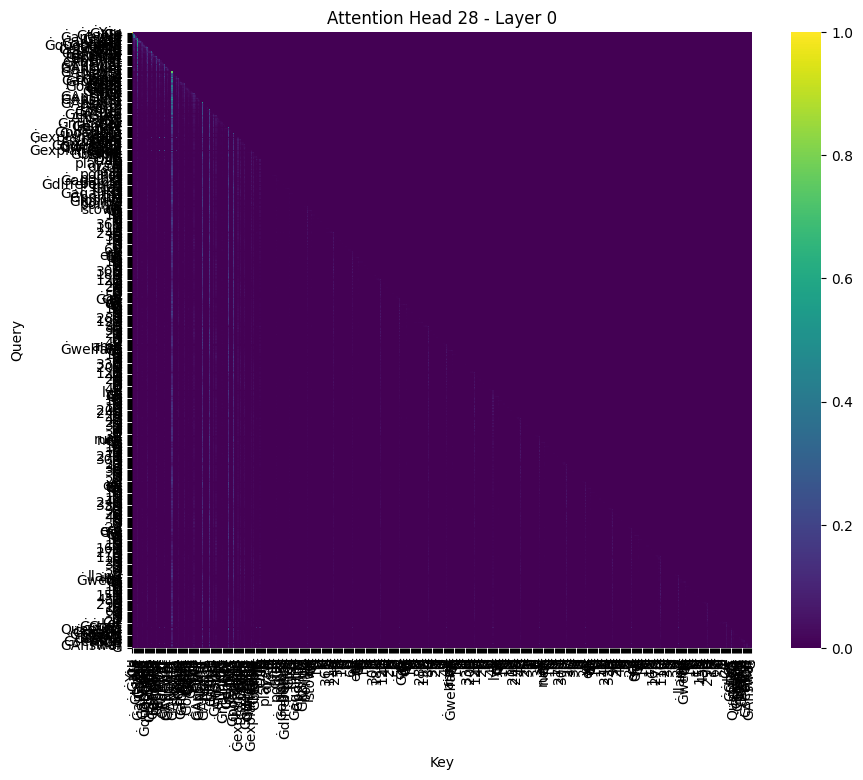

(564, 564)


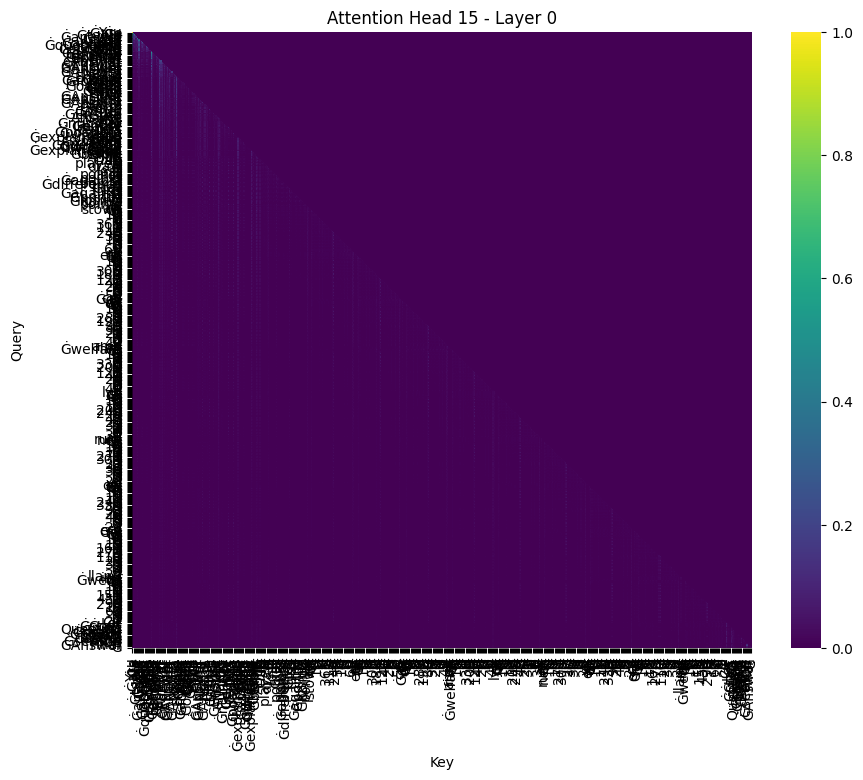

(564, 564)


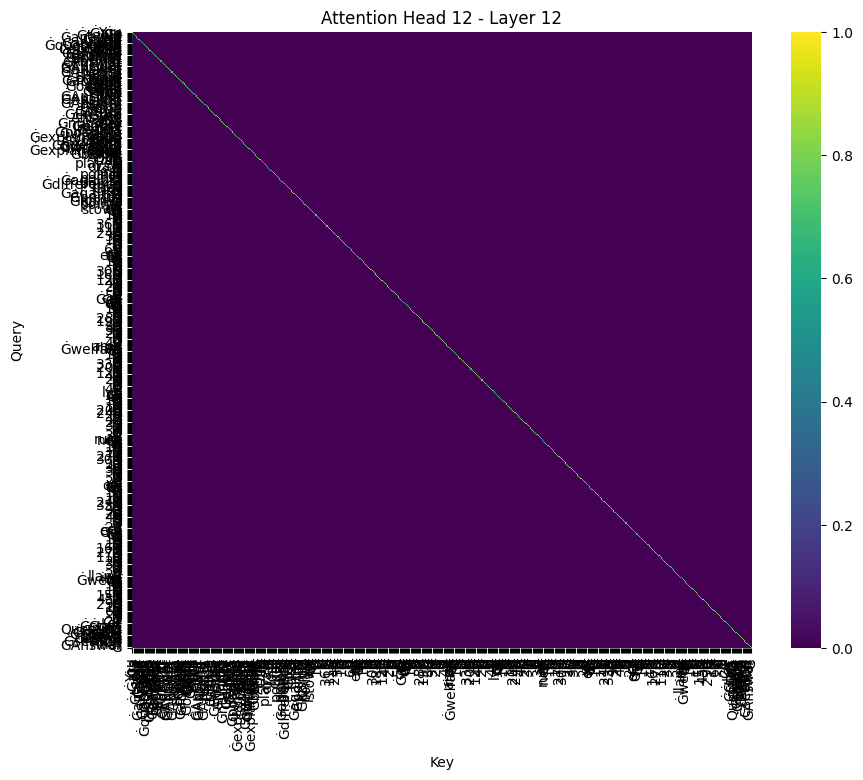

(564, 564)


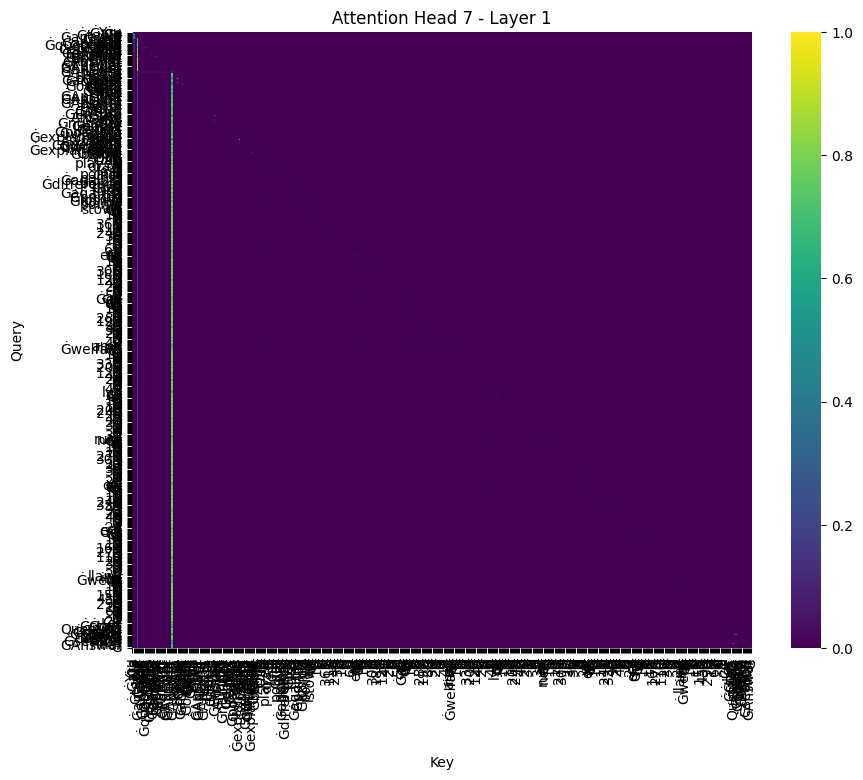

(564, 564)


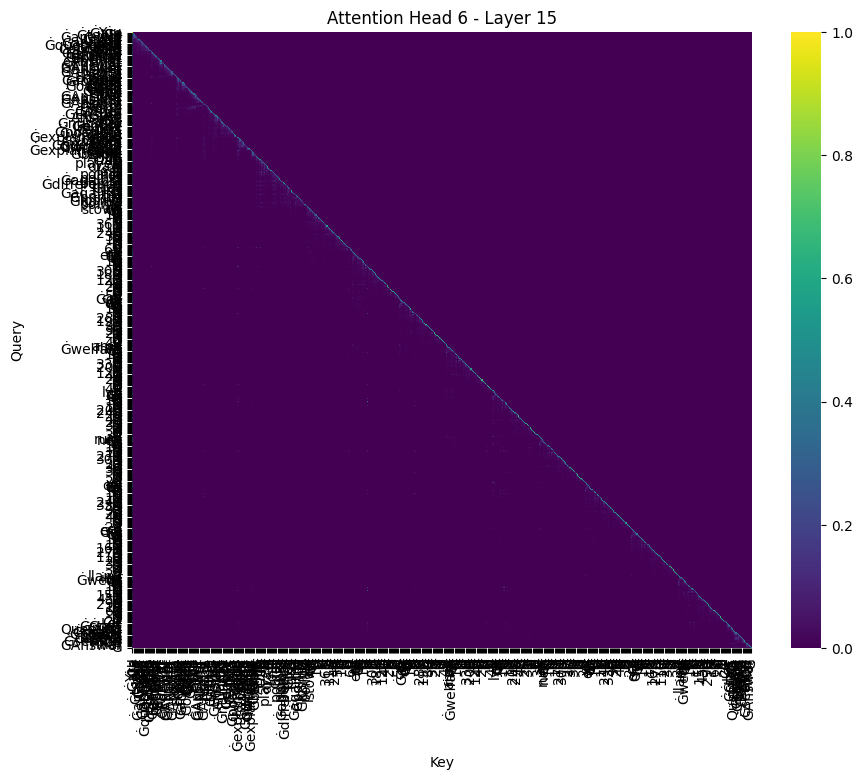

(564, 564)


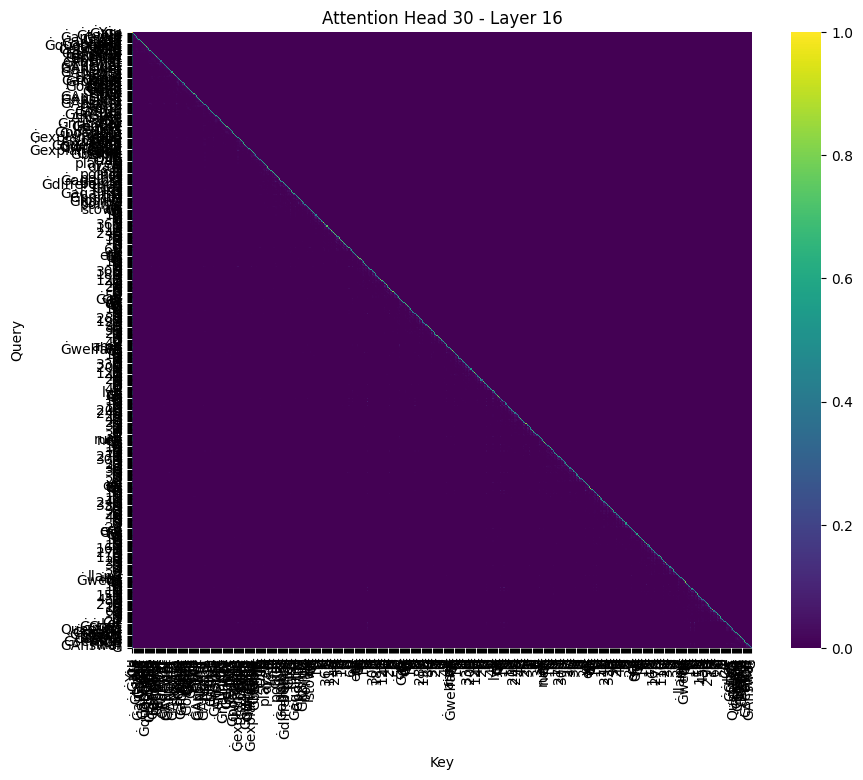

(564, 564)


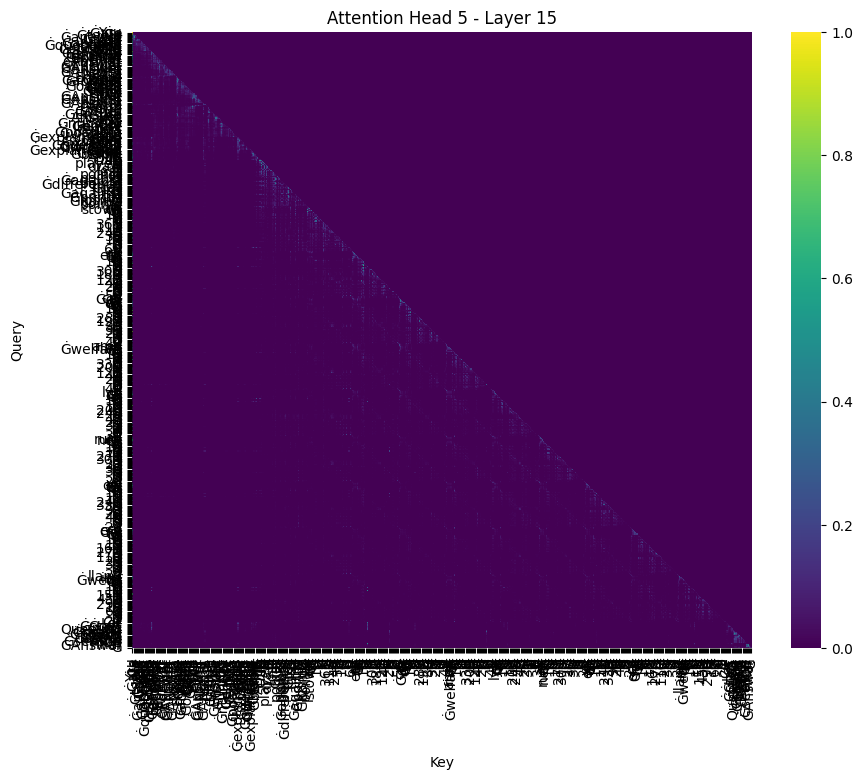

(564, 564)


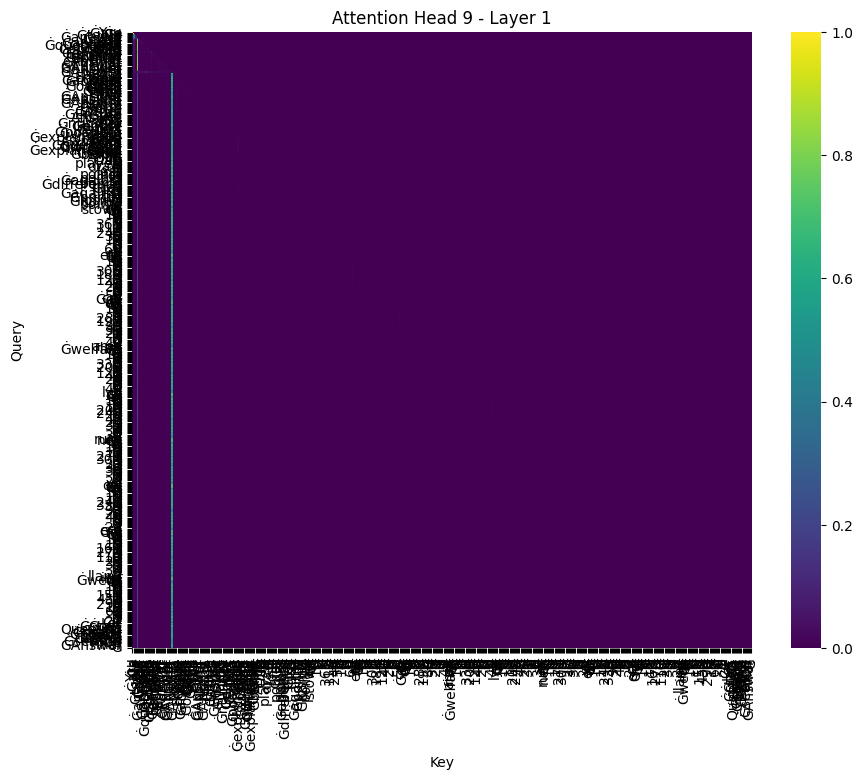

(564, 564)


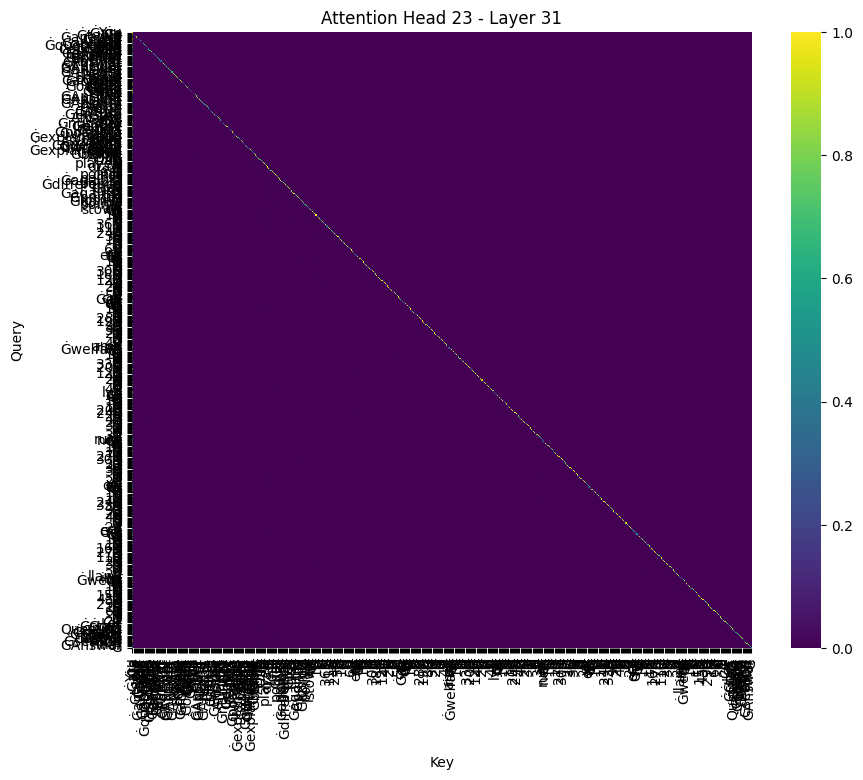

(564, 564)


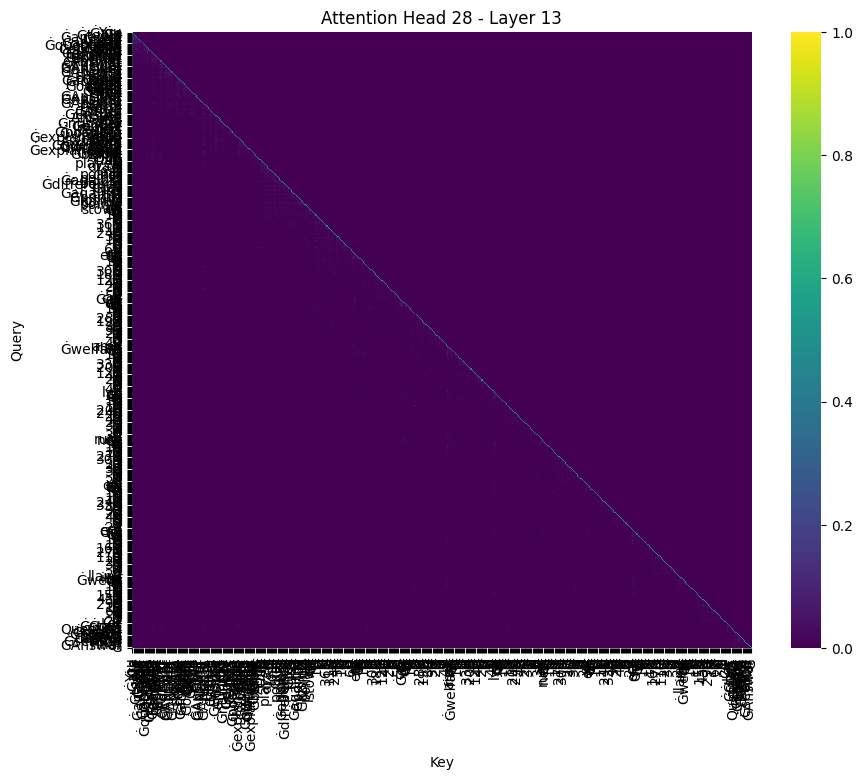

(564, 564)


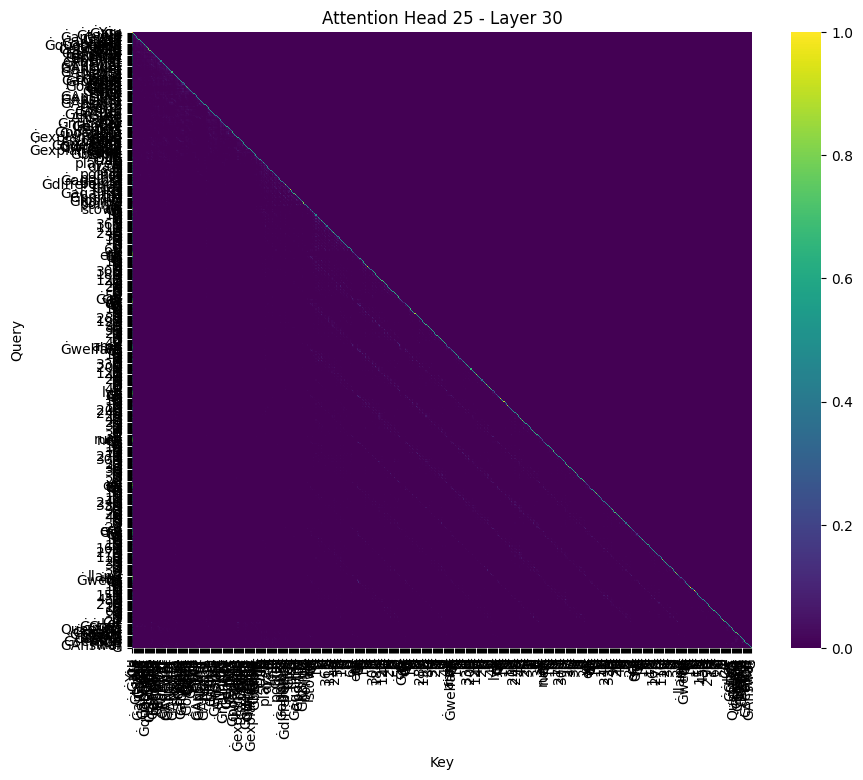

(564, 564)


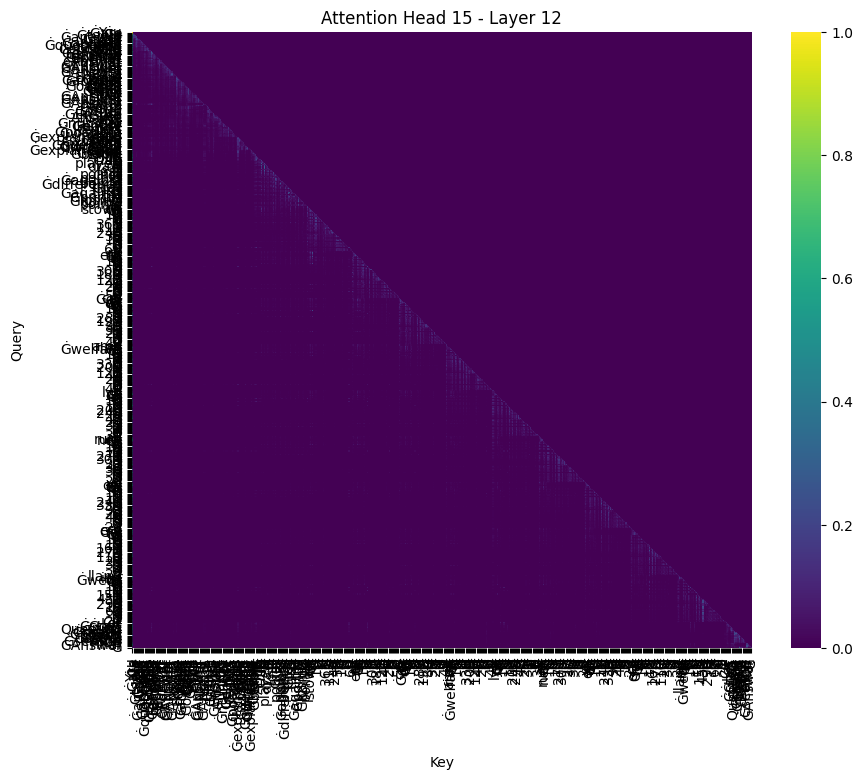

(564, 564)


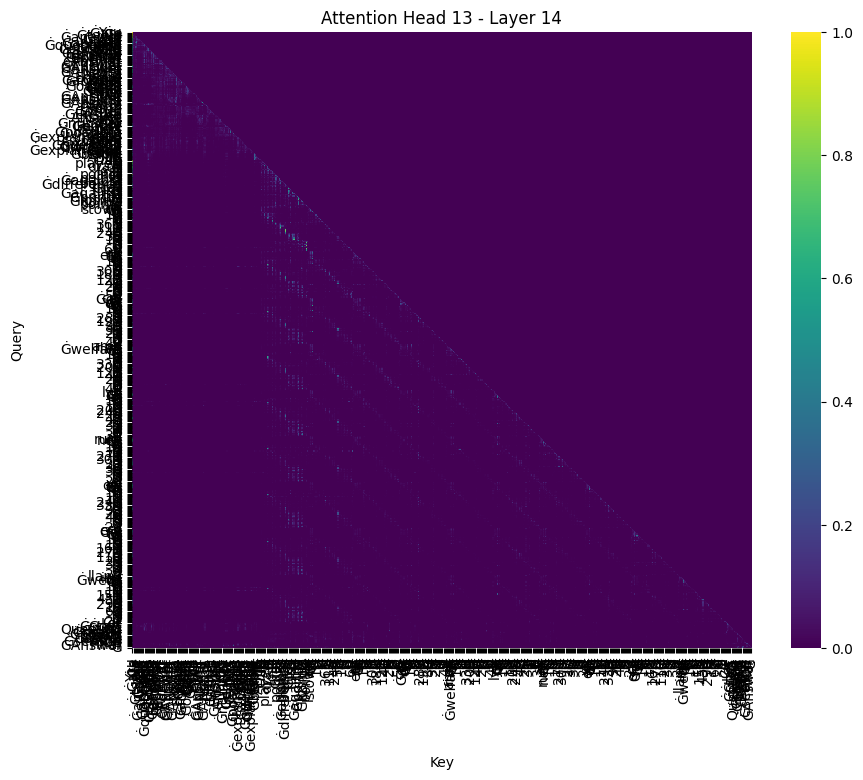

(564, 564)


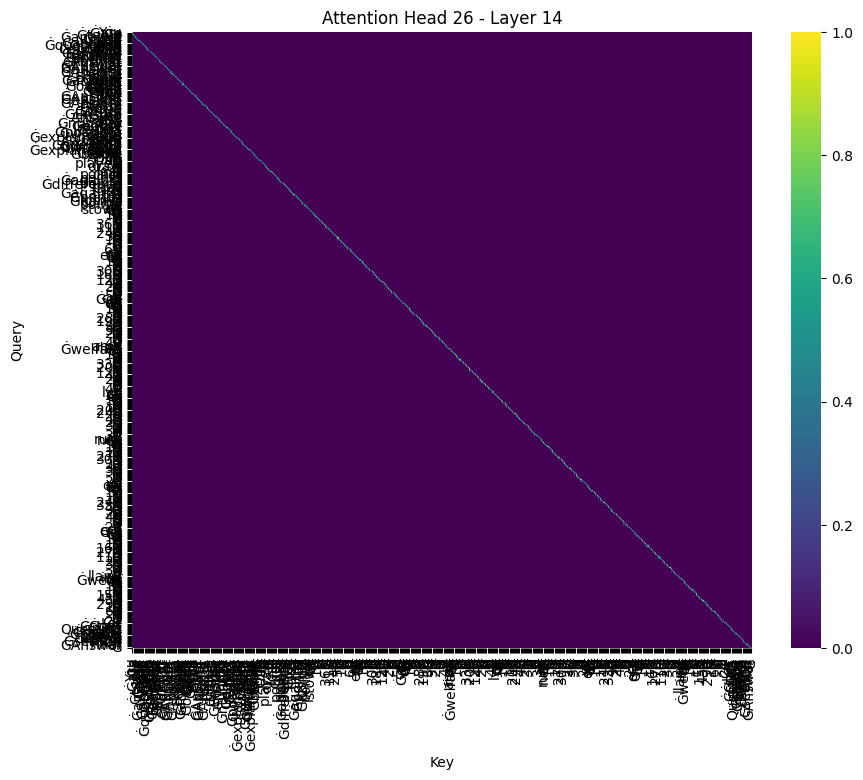

(564, 564)


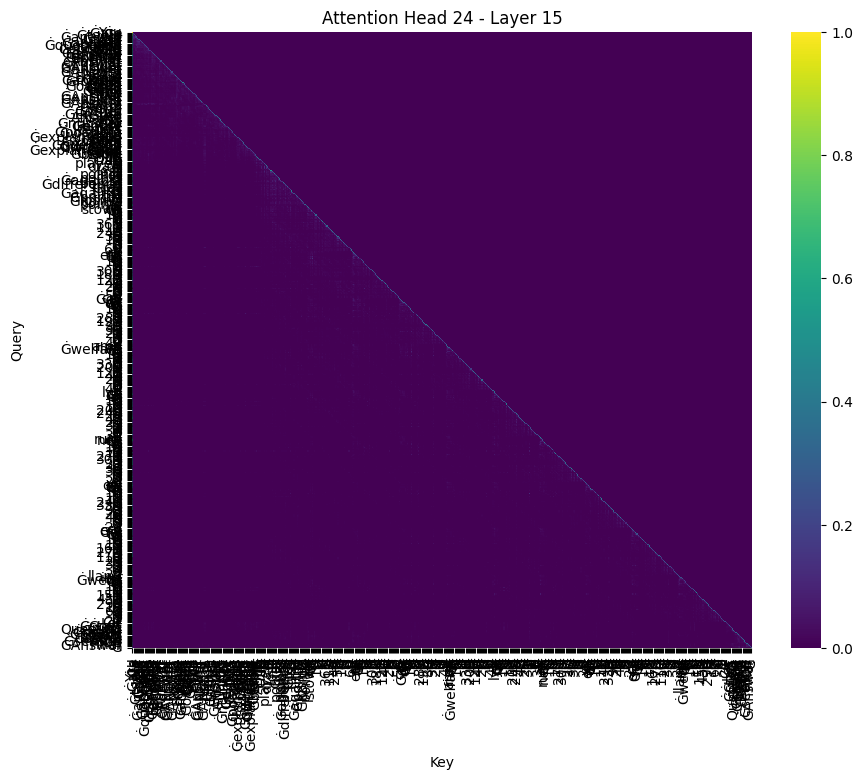

(564, 564)


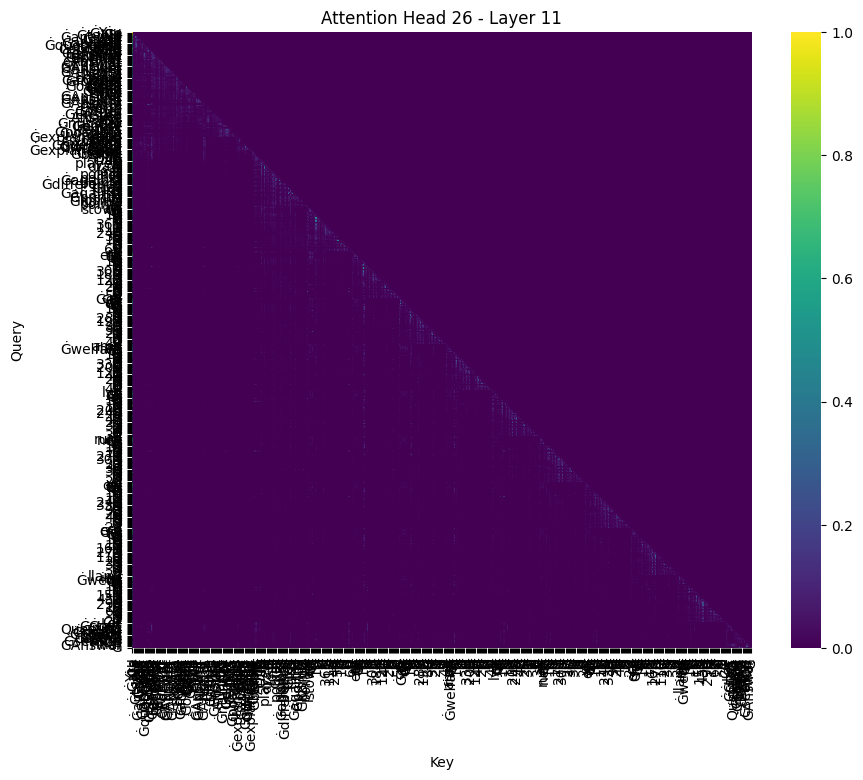

(564, 564)


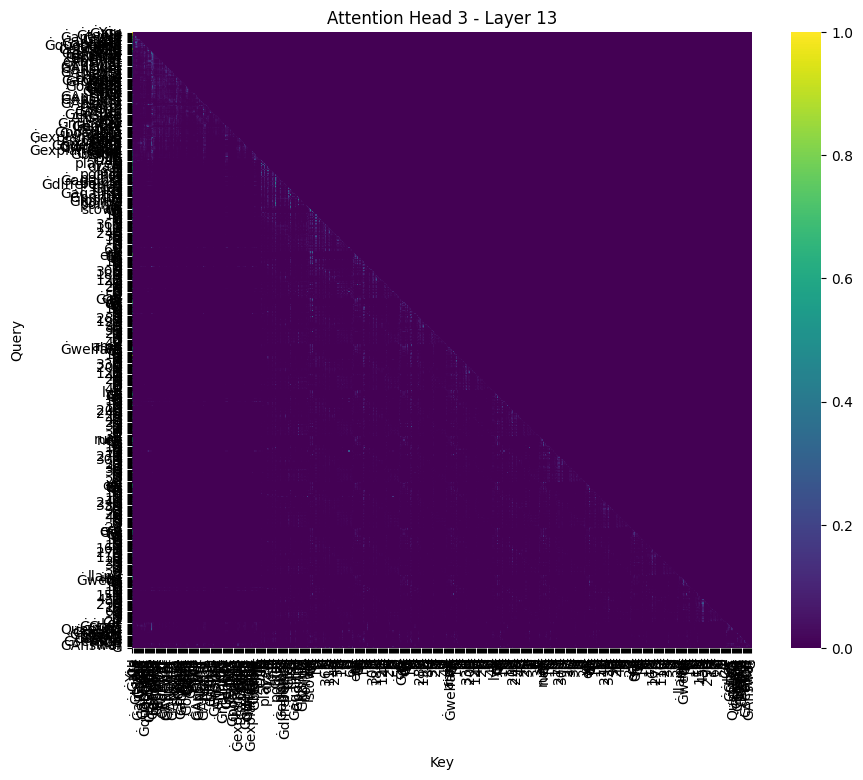

(564, 564)


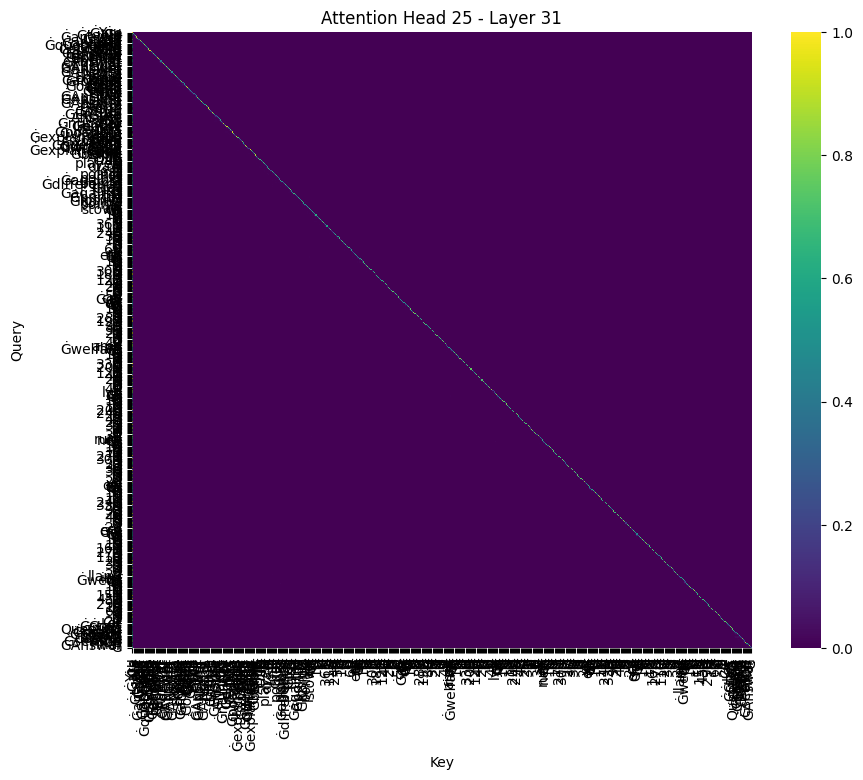

(564, 564)


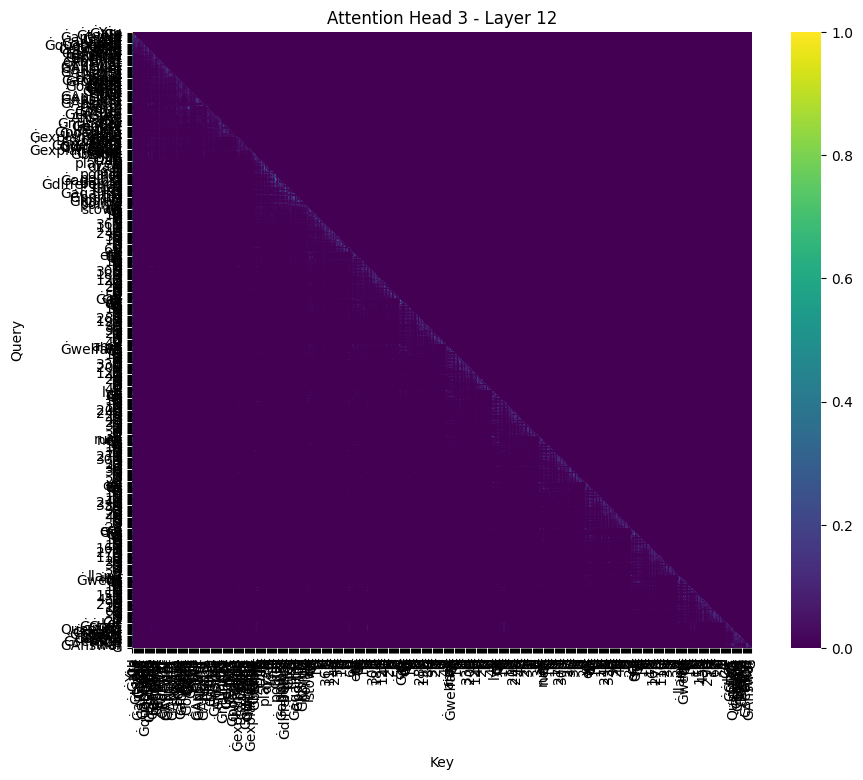

(564, 564)


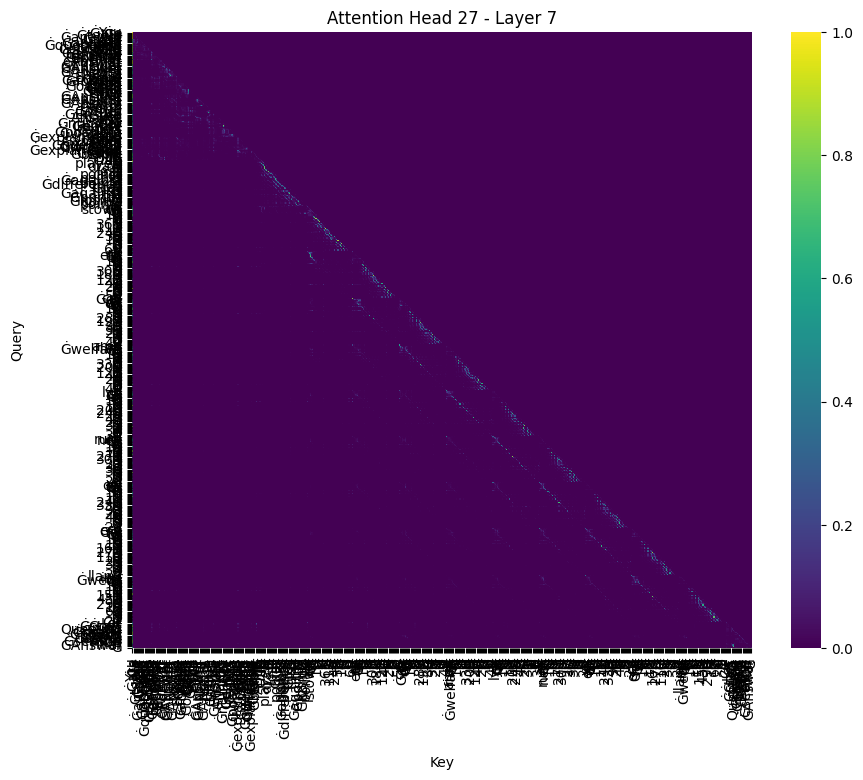

(564, 564)


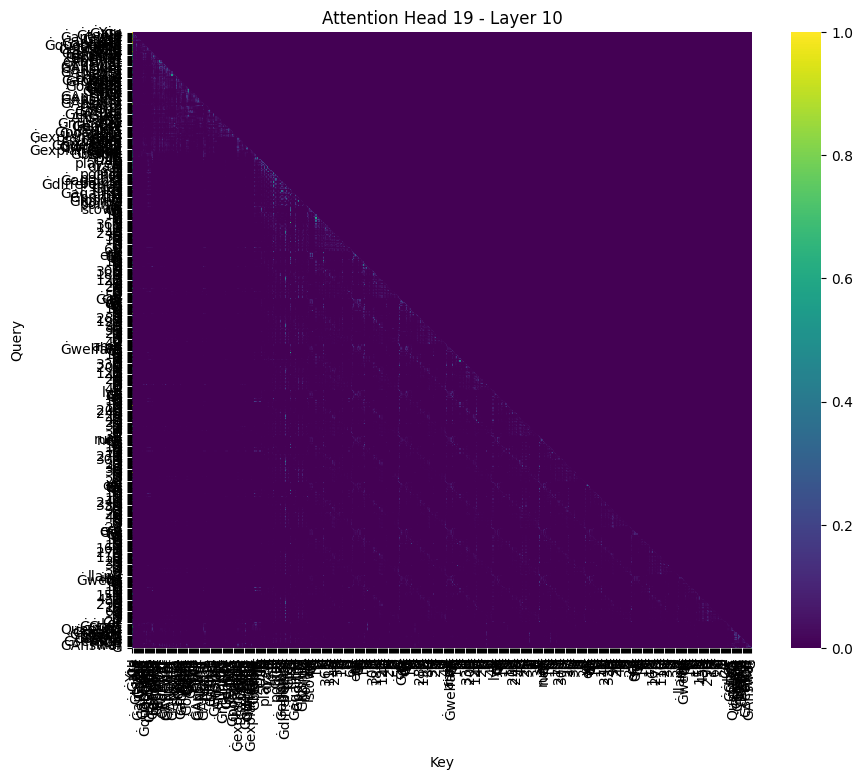

(564, 564)


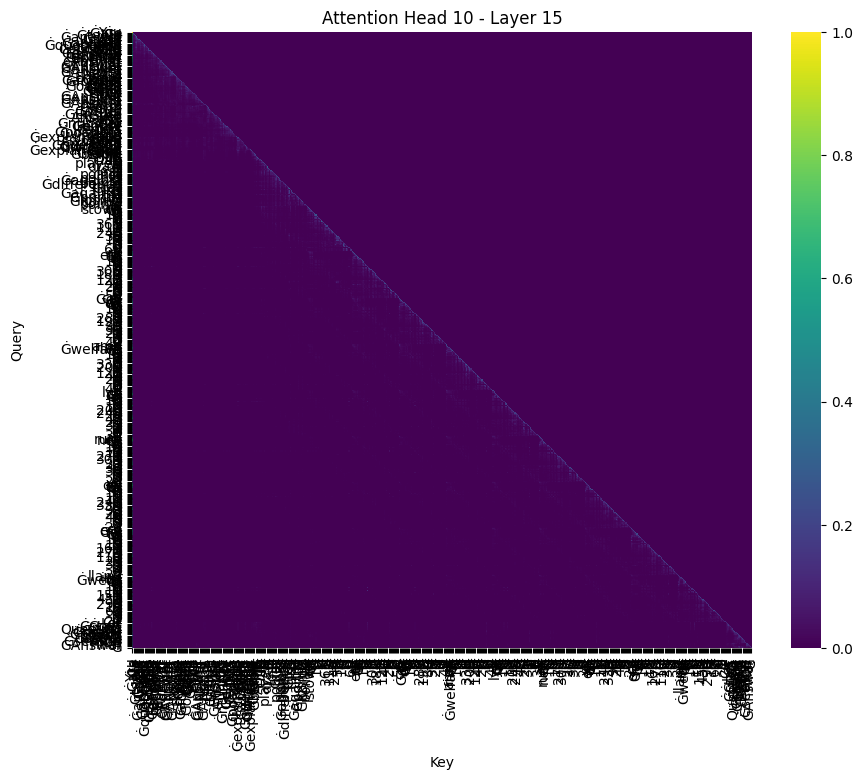

(564, 564)


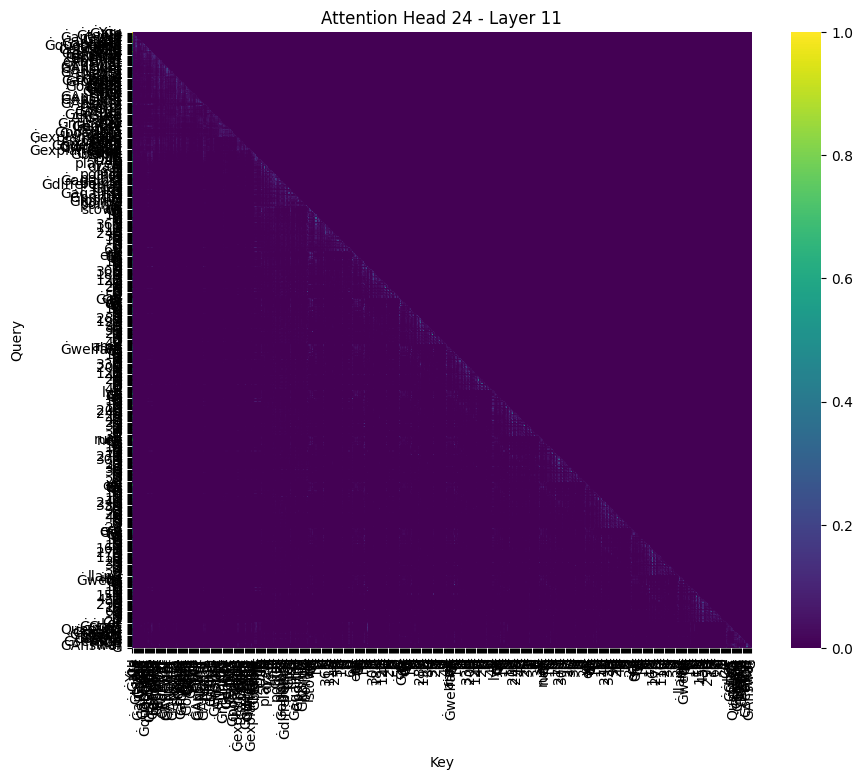

(564, 564)


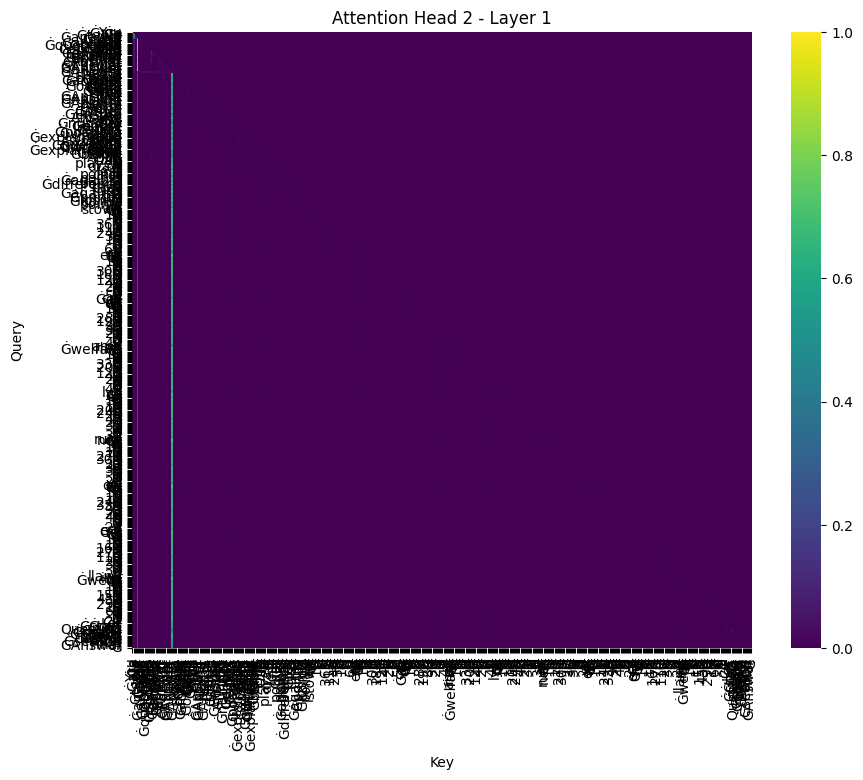

(564, 564)


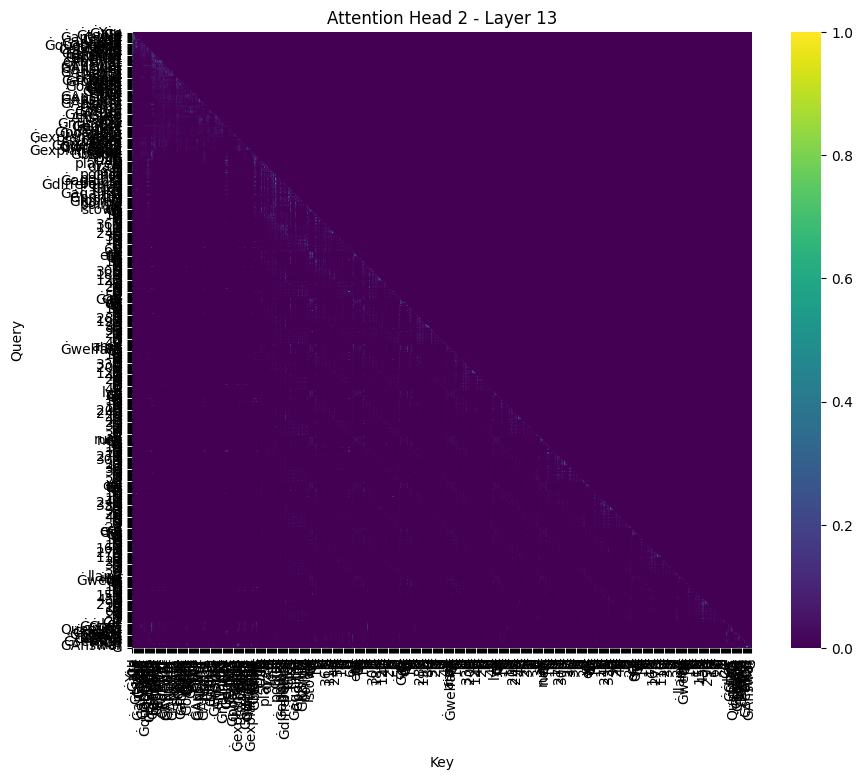

(564, 564)


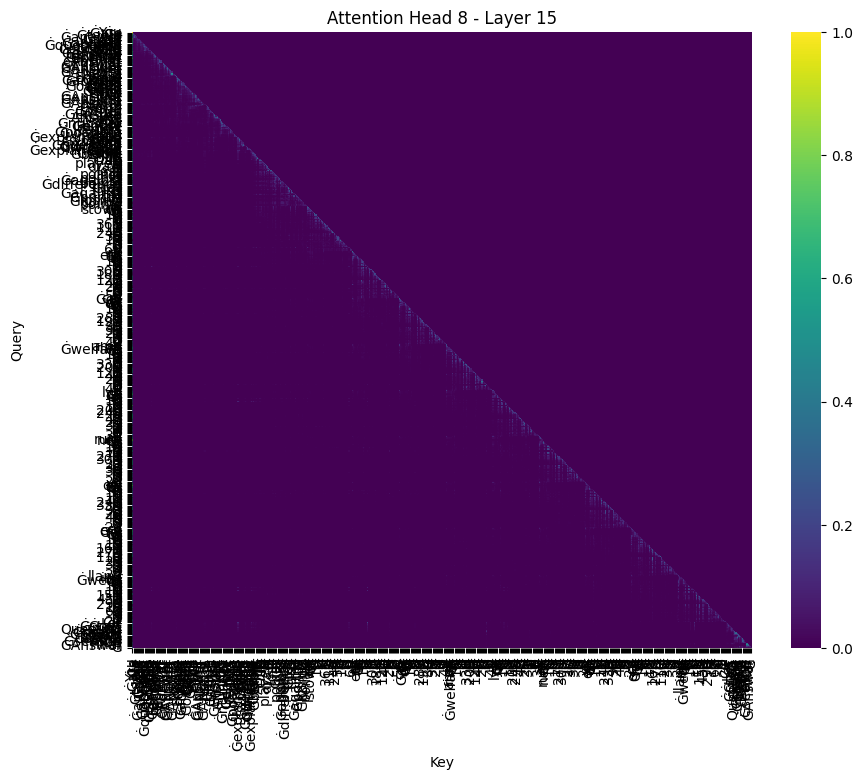

(564, 564)


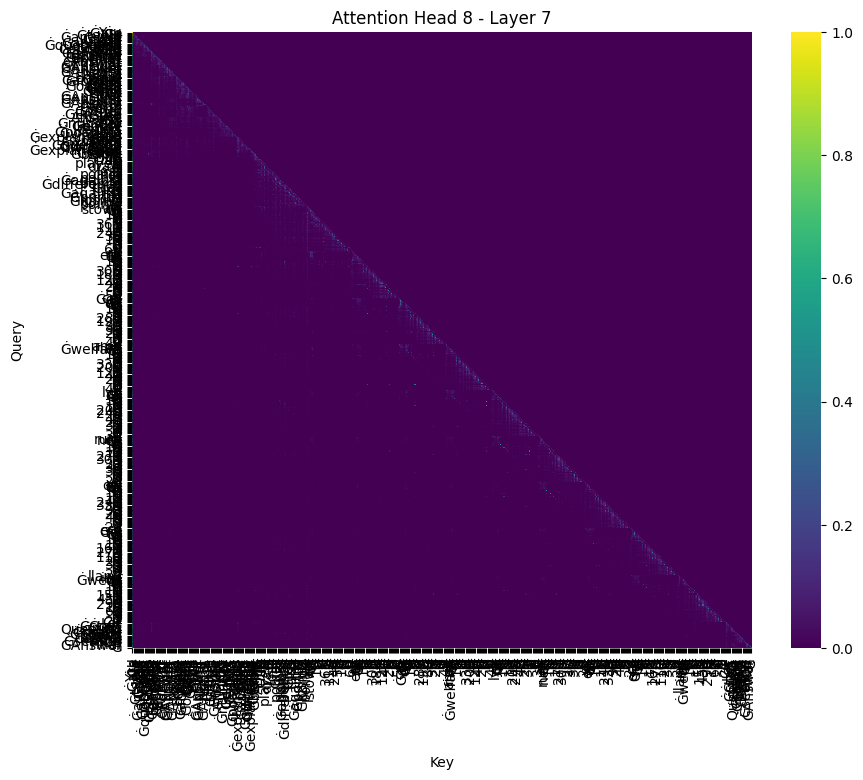

(564, 564)


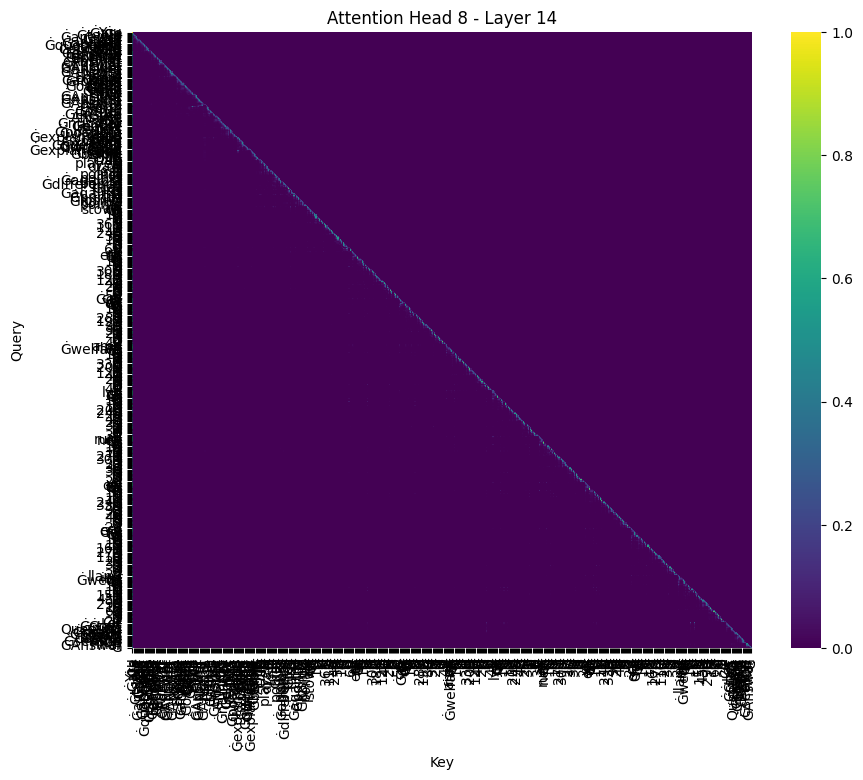

(564, 564)


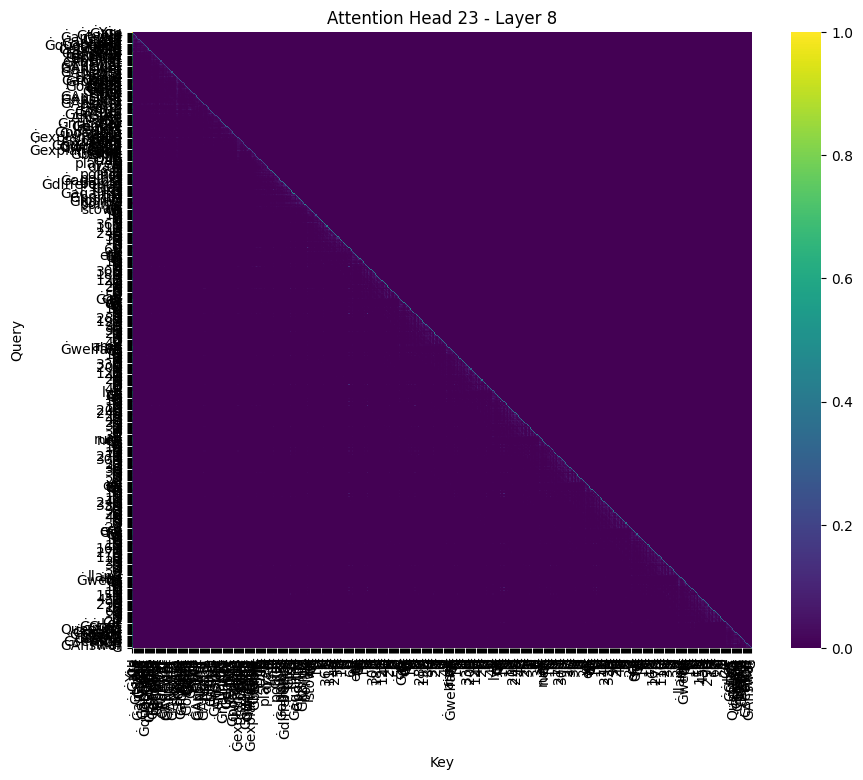

(564, 564)


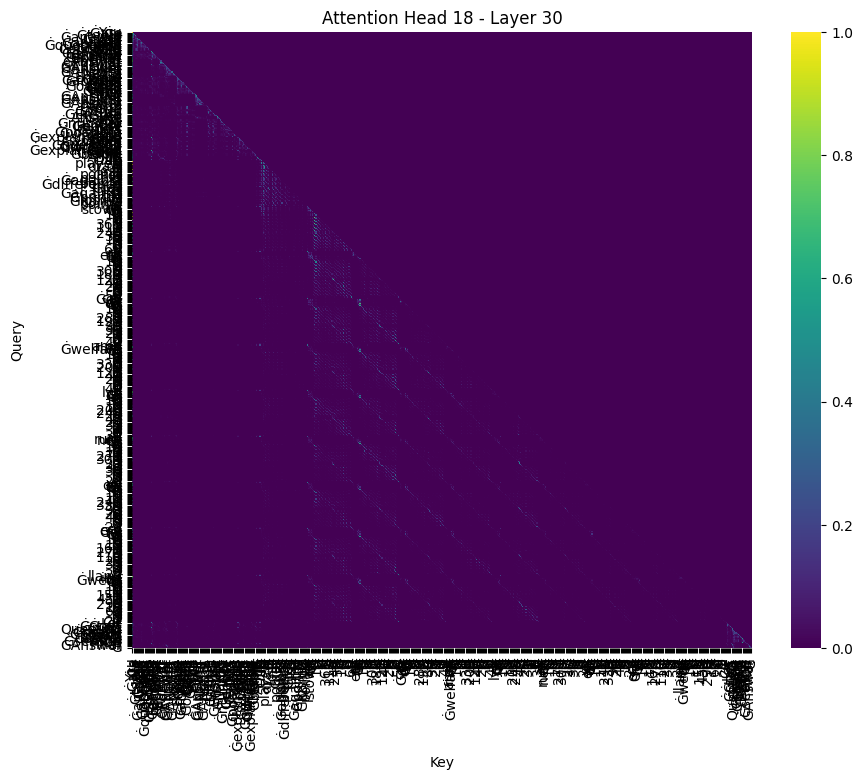

(564, 564)


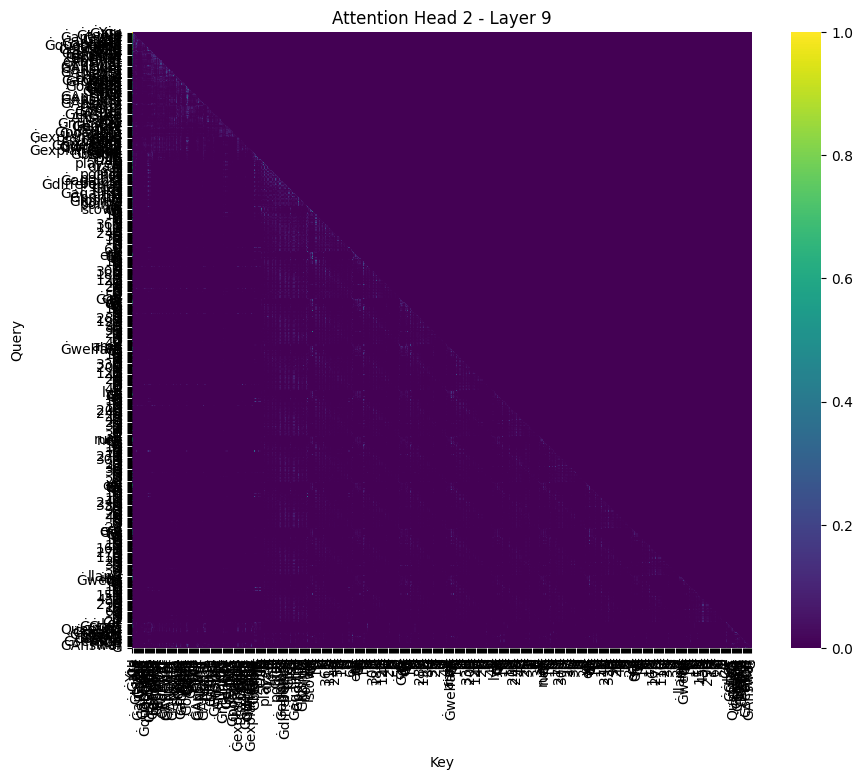

(564, 564)


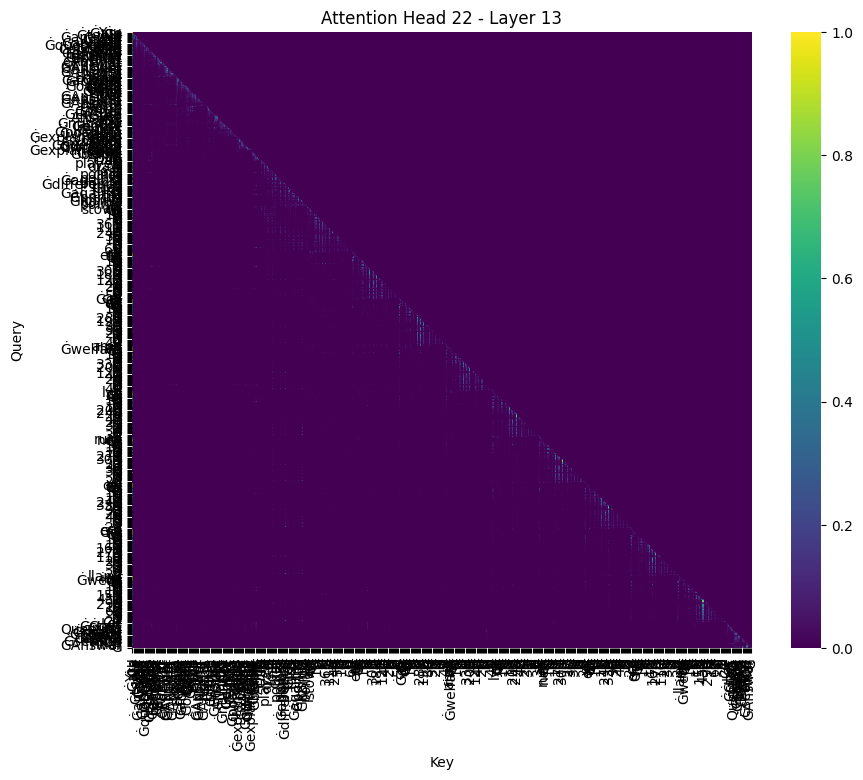

(564, 564)


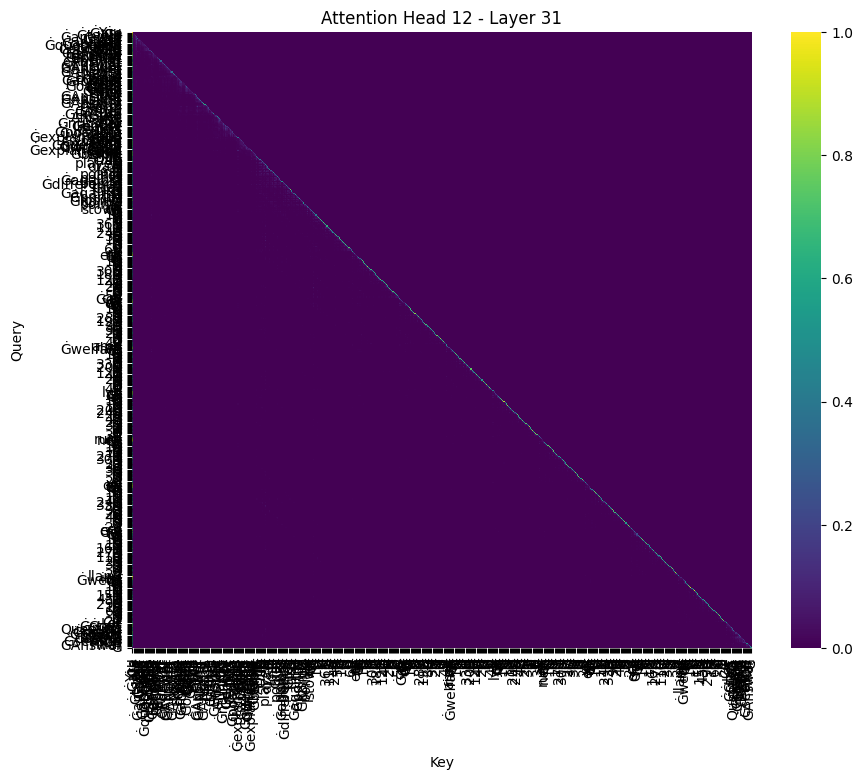

(564, 564)


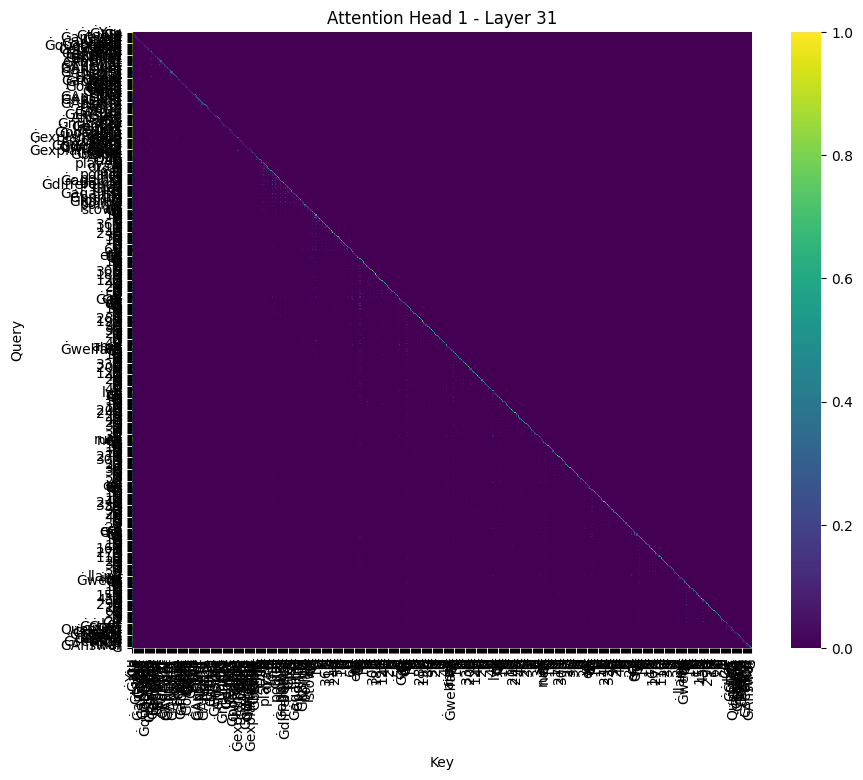

(564, 564)


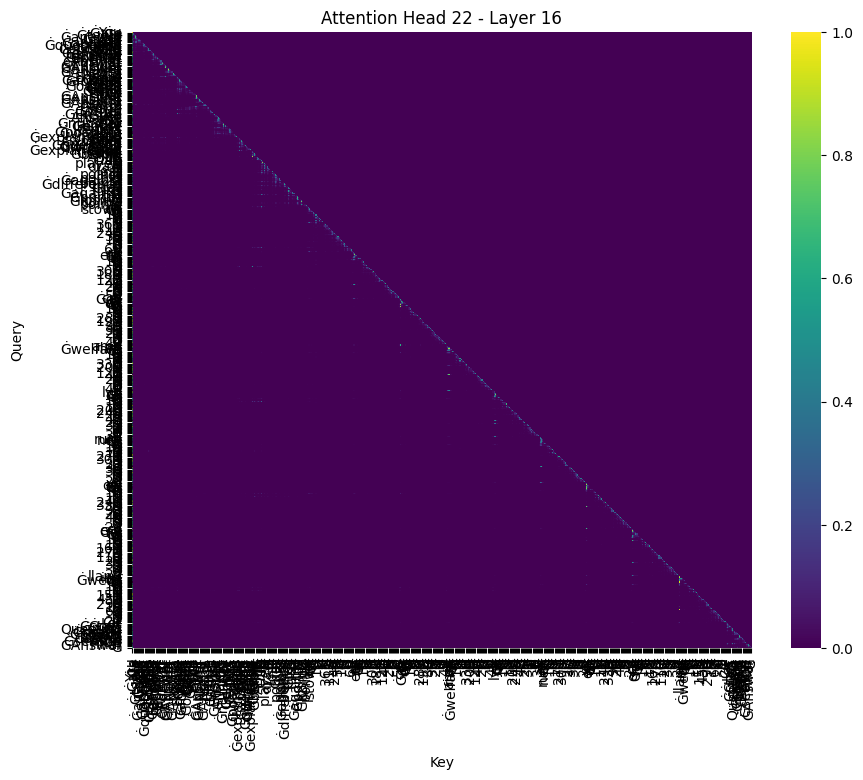

(564, 564)


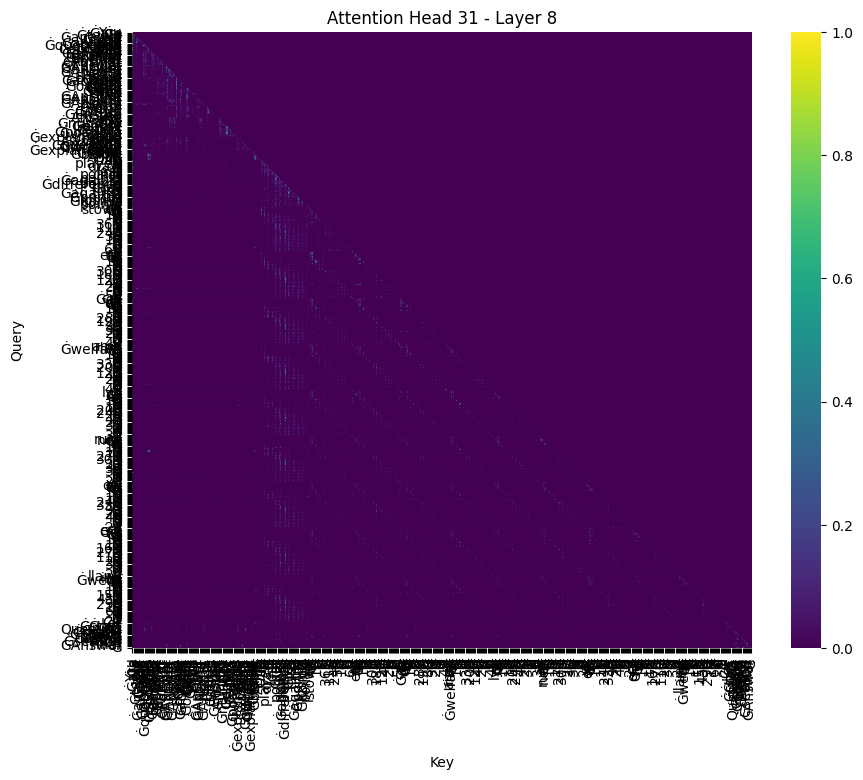

(564, 564)


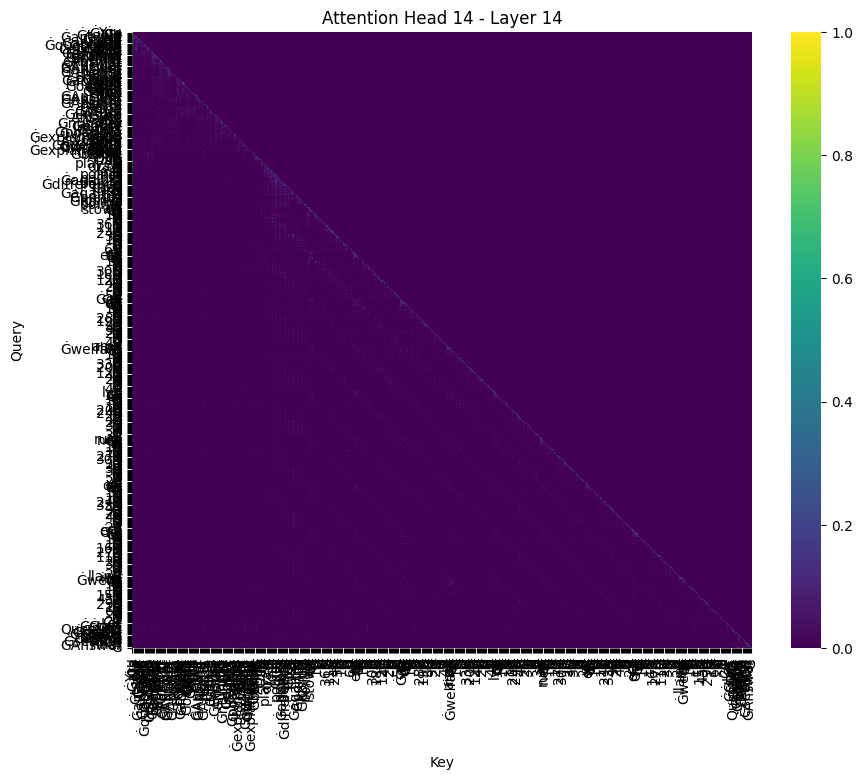

(564, 564)


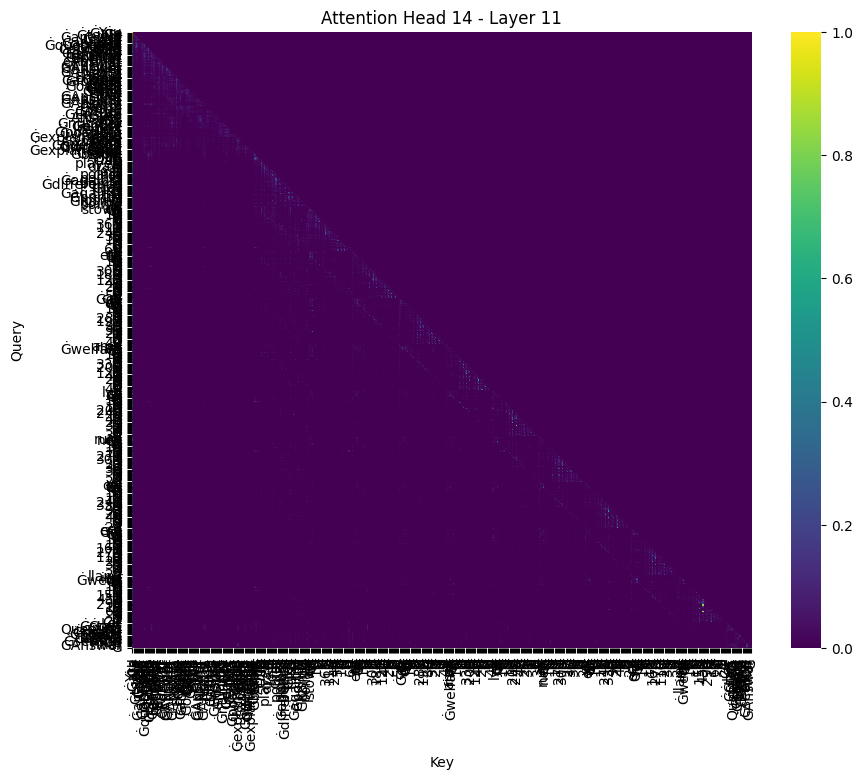

(564, 564)


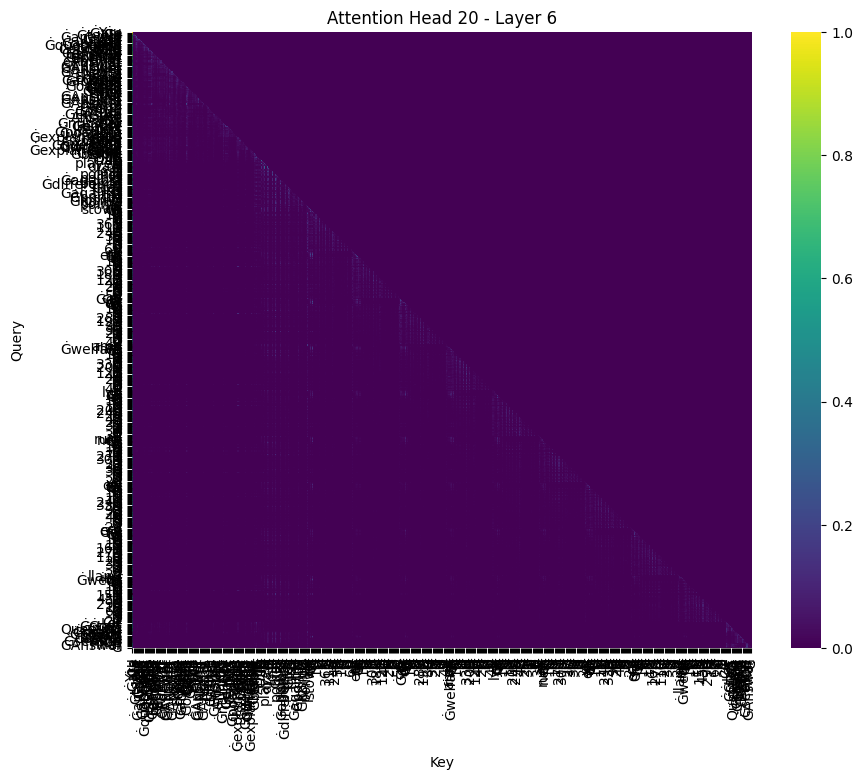

(564, 564)


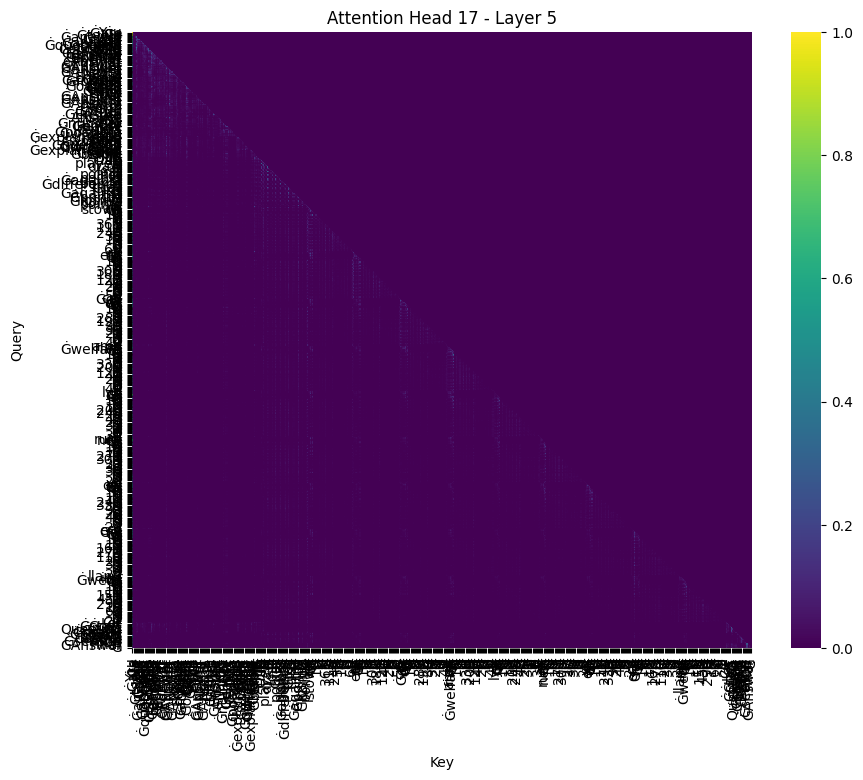

(564, 564)


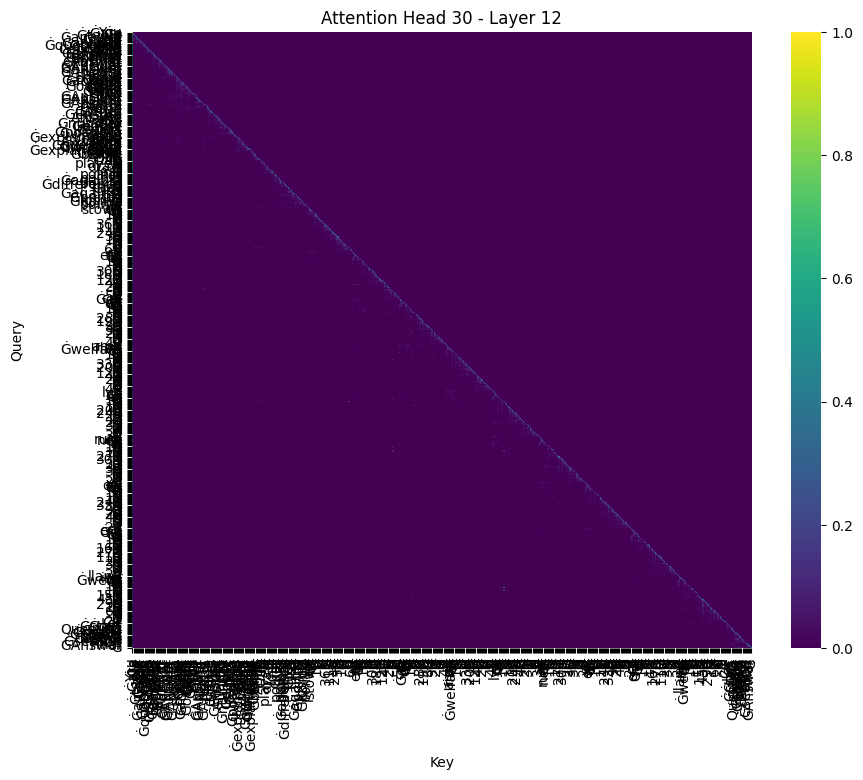

(564, 564)


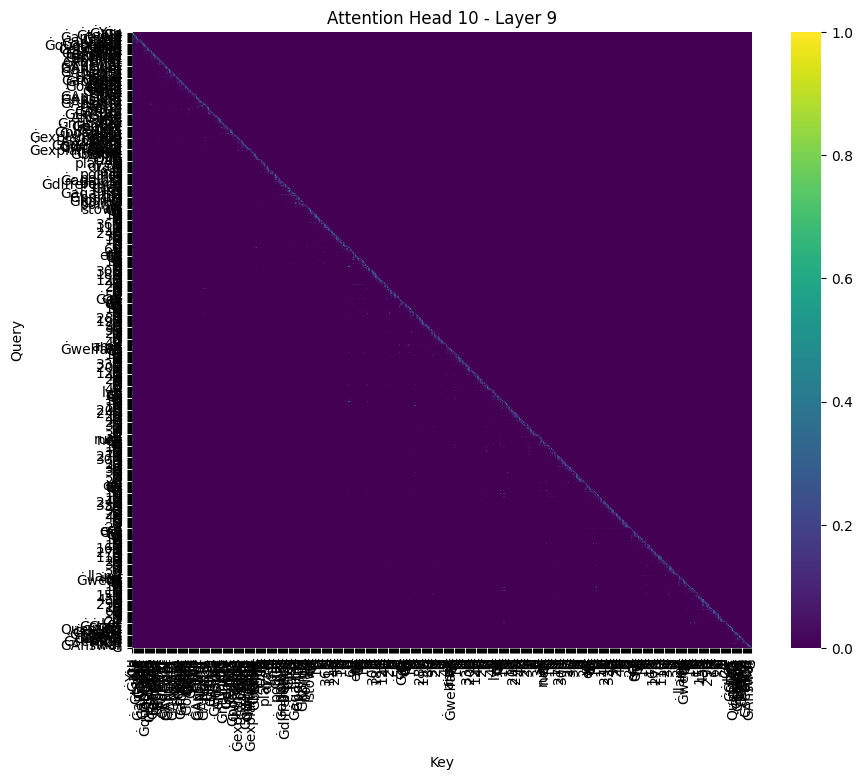

In [39]:
import matplotlib.pyplot as plt
import seaborn as sns

def plot_attention_map(attn_maps, tokens, layer=0, head=0):
    attn_map = attn_maps[layer] # shape: [batch_size, num_heads, seq_len, seq_len]
    attn_weights = attn_map[0]  # Shape: [num_heads, seq_len, seq_len]
    attn = attn_weights[head].cpu().numpy()  # Shape: [seq_len, seq_len]
    print(attn.shape)
    plt.figure(figsize=(10, 8))
    sns.heatmap(attn, xticklabels=tokens, yticklabels=tokens, cmap="viridis")
    plt.title(f"Attention Head {head} - Layer {layer}")
    plt.xlabel("Key")
    plt.ylabel("Query")
    plt.show()


for layer, head in candidates:
    plot_attention_map(attn_maps, tokens, layer=layer, head=head)

In [14]:
import torch.nn.functional as F

def head_entropy(attn_matrix):
    # attn_matrix shape: [seq_len, seq_len]
    p = attn_matrix + 1e-8  # avoid log(0)
    log_p = torch.log(p)
    entropy = -(p * log_p).sum(-1).mean()
    return entropy.item()

entropies = []
for layer_idx, attn in attn_maps.items():
    for head_idx in range(attn.shape[1]):
        entropies.append((layer_idx, head_idx, head_entropy(attn[0, head_idx])))

In [15]:
entropies.sort(key=lambda x: x[2], reverse=True)
for layer_idx, head_idx, entropy in entropies[:10]:
    print(f"Layer {layer_idx}, Head {head_idx}, Entropy: {entropy:.4f}")

Layer 0, Head 23, Entropy: 4.3950
Layer 0, Head 15, Entropy: 4.2190
Layer 0, Head 11, Entropy: 4.0915
Layer 0, Head 8, Entropy: 4.0330
Layer 0, Head 9, Entropy: 3.9612
Layer 13, Head 31, Entropy: 3.8043
Layer 0, Head 13, Entropy: 3.7445
Layer 7, Head 21, Entropy: 3.7223
Layer 0, Head 27, Entropy: 3.7064
Layer 0, Head 14, Entropy: 3.6301
